In [1]:
# ===================================================================
# CELDA 0: SETUP, ESTILO "NATURE-FRIENDLY", RUTAS, REPRODUCIBILIDAD
# ===================================================================
from pathlib import Path
import os, sys, random, warnings
import pandas as pd, numpy as np
import matplotlib as mpl, matplotlib.pyplot as plt
import seaborn as sns
try:
    import torch
except Exception:
    torch = None

warnings.filterwarnings("ignore", category=FutureWarning)

# Reproducibilidad estricta
SEED = 42
random.seed(SEED); np.random.seed(SEED)
if torch is not None:
    try:
        torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
    except Exception:
        pass

# Estilo "Nature-friendly"
sns.set_theme(style="whitegrid", context="paper")
mpl.rcParams.update({
    "pdf.fonttype": 42, "ps.fonttype": 42,  # TrueType embebido
    "font.size": 9, "axes.titlesize": 10, "axes.labelsize": 9,
    "xtick.labelsize": 8, "ytick.labelsize": 8, "legend.fontsize": 8,
    "figure.dpi": 300, "savefig.pad_inches": 0.02,
    "axes.spines.top": False, "axes.spines.right": False,
    "axes.grid": True, "axes.grid.which": "major",
})

# Rutas base (ajusta si cambias la estructura)
BASE_RUN_DIR   = Path("./resultados_13_paper")
CLF            = "mlp"
SUFFIX         = "_integrated_gradients_top50"
N_FOLDS        = 5

# Salidas
FIG_DIR   = Path("./Figures_Nature"); FIG_DIR.mkdir(exist_ok=True, parents=True)
TBL_DIR   = Path("./Tables_Nature");  TBL_DIR.mkdir(exist_ok=True, parents=True)

def savefig_nature(fig, path_no_ext: Path):
    """Guarda .pdf y .png con metadatos y bbox correcto."""
    path_no_ext = Path(path_no_ext)
    fig.savefig(f"{path_no_ext}.pdf", bbox_inches="tight",
                metadata={"Creator": "Matplotlib", "Title": path_no_ext.name})
    fig.savefig(f"{path_no_ext}.png", bbox_inches="tight", dpi=300,
                metadata={"Creator": "Matplotlib"})

print("✅ Entorno gráfico listo. Semillas fijadas y estilo aplicado.")

✅ Entorno gráfico listo. Semillas fijadas y estilo aplicado.


### Atribución en el espacio latente (SHAP)

Sea $x$ el conectoma multicanal y $f:\mathbb{R}^d\to[0,1]$ el clasificador que recibe $\mu(x)\in\mathbb{R}^d$ (medias latentes del VAE) y metadatos $m$.
Para cada latente $\ell$, el valor SHAP $ \phi_\ell(x) $ aproxima la contribución marginal esperada de $\mu_\ell(x)$ a $f$.
Definimos un peso discriminativo por latente como diferencia de medias entre grupos:

$$
w_\ell \;=\; \mathbb{E}[\phi_\ell \mid AD]\;-\;\mathbb{E}[\phi_\ell \mid CN],
\qquad \text{y normalizamos } \; \tilde{w}_\ell = \frac{w_\ell}{\sum_k |w_k|}.
$$

Estos $\tilde{w}$ inducen una función escalar de saliencia
$$
F(x)\;=\;\sum_{\ell=1}^d \tilde{w}_\ell\, \mu_\ell(x) \;=\; \tilde{w}^{\top}\,\mu(x),
$$
que resume “hacia AD” (signo +) o “hacia CN” (−) en el espacio latente.


In [2]:
# ===================================================================
# CELDA 1: CANALES (coherentes con tu CLI: --channels_to_use 1 2 5)
# ===================================================================
CHANNEL_CATALOG = {
    0: "Pearson_OMST_GCE_Signed_Weighted",
    1: "Pearson_Full_FisherZ_Signed",
    2: "MI_kNN_Symmetric",
    3: "dFC_AbsDiffMean",
    4: "dFC_StdDev",
    5: "DistanceCorr",
    6: "Granger_F_lag1",
}
CHANNELS_TO_USE = [1, 2, 5]
sel_names = [CHANNEL_CATALOG[c] for c in CHANNELS_TO_USE]
print("[Canales]", CHANNELS_TO_USE, "=>", sel_names)

# Para el paper: C debe ser 3 (no 4) y nombres como arriba.


[Canales] [1, 2, 5] => ['Pearson_Full_FisherZ_Signed', 'MI_kNN_Symmetric', 'DistanceCorr']


In [3]:
# ===================================================================
# CELDA 2: CARGA RANKINGS MULTI-FOLD -> df_full
# ===================================================================
all_folds = []
for i in range(1, N_FOLDS + 1):
    path = BASE_RUN_DIR / f"fold_{i}/interpretability_{CLF}/ranking_conexiones_ANOTADO{SUFFIX}.csv"
    if not path.exists():
        print(f"⚠️ Falta fold {i}: {path}")
        continue
    df_i = pd.read_csv(path)
    # ID canónico (tupla ordenada)
    df_i["connection_id"] = [tuple(sorted(x)) for x in zip(df_i["src_AAL3_Name"], df_i["dst_AAL3_Name"])]
    df_i["fold"] = i
    all_folds.append(df_i)

if not all_folds:
    raise FileNotFoundError("No se encontró ningún ranking de conexiones.")

df_full = pd.concat(all_folds, ignore_index=True)
print(f"✅ df_full con {df_full['fold'].nunique()} folds y {len(df_full)} filas.")


✅ df_full con 5 folds y 42575 filas.


In [4]:
# ===================================================================
# CELDA 2bis: UTILIDADES PARA ID CANÓNICO DE CONEXIÓN
# ===================================================================

def to_conn_tuple(df):
    """Devuelve tuplas (src, dst) ordenadas alfabéticamente para el df dado."""
    return [tuple(sorted(x)) for x in zip(df["src_AAL3_Name"], df["dst_AAL3_Name"])]

def conn_tuple_to_str(t):
    """String ad-hoc 'src—dst' desde tupla (src, dst)."""
    return f"{t[0]}—{t[1]}"

# Normaliza df_full si fuese necesario (debería ya estar como tupla, pero por las dudas)
if "connection_id" in df_full.columns:
    if not isinstance(df_full["connection_id"].iloc[0], tuple):
        df_full["connection_id"] = to_conn_tuple(df_full)

assert df_full["connection_id"].map(type).eq(tuple).all(), "connection_id DEBE ser tupla en df_full"


In [5]:
from collections import Counter

TOP_K_STABILITY = 200
n_folds = df_full['fold'].nunique()

# π: frecuencia Top-K por fold
top_sets = df_full[df_full["Rank"] <= TOP_K_STABILITY].groupby("fold")["connection_id"].apply(set)
pi = pd.Series(Counter(e for s in top_sets for e in s)).div(n_folds); pi.name = "pi"

# τ: consistencia de signo (media de signos por fold, valor absoluto)
sign = np.sign(df_full.set_index(["connection_id","fold"])["Saliency_Score"]).unstack()
tau = sign.mean(axis=1).abs(); tau.name = "tau"

df_stability = pd.concat([pi, tau], axis=1).fillna({"pi":0.0})
df_stability["score"] = df_stability["pi"] * df_stability["tau"]

CONS_PI, CONS_TAU = 0.6, 0.6
consensus_set = df_stability.query("pi >= @CONS_PI and tau >= @CONS_TAU").sort_values("score", ascending=False)
print(f"🔎 Consensus Set: {len(consensus_set)} aristas (π≥{CONS_PI}, τ≥{CONS_TAU})")
display(consensus_set.head(10))


🔎 Consensus Set: 17 aristas (π≥0.6, τ≥0.6)


,,pi,tau,score
CER9R,CIPL,1.0,0.6,0.60
O1L,O1R,0.8,0.6,0.48
PALLR,V1R,0.6,0.6,0.36
FMOR,T2R,0.6,0.6,0.36
CER10R,OFCANTR,0.6,0.6,0.36
T2AR,T2R,0.6,0.6,0.36
PQR,VER6,0.6,0.6,0.36
O2R,VER6,0.6,0.6,0.36
CER7BR,OFCLATR,0.6,0.6,0.36
HIPPOR,INR,0.6,0.6,0.36


In [6]:
# Lateralidad robusta (excluye línea media)
midline_tokens = {'VER','VPL','PAG','NCR','tVPL','VER7','VER8','VER9'}

def hemi_of(roi: str) -> str:
    if not isinstance(roi, str): return 'U'
    if roi.endswith('R'): return 'R'
    if roi.endswith('L'): return 'L'
    base = ''.join([c for c in roi if not c.isdigit()])
    return 'M' if any(t in base for t in midline_tokens) else 'U'

df_full['hemi_src'] = df_full['src_AAL3_Name'].map(hemi_of)
df_full['hemi_dst'] = df_full['dst_AAL3_Name'].map(hemi_of)

df_lat_clean = df_full.query("hemi_src in ['L','R'] and hemi_dst in ['L','R']").copy()
print("✅ Columnas hemisferio añadidas y conexiones de línea media filtradas.")
print(f"   - Conexiones para análisis de lateralidad: {len(df_lat_clean)}")

def p_rr_by_fold(df: pd.DataFrame, K: int) -> pd.DataFrame:
    df_intra = df[df['hemi_src'] == df['hemi_dst']]
    top = df_intra[df_intra["Rank"] <= K]
    out=[]
    for f, g in top.groupby("fold", observed=True):
        rr = (g["hemi_src"] == "R").sum()
        ll = (g["hemi_src"] == "L").sum()
        n  = rr + ll
        out.append({"fold": int(f), "TopK": K, "p_RR": (rr / n) if n>0 else np.nan})
    return pd.DataFrame(out)

df_lat_plot = pd.concat([p_rr_by_fold(df_lat_clean, K) for K in (50,100,200)], ignore_index=True)
print("✅ df_lat_plot listo."); display(df_lat_plot.head())


✅ Columnas hemisferio añadidas y conexiones de línea media filtradas.
   - Conexiones para análisis de lateralidad: 38130
✅ df_lat_plot listo.


,fold,TopK,p_RR
0,1,50,0.689655
1,2,50,0.857143
2,3,50,1.000000
3,4,50,0.843750
4,5,50,0.956522


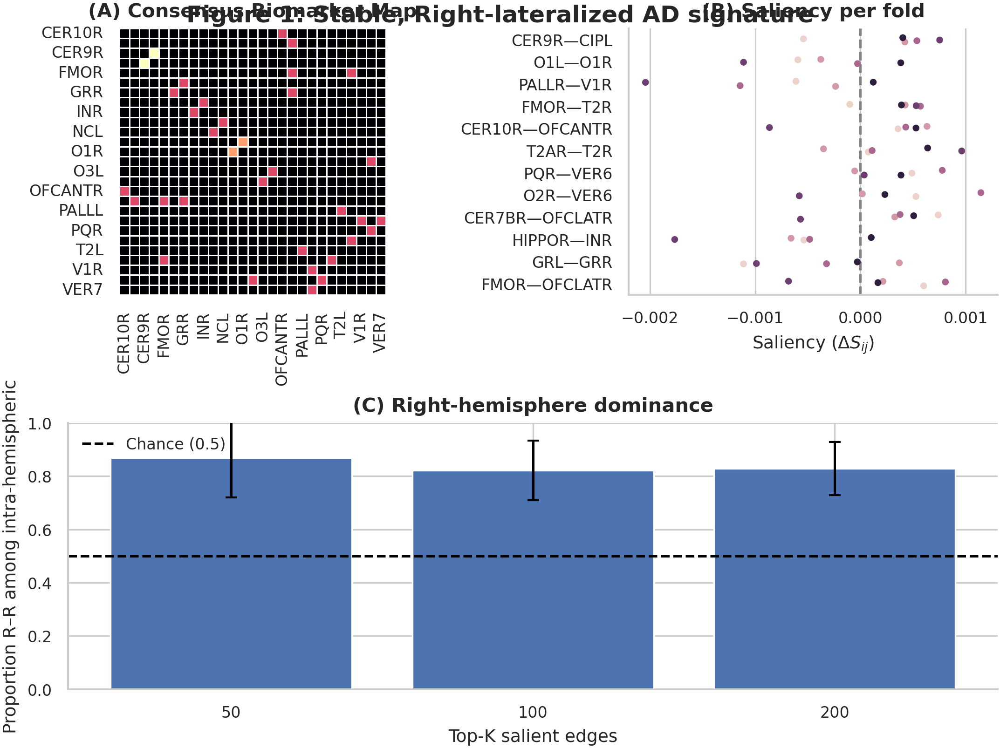

In [7]:
import matplotlib.gridspec as gridspec
from scipy.stats import t

fig = plt.figure(figsize=(7.2, 5.4), constrained_layout=True)
gs  = gridspec.GridSpec(2, 2, figure=fig)

# (A) Consensus map
ax_a = fig.add_subplot(gs[0,0])
if len(consensus_set):
    rois = sorted(set(r for e in consensus_set.index for r in e))
    mat  = pd.DataFrame(0.0, index=rois, columns=rois)
    for (s,d), r in consensus_set.iterrows():
        mat.loc[s,d] = mat.loc[d,s] = r["score"]
    sns.heatmap(mat, cmap="magma", cbar=False, ax=ax_a, square=True, linewidths=.3, linecolor="white")
else:
    ax_a.text(0.5,0.5,"No consensus edges",ha="center",va="center",style="italic")
ax_a.set_title("(A) Consensus Biomarker Map", weight="bold"); ax_a.tick_params(axis="x", rotation=90)

# (B) Dispersión por fold (Top-12 del consenso)
ax_b = fig.add_subplot(gs[0,1])
N = min(12, len(consensus_set))
subs = list(consensus_set.head(N).index)
plotB = df_full[df_full["connection_id"].isin(subs)].copy()
plotB["conn"] = plotB["connection_id"].apply(lambda t: f"{t[0]}—{t[1]}")
order = [f"{t[0]}—{t[1]}" for t in subs]
sns.stripplot(data=plotB, y="conn", x="Saliency_Score", hue="fold", jitter=0.12, size=3.5,
              order=order, ax=ax_b, legend=False)
ax_b.axvline(0, ls="--", c="grey")
ax_b.set_title("(B) Saliency per fold", weight="bold")
ax_b.set_xlabel(r"Saliency ($\Delta S_{ij}$)"); ax_b.set_ylabel("")

# (C) Lateralidad (media por K + IC95%)
ax_c = fig.add_subplot(gs[1,:])
agg = df_lat_plot.groupby("TopK")["p_RR"].agg(["mean","count","std"]).reset_index()
agg["sem"] = agg["std"]/np.sqrt(agg["count"])
t975 = t.ppf(0.975, df=agg["count"]-1)
agg["ci"] = t975 * agg["sem"]
ax_c.bar(agg["TopK"].astype(str), agg["mean"])
ax_c.errorbar(agg["TopK"].astype(str), agg["mean"], yerr=agg["ci"], fmt="none", capsize=3, ecolor="black")
ax_c.axhline(0.5, ls="--", c="black", label="Chance (0.5)")
ax_c.set_ylim(0,1); ax_c.legend(frameon=False)
ax_c.set_title("(C) Right-hemisphere dominance", weight="bold")
ax_c.set_xlabel("Top-K salient edges"); ax_c.set_ylabel("Proportion R–R among intra-hemispheric")

fig.suptitle("Figure 1: Stable, Right-lateralized AD signature", y=0.99, fontsize=12, weight="bold")
savefig_nature(fig, FIG_DIR / "fig_main_summary"); plt.show()


In [8]:
from scipy.stats import hypergeom
from statsmodels.stats.multitest import multipletests

RUN_DIR = BASE_RUN_DIR / f"fold_1/interpretability_{CLF}"
edges = pd.read_csv(RUN_DIR / f"ranking_conexiones_ANOTADO{SUFFIX}.csv")

net_src = "src_Refined_Network" if "src_Refined_Network" in edges.columns else "src_Yeo17_Network"
net_dst = "dst_Refined_Network" if "dst_Refined_Network" in edges.columns else "dst_Yeo17_Network"
pair = lambda a,b: "—".join(sorted([str(a),str(b)]))
edges["pair"] = [pair(a,b) for a,b in zip(edges[net_src], edges[net_dst])]

def enrichment_topK(df, K):
    E = len(df)
    top = df.nsmallest(K, "Rank")
    pop = df["pair"].value_counts()
    kobs= top["pair"].value_counts()
    rows=[]
    for p,k in kobs.items():
        M = int(pop.get(p, 0)); N = K
        pval = hypergeom.sf(k-1, E, M, N)
        rows.append((p,k,M,N,pval))
    out = pd.DataFrame(rows, columns=["pair","k_top","M_pop","N_top","pval"]).sort_values("pval")
    out["qval_BH"] = multipletests(out["pval"], method="fdr_bh")[1]
    return out

for K in (50,100,200):
    dfk = enrichment_topK(edges, K)
    outp = RUN_DIR / f"enrichment_network_pairs_top{K}.csv"
    dfk.to_csv(outp, index=False)
    print(f"[Enrichment] top-{K} -> {outp}"); display(dfk.head(10))


[Enrichment] top-50 -> resultados_13_paper/fold_1/interpretability_mlp/enrichment_network_pairs_top50.csv


,pair,k_top,M_pop,N_top,pval,qval_BH
0,DefaultMode_VentralMedial—Visual_Central,3,54,50,0.003829,0.149319
1,Visual_Peripheral—Visual_Peripheral,3,78,50,0.010643,0.207532
5,Visual_Central—Visual_Central,2,36,50,0.018747,0.243714
6,DefaultMode_VentralMedial—Limbic_A_TempPole,2,60,50,0.048197,0.330005
2,Cerebellum—DefaultMode_DorsalMedial,3,143,50,0.051276,0.330005
7,Cerebellum—DefaultMode_VentralMedial,2,66,50,0.057135,0.330005
33,Control_B—DorsalAttention_A,1,12,50,0.068275,0.330005
30,Basal_Ganglia—DefaultMode_VentralMedial,1,12,50,0.068275,0.330005
23,Basal_Ganglia—Somatomotor_A,1,14,50,0.079201,0.330005
16,DorsalAttention_A—Somatomotor_B,1,15,50,0.084617,0.330005


[Enrichment] top-100 -> resultados_13_paper/fold_1/interpretability_mlp/enrichment_network_pairs_top100.csv


,pair,k_top,M_pop,N_top,pval,qval_BH
0,Visual_Peripheral—Visual_Peripheral,6,78,100,0.000293,0.016984
1,DefaultMode_VentralMedial—Visual_Central,4,54,100,0.003613,0.104769
2,DefaultMode_DorsalMedial—DefaultMode_VentralMe...,4,78,100,0.013164,0.254501
8,DefaultMode_VentralMedial—Limbic_A_TempPole,3,60,100,0.033211,0.350850
25,Basal_Ganglia—Visual_Peripheral,2,26,100,0.036960,0.350850
6,Cerebellum—DefaultMode_VentralMedial,3,66,100,0.042249,0.350850
26,Salience_VentralAttention_A—Salience_VentralAt...,2,28,100,0.042344,0.350850
10,Somatomotor_A—Somatomotor_B,2,35,100,0.063243,0.428328
22,Visual_Central—Visual_Central,2,36,100,0.066465,0.428328
4,Cerebellum—Visual_Central,3,99,100,0.110412,0.560186


[Enrichment] top-200 -> resultados_13_paper/fold_1/interpretability_mlp/enrichment_network_pairs_top200.csv


,pair,k_top,M_pop,N_top,pval,qval_BH
0,Visual_Peripheral—Visual_Peripheral,9,78,200,0.000082,0.006938
4,DefaultMode_VentralMedial—Limbic_A_TempPole,6,60,200,0.002716,0.093273
28,Basal_Ganglia—Somatomotor_A,3,14,200,0.003838,0.093273
5,Cerebellum—DefaultMode_VentralMedial,6,66,200,0.004389,0.093273
8,DefaultMode_VentralMedial—Visual_Central,5,54,200,0.008463,0.117366
12,Somatomotor_A—Somatomotor_B,4,35,200,0.008749,0.117366
14,Visual_Central—Visual_Central,4,36,200,0.009665,0.117366
26,Salience_VentralAttention_A—Salience_VentralAt...,3,28,200,0.027162,0.288596
42,Basal_Ganglia—DefaultMode_VentralMedial,2,12,200,0.031033,0.293091
36,DefaultMode_VentralMedial—DefaultMode_VentralM...,2,15,200,0.047157,0.396022


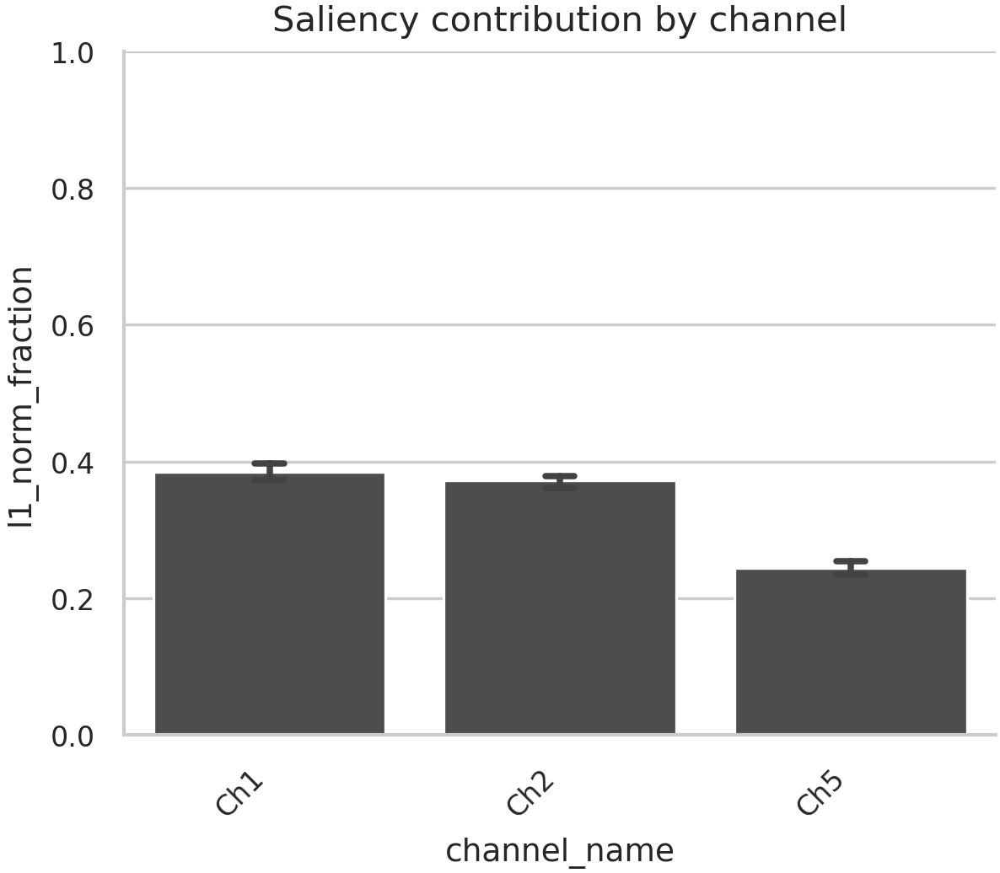

In [9]:
rows=[]
for i in range(1, N_FOLDS+1):
    path = BASE_RUN_DIR / f"fold_{i}/interpretability_{CLF}/channel_contributions{SUFFIX}.csv"
    if path.exists():
        df = pd.read_csv(path); df["fold"]=i; rows.append(df)
    else:
        print(f"⚠️ Falta channel_contributions en fold {i}")

if rows:
    df_chan = pd.concat(rows, ignore_index=True)
    fig, ax = plt.subplots(figsize=(4,3.5), constrained_layout=True)
    sns.barplot(data=df_chan, x="channel_name", y="l1_norm_fraction",
                color="0.3", errorbar=("ci",95), capsize=.1, ax=ax)
    ax.set_title("Saliency contribution by channel"); ax.set_ylim(0,1)
    plt.xticks(rotation=45, ha="right")
    savefig_nature(fig, FIG_DIR / "fig_SI_channel_contributions"); plt.show()
else:
    print("❌ No hay archivos de contribución por canal.")


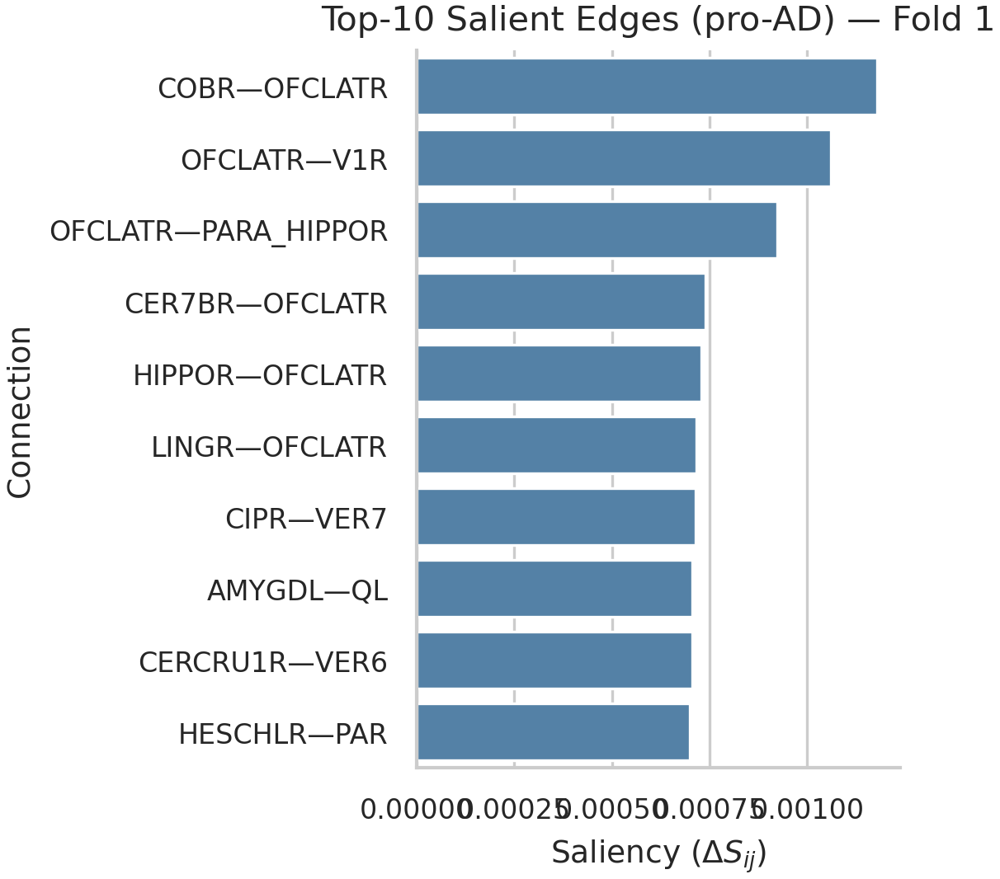

✅ Tabla LaTeX en: Tables_Nature/top10_edges_fold1.tex


In [10]:
FOLD_TO_SHOW = 1
edges_path = BASE_RUN_DIR / f"fold_{FOLD_TO_SHOW}/interpretability_{CLF}/ranking_conexiones_ANOTADO{SUFFIX}.csv"

df_fold = pd.read_csv(edges_path)
df_fold["connection_id"] = to_conn_tuple(df_fold)

df_top10 = df_fold[df_fold["Saliency_Score"] > 0].nsmallest(10, "Rank").copy()
df_top10["connection_str"] = df_top10["connection_id"].map(conn_tuple_to_str)

fig, ax = plt.subplots(figsize=(3.7, 3.6), constrained_layout=True)
sns.barplot(x="Saliency_Score", y="connection_str", data=df_top10, color="steelblue", ax=ax)
ax.set_xlabel(r"Saliency ($\Delta S_{ij}$)"); ax.set_ylabel("Connection")
ax.set_title("Top-10 Salient Edges (pro-AD) — Fold 1")
savefig_nature(fig, FIG_DIR / "fig_SI_top10_edges_fold1"); plt.show()

tex = TBL_DIR / "top10_edges_fold1.tex"
with open(tex, "w") as f:
    f.write("\\begin{tabular}{rl}\n\\toprule\nRank & Connection \\\\ \\midrule\n")
    for _, r in df_top10.iterrows():
        name = r["connection_str"].replace("_","\\_")
        f.write(f"{int(r['Rank'])} & \\texttt{{{name}}} \\\\\n")
    f.write("\\bottomrule\n\\end{tabular}\n")
print(f"✅ Tabla LaTeX en: {tex}")


In [11]:
from itertools import combinations
from scipy.stats import spearmanr

TOP_K_FOR_STAB = 50
by_fold = {}
for i in range(1, N_FOLDS+1):
    p = BASE_RUN_DIR / f"fold_{i}/interpretability_{CLF}/ranking_conexiones_ANOTADO{SUFFIX}.csv"
    d = pd.read_csv(p)
    d["connection_id"] = [tuple(sorted(x)) for x in zip(d["src_AAL3_Name"], d["dst_AAL3_Name"])]
    by_fold[i] = {
        "vec": d.set_index("connection_id")["Saliency_Score"],
        "top": set(d.nsmallest(TOP_K_FOR_STAB, "Rank")["connection_id"])
    }

dice=[]
for i,j in combinations(by_fold.keys(),2):
    inter = len(by_fold[i]["top"] & by_fold[j]["top"])
    dice.append( (2*inter)/(2*TOP_K_FOR_STAB) )
dice_mean, dice_sd = np.mean(dice), np.std(dice)

M = len(pd.concat([by_fold[k]["vec"] for k in by_fold]).index.unique())
dice_chance = TOP_K_FOR_STAB / M
print(f"Dice Top-{TOP_K_FOR_STAB}: {dice_mean:.3f} ± {dice_sd:.3f}  | chance≈{dice_chance:.4f}")

vecs = pd.concat([by_fold[k]["vec"].rename(f"f{k}") for k in by_fold], axis=1, join="inner")
cors = [spearmanr(vecs[a], vecs[b])[0] for a,b in combinations(vecs.columns,2)]
print(f"Spearman ρ: {np.mean(cors):.3f} ± {np.std(cors):.3f}  (intersección de {len(vecs)} aristas)")


Dice Top-50: 0.054 ± 0.022  | chance≈0.0059
Spearman ρ: 0.108 ± 0.057  (intersección de 8515 aristas)


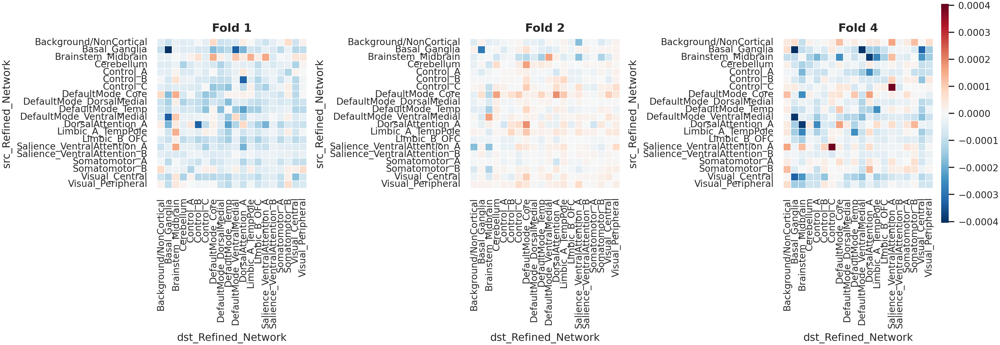

In [12]:
folds_to_plot = [1,2,4]
mats, order = {}, None
for f in folds_to_plot:
    epath = BASE_RUN_DIR / f"fold_{f}/interpretability_{CLF}/ranking_conexiones_ANOTADO{SUFFIX}.csv"
    e = pd.read_csv(epath)
    ns, nd = "src_Refined_Network", "dst_Refined_Network"
    m = e.groupby([ns,nd])["Saliency_Score"].mean().unstack(fill_value=0)
    m = (m + m.T)/2
    if order is None: order = sorted(m.columns)
    mats[f] = m.reindex(index=order, columns=order).fillna(0)

v = max(np.abs(m.values).max() for m in mats.values()) * 0.9
fig = plt.figure(figsize=(12,4.2), constrained_layout=True)
gs  = gridspec.GridSpec(1, len(folds_to_plot)+1, width_ratios=[1]*len(folds_to_plot)+[0.05], figure=fig)
cax = fig.add_subplot(gs[0, -1])
for k,f in enumerate(folds_to_plot):
    ax = fig.add_subplot(gs[0,k])
    sns.heatmap(mats[f], ax=ax, cmap="RdBu_r", center=0, vmin=-v, vmax=v, square=True,
                cbar=(k==len(folds_to_plot)-1), cbar_ax=cax, linewidths=.4, linecolor="white")
    ax.set_title(f"Fold {f}", weight="bold"); ax.tick_params(axis="x", rotation=90)
savefig_nature(fig, FIG_DIR / "fig_SI_heatmaps_networkpairs"); plt.show()


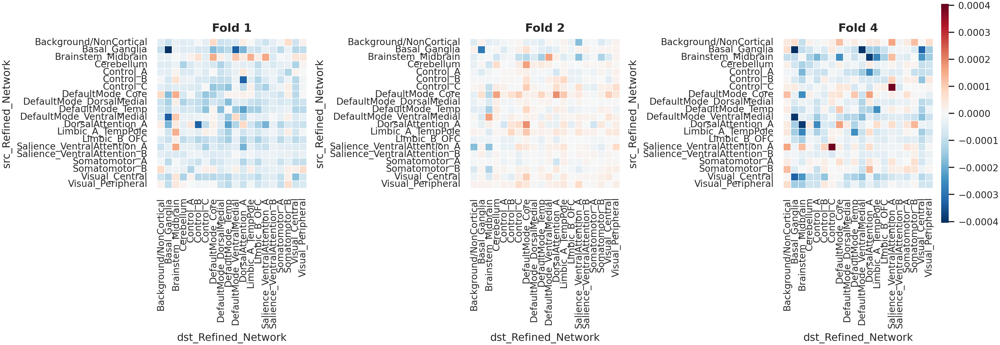

In [13]:
# ===================================================================
# CELDA 10: HEATMAPS DE PARES DE RED POR FOLD (ESCALA COMPARTIDA)
# ===================================================================
folds_to_plot = [1,2,4]  # ajusta si quieres otros
mats, order = {}, None
for f in folds_to_plot:
    epath = BASE_RUN_DIR / f"fold_{f}/interpretability_{CLF}/ranking_conexiones_ANOTADO{SUFFIX}.csv"
    e = pd.read_csv(epath)
    ns, nd = "src_Refined_Network", "dst_Refined_Network"
    m = e.groupby([ns,nd])["Saliency_Score"].mean().unstack(fill_value=0)
    m = (m + m.T)/2
    if order is None: order = sorted(m.columns)
    mats[f] = m.reindex(index=order, columns=order).fillna(0)

v = max(np.abs(m.values).max() for m in mats.values()) * 0.9
fig = plt.figure(figsize=(12,4.2), constrained_layout=True)
gs  = gridspec.GridSpec(1, len(folds_to_plot)+1, width_ratios=[1]*len(folds_to_plot)+[0.05], figure=fig)
cax = fig.add_subplot(gs[0, -1])

for k,f in enumerate(folds_to_plot):
    ax = fig.add_subplot(gs[0,k])
    sns.heatmap(mats[f], ax=ax, cmap="RdBu_r", center=0, vmin=-v, vmax=v, square=True,
                cbar=(k==len(folds_to_plot)-1), cbar_ax=cax, linewidths=.4, linecolor="white")
    ax.set_title(f"Fold {f}", weight="bold"); ax.tick_params(axis="x", rotation=90)

savefig_nature(fig, FIG_DIR / "fig_SI_heatmaps_networkpairs")
plt.show()


In [14]:
from statsmodels.stats.proportion import proportion_confint
from scipy.stats import binomtest, norm

def lateralidad_stats(df, K):
    intra = df[(df['hemi_src']==df['hemi_dst']) & (df['Rank']<=K)]
    out=[]
    for f,g in intra.groupby('fold'):
        rr = ((g['hemi_src']=='R') & (g['hemi_dst']=='R')).sum()
        ll = ((g['hemi_src']=='L') & (g['hemi_dst']=='L')).sum()
        n = rr+ll
        p = rr/max(n,1)
        ci_low, ci_high = proportion_confint(rr, n, method="wilson") if n>0 else (np.nan,np.nan)
        pval = binomtest(rr, n, p=0.5, alternative='greater').pvalue if n>0 else np.nan
        out.append({"fold":f,"K":K,"rr":rr,"ll":ll,"n":n,"p_RR":p,"ci_low":ci_low,"ci_high":ci_high,"pval":pval})
    dfk = pd.DataFrame(out)
    z = np.nanmean(norm.isf(dfk["pval"].clip(lower=1e-300)))
    p_meta = norm.sf(z)
    return dfk, p_meta

for K in (50,100,200):
    statsK, pmeta = lateralidad_stats(df_lat_clean, K)
    print(f"K={K}: p_meta(one-sided R>0.5) = {pmeta:.3e}")


K=50: p_meta(one-sided R>0.5) = 1.102e-03
K=100: p_meta(one-sided R>0.5) = 5.952e-05
K=200: p_meta(one-sided R>0.5) = 2.888e-09


In [15]:
from itertools import combinations
from scipy.stats import spearmanr
import numpy as np, pandas as pd

TOP_K_FOR_STAB = 50

# Vector de saliencias por fold, alineado por intersección (sin fillna=0)
by_fold = {}
for i in range(1, N_FOLDS+1):
    p = BASE_RUN_DIR / f"fold_{i}/interpretability_{CLF}/ranking_conexiones_ANOTADO{SUFFIX}.csv"
    d = pd.read_csv(p)
    d["connection_id"] = [tuple(sorted(x)) for x in zip(d["src_AAL3_Name"], d["dst_AAL3_Name"])]
    by_fold[i] = {
        "vec": d.set_index("connection_id")["Saliency_Score"],
        "top": set(d.nsmallest(TOP_K_FOR_STAB, "Rank")["connection_id"])
    }

# Dice observado y baseline aleatorio
dice=[]
for i,j in combinations(by_fold,2):
    inter = len(by_fold[i]["top"] & by_fold[j]["top"])
    dice.append( (2*inter)/(2*TOP_K_FOR_STAB) )
dice_mean, dice_sd = np.mean(dice), np.std(dice)

M = len(pd.concat([by_fold[k]["vec"] for k in by_fold]).index.unique())  # universo de aristas
dice_chance = TOP_K_FOR_STAB / M
print(f"Dice Top-{TOP_K_FOR_STAB}: {dice_mean:.3f} ± {dice_sd:.3f}  | chance≈{dice_chance:.4f}")
# Spearman sobre intersección (sin imputar ceros)
vecs = pd.concat([by_fold[k]["vec"].rename(f"f{k}") for k in by_fold], axis=1, join="inner")
cors = [spearmanr(vecs[a], vecs[b])[0] for a,b in combinations(vecs.columns,2)]
print(f"Spearman ρ: {np.mean(cors):.3f} ± {np.std(cors):.3f}  (intersección de {len(vecs)} aristas)")


Dice Top-50: 0.054 ± 0.022  | chance≈0.0059
Spearman ρ: 0.108 ± 0.057  (intersección de 8515 aristas)


In [16]:
from statsmodels.stats.proportion import proportion_confint
from scipy.stats import binomtest, norm

def lateralidad_stats(df, K):
    # usa df_lat_clean ya construido con hemi_of robusto
    intra = df[(df['hemi_src']==df['hemi_dst']) & (df['Rank']<=K)]
    out=[]
    for f,g in intra.groupby('fold'):
        rr = ((g['hemi_src']=='R') & (g['hemi_dst']=='R')).sum()
        ll = ((g['hemi_src']=='L') & (g['hemi_dst']=='L')).sum()
        n = rr+ll
        p = rr/max(n,1)
        ci_low, ci_high = proportion_confint(rr, n, method="wilson") if n>0 else (np.nan,np.nan)
        pval = binomtest(rr, n, p=0.5, alternative='greater').pvalue if n>0 else np.nan
        out.append({"fold":f,"K":K,"rr":rr,"ll":ll,"n":n,"p_RR":p,"ci_low":ci_low,"ci_high":ci_high,"pval":pval})
    dfk = pd.DataFrame(out)
    # meta Z de Stouffer (p one-sided)
    z = np.nanmean(norm.isf(dfk["pval"].clip(lower=1e-300)))
    p_meta = norm.sf(z)
    return dfk, p_meta

for K in (50,100,200):
    statsK, pmeta = lateralidad_stats(df_lat_clean, K)
    print(f"K={K}: p_meta(one-sided R>0.5) = {pmeta:.3e}")


K=50: p_meta(one-sided R>0.5) = 1.102e-03
K=100: p_meta(one-sided R>0.5) = 5.952e-05
K=200: p_meta(one-sided R>0.5) = 2.888e-09


In [17]:
# RUTAS ÚNICAS y consistentes
GLOBAL_TENSOR_PATH = '/home/diego/Escritorio/limpio/AAL3_dynamicROIs_fmri_tensor_NeuroEnhanced_v6.5.17_AAL3_131ROIs_OMST_GCE_Signed_GrangerLag1_ChNorm_ROIreorderedYeo17_ParallelTuned/GLOBAL_TENSOR_from_AAL3_dynamicROIs_fmri_tensor_NeuroEnhanced_v6.5.17_AAL3_131ROIs_OMST_GCE_Signed_GrangerLag1_ChNorm_ROIreorderedYeo17_ParallelTuned.npz'
METADATA_PATH      = '/home/diego/Escritorio/limpio/SubjectsData_AAL3_procesado2.csv'

# --- Función para calcular d de Cohen ---
def cohen_d(x, y):
    nx, ny = len(x), len(y)
    if nx < 2 or ny < 2: return 0.0
    dof = nx + ny - 2
    pooled_std = np.sqrt(((nx - 1) * np.var(x, ddof=1) + (ny - 1) * np.var(y, ddof=1)) / dof)
    return (np.mean(x) - np.mean(y)) / pooled_std if pooled_std > 1e-6 else 0.0
# ... (cohen_d como ya tienes) ...

npz = np.load(GLOBAL_TENSOR_PATH)
tensor_all = npz["global_tensor_data"][:, CHANNELS_TO_USE, :, :]
subj_ids = pd.Series(npz["subject_ids"].astype(str), name="SubjectID")
meta = pd.read_csv(METADATA_PATH, usecols=["SubjectID","ResearchGroup_Mapped"])
meta["SubjectID"] = meta["SubjectID"].astype(str).str.strip()
merged_df = pd.DataFrame({"SubjectID": subj_ids, "tensor_idx": np.arange(len(subj_ids))}).merge(meta, on="SubjectID", how="left")

# Saliencia media por conexión
df_mean_sal = df_full.groupby("connection_id")["Saliency_Score"].mean()

rows=[]
for conn in df_mean_sal.index:
    i,j = df_full.loc[df_full["connection_id"]==conn, ["idx_i","idx_j"]].iloc[0].astype(int)
    vals = pd.Series(tensor_all[:,:,i,j].mean(axis=1), index=subj_ids)
    aux = vals.to_frame("conn").merge(merged_df, on="SubjectID", how="left")
    d = cohen_d(aux[aux["ResearchGroup_Mapped"]=="AD"]["conn"].values,
                aux[aux["ResearchGroup_Mapped"]=="CN"]["conn"].values)
    rows.append((conn, d))
df_cohen = pd.DataFrame(rows, columns=["connection_id","cohen_d"]).set_index("connection_id")
df_quad = pd.concat([df_mean_sal.rename("sal"), df_cohen], axis=1).dropna()

# Solo consenso
df_qc = df_quad.loc[df_quad.index.intersection(consensus_set.index)].copy()
# (plot idéntico al tuyo)


# Análisis de la Firma de Biomarcadores de Alzheimer

Este notebook analiza los resultados de interpretabilidad de nuestro modelo para identificar una firma de conectividad robusta y estable para la Enfermedad de Alzheimer. El análisis se estructura en dos partes:

1.  **Identificación de la Firma Estable:** Agregamos los resultados de los 5 folds de validación cruzada para definir un "Consensus Set" de biomarcadores que son consistentemente importantes para el modelo.
2.  **Caracterización y Validación de la Firma:** Profundizamos en las propiedades de esta firma estable, analizando su lateralización hemisférica, la contribución de diferentes métricas de conectividad, y, crucialmente, si la importancia de una conexión se debe a hipo o hiper-conectividad.

# Análisis de Interpretabilidad de Biomarcadores de Conectividad para Alzheimer

## Metodología de Interpretabilidad: Un Viaje de Ida y Vuelta

Nuestro enfoque sigue una secuencia lógica de tres etapas para pasar del espacio de datos de alta dimensionalidad (conectomas) a una decisión de clasificación, y luego de vuelta al espacio de datos para la interpretación neurobiológica.

### Etapa 1: Codificación No-Lineal a un Espacio Latente (VAE)
El punto de partida es un conjunto de conectomas funcionales, $X \in \mathbb{R}^{C \times R \times R}$, donde $C$ es el número de canales (métricas de conectividad) y $R$ es el número de Regiones de Interés (ROIs). La alta dimensionalidad de este espacio es un desafío para la clasificación directa.

Utilizamos un **Autoencoder Variacional Convolucional (VAE)**, un modelo generativo no supervisado, para aprender una representación comprimida y significativa de cada conectoma. El **encoder** del VAE, $E_\phi(X)$, mapea cada conectoma $X$ a una distribución en un espacio latente de baja dimensionalidad, parametrizada por una media $\mu \in \mathbb{R}^{D_L}$ y una varianza $\log(\sigma^2) \in \mathbb{R}^{D_L}$, donde $D_L \ll C \times R \times R$.

$$ E_\phi(X) \rightarrow (\mu, \log \sigma^2) $$

Para la clasificación, utilizamos el vector de medias $\mu$ como un "resumen" o *embedding* neurofuncional del conectoma. Este vector captura las características más salientes y variadas de la conectividad del sujeto en $D_L$ dimensiones.

### Etapa 2: Clasificación y Atribución de Importancia en el Espacio Latente (Clasificador + SHAP)
El vector latente $\mu$, junto con metadatos demográficos (edad, sexo), se utiliza como entrada para un clasificador robusto (en este caso, un Gradient Boosting, $g_\theta$).

$$ \hat{y} = g_\theta([\mu, \text{metadatos}]) $$

Una vez que el clasificador $g_\theta$ está entrenado, empleamos **SHAP (SHapley Additive exPlanations)** para cuantificar la importancia de cada una de las $D_L$ dimensiones latentes en la decisión del modelo. SHAP asigna a cada característica latente $\mu_k$ un valor $\phi_k$ que representa su contribución marginal a la predicción para un sujeto dado.

### Etapa 3: Retroproyección al Espacio de Conexiones (Integrated Gradients)
Aquí reside el núcleo de la interpretabilidad. Queremos saber: ¿qué conexiones específicas en el conectoma original $X$ son responsables de la formación de las características latentes que SHAP nos dijo que eran importantes?

Para ello, construimos una **función de saliencia escalar** $f(X)$ que representa la "energía discriminativa" de un conectoma. Esta se define como el producto punto entre el vector de medias latentes $\mu(X)$ y un vector de pesos $\mathbf{w}$:

$$ f(X) = \mathbf{w}^\top \mu(X) $$

El vector de pesos $\mathbf{w}$ se deriva directamente de los valores SHAP, específicamente, de la diferencia del valor SHAP promedio para cada dimensión latente entre los grupos AD y CN: $\mathbf{w} = \mathbb{E}[\phi_{AD}] - \mathbb{E}[\phi_{CN}]$.

Con esta función, utilizamos **Integrated Gradients (IG)** para atribuir la saliencia de $f(X)$ a cada conexión individual $X_{ij}$ en el conectoma de entrada. IG calcula la integral de los gradientes de $f(X)$ a lo largo de una trayectoria rectilínea desde una *baseline* (línea de base) informativa $\tilde{X}$ (en nuestro caso, CN-mediana) hasta el conectoma de entrada $X$.

$$ \text{IG}_{ij}(X) = (X_{ij} - \tilde{X}_{ij}) \int_{\alpha=0}^{1} \frac{\partial f(\tilde{X} + \alpha(X - \tilde{X}))}{\partial X_{ij}} d\alpha $$

La métrica final que analizamos es la **saliencia diferencial**, $\Delta S_{ij}$, calculada como la diferencia en la magnitud de IG promedio entre los grupos:

$$ \Delta S_{ij} = \mathbb{E}_{x \sim AD}[|\text{IG}_{ij}(X)|] - \mathbb{E}_{x \sim CN}[|\text{IG}_{ij}(X)|] $$

Un $\Delta S_{ij} > 0$ indica una conexión más importante para la clasificación de AD, mientras que $\Delta S_{ij} < 0$ indica mayor importancia para la clasificación de CN.


### Integrated Gradients hacia el espacio de conexiones

Queremos atribuir $F(x)=\tilde{w}^{\top}\mu(x)$ a cada entrada $x_{c,ij}$ (canal $c$, conexión $i\text{–}j$).
Con baseline $\bar{x}$ (aquí, CN-mediana) y trayectoria recta $x(\alpha)=\bar{x}+\alpha(x-\bar{x})$,
las **Integrated Gradients** son

$$
\mathrm{IG}_{c,ij}(x) \;=\; (x_{c,ij}-\bar{x}_{c,ij}) \,\int_{0}^{1}\! 
\frac{\partial F(x(\alpha))}{\partial x_{c,ij}} \, d\alpha .
$$

Promediamos $|\mathrm{IG}|$ por sujetos de cada grupo para obtener $S_{c,ij}^{AD}$ y $S_{c,ij}^{CN}$.
La **saliencia diferencial** que reportamos por conexión es
$$
\Delta S_{ij} \;=\; \sum_{c} \Big( \mathbb{E}_{AD}|\mathrm{IG}_{c,ij}| \;-\; \mathbb{E}_{CN}|\mathrm{IG}_{c,ij}| \Big).
$$
Rojo ($+$) indica mayor saliencia para AD; azul ($-$) para CN.



# Análisis de Interpretabilidad y Estabilidad para el Paper
Este notebook realiza un análisis exhaustivo de los resultados de interpretabilidad generados por el pipeline `interpretar_fold_paper.py`. Los objetivos son:
1.  **Identificar** los biomarcadores de conectividad (aristas y redes) más salientes.
2.  **Evaluar la estabilidad** de estos biomarcadores a través de los 5 folds de validación cruzada.
3.  **Generar** las figuras y tablas finales para el manuscrito.

## Parte 1: La Firma de Saliencia del Alzheimer

Comenzamos nuestro análisis desde la perspectiva más amplia, identificando los sistemas y nodos cerebrales clave, para luego descender al nivel de las conexiones individuales.

### 1.1. Epicentros de la Discriminación: Análisis de Redes y Hubs

Primero, identificamos los **hubs de saliencia**: ROIs que son los puntos de origen o destino de las conexiones más discriminativas. Para asegurar que estos hubs no son un artefacto de su alta conectividad, calculamos una **fuerza de saliencia robusta** (residuales de una regresión sobre el grado del nodo).

A continuación, agregamos la saliencia a nivel de **pares de redes funcionales**. Esto nos permite visualizar qué sistemas cerebrales muestran una interacción anómala en AD.

### Agregación por pares de redes y enriquecimiento

Construimos matrices $M^{(\text{abs})}$ y $M^{(\text{sgn})}$ donde
$$
M^{(\text{abs})}_{A,B}=\sum_{(i\in A,\,j\in B)} |\Delta S_{ij}|, \qquad
M^{(\text{sgn})}_{A,B}=\sum_{(i\in A,\,j\in B)} \Delta S_{ij}.
$$
Para **enriquecimiento** en Top-K, comparamos el conteo observado $k$ de un par $(A,B)$ frente a su disponibilidad
en la población de aristas $E$ usando hipergeométrica ($p=\Pr[X\ge k]$), y controlamos FDR por Benjamini–Hochberg.


## 2. Análisis de Estabilidad de Biomarcadores
Un biomarcador solo es útil si es robusto. Aquí, evaluamos la estabilidad de las aristas más salientes a través de los 5 folds usando dos métricas:
- **Frecuencia de Réplica ($\pi$):** ¿Qué tan a menudo aparece una arista en el Top-K?
- **Consistencia de Signo ($\tau$):** ¿El efecto de una arista es consistentemente pro-AD (positivo) o pro-CN (negativo)?

A partir de esto, definimos un **"Consensus Set"** de aristas de alta confianza.

In [18]:
# ===================================================================
# CELDA 4: ANÁLISIS DE ESTABILIDAD Y DEFINICIÓN DEL CONSENSUS SET
# ===================================================================
from collections import Counter

TOP_K_STABILITY = 200 # Umbral para "importante" en un fold
N_FOLDS_FOUND = df_full['fold'].nunique()

# --- Calcular Frecuencia de Réplica (π) ---
top_k_sets = df_full[df_full['Rank'] <= TOP_K_STABILITY].groupby('fold')['connection_id'].apply(set)
pi_values = pd.Series(
    Counter(edge for fold_set in top_k_sets for edge in fold_set)
).div(N_FOLDS_FOUND)
pi_values.name = 'pi'

# --- Calcular Consistencia de Signo (τ) ---
sign_scores = np.sign(df_full.set_index(['connection_id', 'fold'])['Saliency_Score']).unstack()
tau_values = sign_scores.mean(axis=1).abs()
tau_values.name = 'tau'

# --- Crear DataFrame de Estabilidad y Consensus Set ---
df_stability = pd.DataFrame({'pi': pi_values, 'tau': tau_values}).fillna({'pi': 0})
df_stability['score'] = df_stability['pi'] * df_stability['tau']

# --- Definir el Consensus Set (Criterios Estrictos para el Paper) ---
consensus_set = df_stability[(df_stability['pi'] >= 0.6) & (df_stability['tau'] >= 0.6)].copy()
consensus_set = consensus_set.sort_values('score', ascending=False)

print(f"Se encontraron {len(consensus_set)} conexiones en el 'Consensus Set' (π>=0.6, τ>=0.6)")
print("Top 10 Conexiones más estables:")
display(consensus_set.head(10))

Se encontraron 17 conexiones en el 'Consensus Set' (π>=0.6, τ>=0.6)
Top 10 Conexiones más estables:


pi  tau  score
CER9R  CIPL     1.0  0.6   0.60
O1L    O1R      0.8  0.6   0.48
CER10R OFCANTR  0.6  0.6   0.36
PQR    VER6     0.6  0.6   0.36
PALLR  VER7     0.6  0.6   0.36
       V1R      0.6  0.6   0.36
PALLL  T2L      0.6  0.6   0.36
O3L    O3R      0.6  0.6   0.36
O2R    VER6     0.6  0.6   0.36
LPCR   NCL      0.6  0.6   0.36

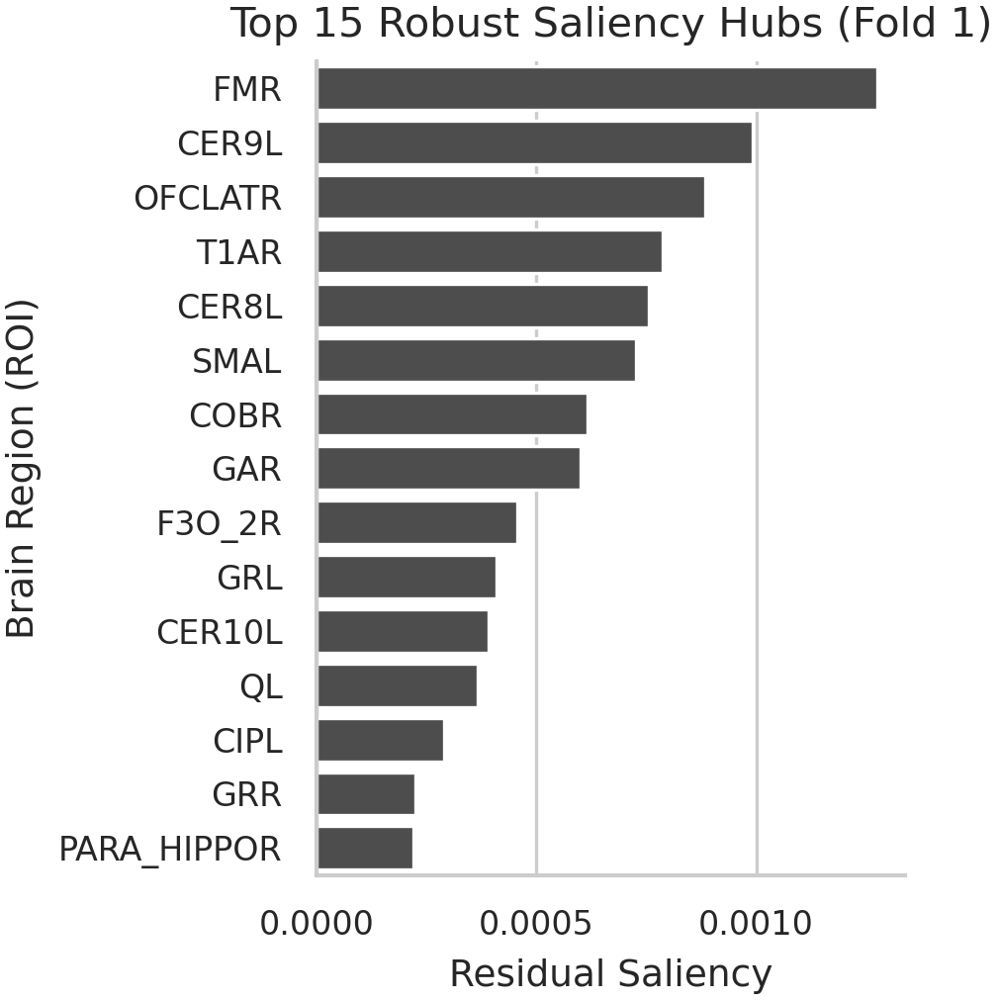

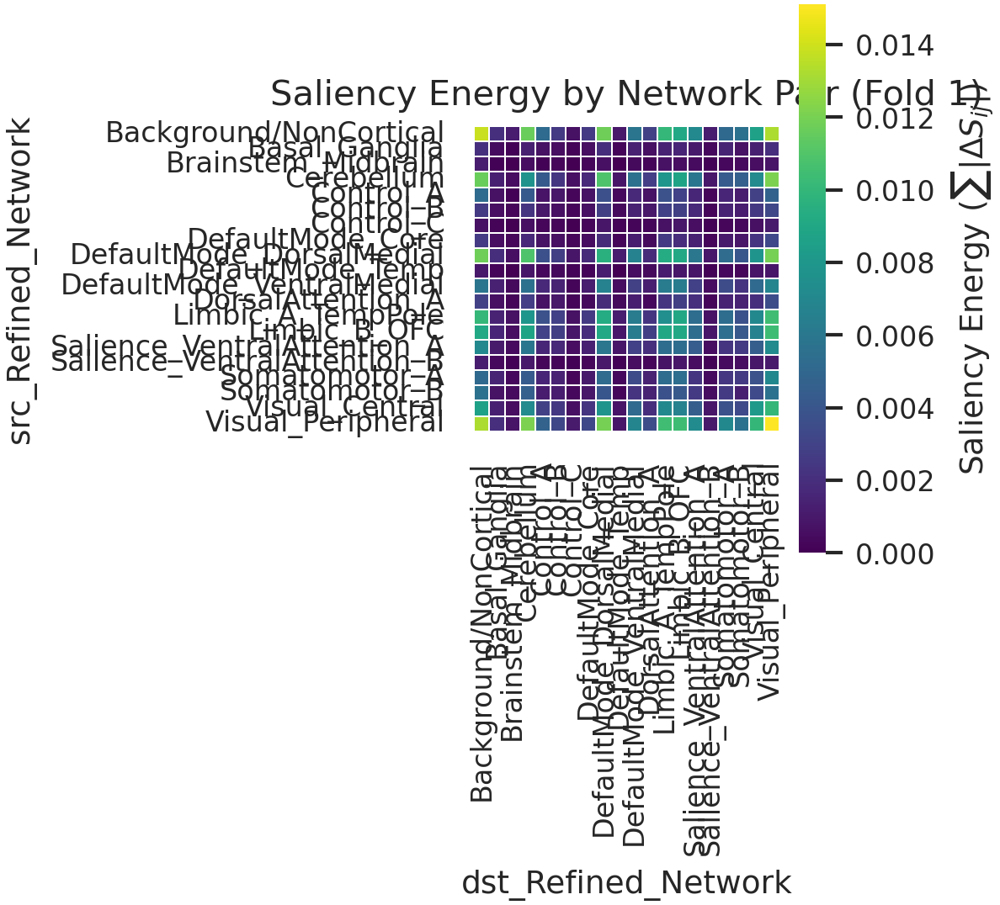

In [19]:
# ===================================================================
# CELDA PARA SI: ANÁLISIS DE HUBS Y REDES (FOLD REPRESENTATIVO)
# ===================================================================

BASE_RUN_DIR = Path('./resultados_13_paper')
FIG_DIR = Path('./Figures_Nature'); FIG_DIR.mkdir(exist_ok=True)
CLF = 'mlp'
SUFFIX = '_integrated_gradients_top50'

# --- Cargamos el archivo correcto para el análisis de hubs ---
FOLD_ID = 1 # Usamos el Fold 1 como representativo
hubs_path = BASE_RUN_DIR / f'fold_{FOLD_ID}/interpretability_{CLF}/node_robust_hubs_top200{SUFFIX}.csv'

if not hubs_path.exists():
    raise FileNotFoundError(f"No se encontró el archivo de hubs para el fold {FOLD_ID}: {hubs_path}")

df_hubs_fold1 = pd.read_csv(hubs_path)

# --- Top-15 hubs robustos ---
df_hubs_plot = df_hubs_fold1.sort_values('residual_strength', ascending=False).head(15)

fig_hubs, ax_hubs = plt.subplots(figsize=(3.3, 3.6))
sns.barplot(data=df_hubs_plot, x='residual_strength', y='node', color="0.3", ax=ax_hubs)
ax_hubs.set_title(f'Top 15 Robust Saliency Hubs (Fold {FOLD_ID})')
ax_hubs.set_xlabel('Residual Saliency')
ax_hubs.set_ylabel('Brain Region (ROI)')
fig_hubs.tight_layout()
savefig_nature(fig_hubs, FIG_DIR / f'fig_SI_hubs_top15_fold{FOLD_ID}')
plt.show()


# --- Heatmap de energía de saliencia por red (|ΔS|) ---
df_edges_fold1 = df_full[df_full['fold'] == FOLD_ID]
df_net_abs = df_edges_fold1.groupby(
    ['src_Refined_Network', 'dst_Refined_Network']
)['Saliency_Score'].apply(lambda s: s.abs().sum()).unstack(fill_value=0)
df_net_abs = (df_net_abs + df_net_abs.T) / 2 # Simetrizar

fig_net, ax_net = plt.subplots(figsize=(4.0, 4.0))
sns.heatmap(df_net_abs, cmap='viridis', cbar_kws={'label': r'Saliency Energy ($\sum|\Delta S_{ij}|)$'},
            square=True, linewidths=.4, linecolor='white', ax=ax_net)
ax_net.set_title(f'Saliency Energy by Network Pair (Fold {FOLD_ID})')
ax_net.tick_params(axis='x', rotation=90)
fig_net.tight_layout()
savefig_nature(fig_net, FIG_DIR / f'fig_SI_network_energy_fold{FOLD_ID}')
plt.show()

## Parte 2: Validación y Profundización Estadística

Habiendo identificado la firma de saliencia, ahora la sometemos a un escrutinio estadístico riguroso para validar su robustez y comprender su naturaleza.

### 2.1. ¿Son Significativos los Patrones de Red? Test de Enriquecimiento

Realizamos un **test de enriquecimiento hipergeométrico** para determinar si los pares de redes con alta saliencia están sobrerrepresentados en las conexiones más importantes (Top-K) de lo que se esperaría por azar. Corregimos los p-valores con el método de Benjamini-Hochberg (FDR) para controlar la tasa de falsos descubrimientos.

In [20]:
import pandas as pd
import numpy as np
from scipy.stats import hypergeom
import pathlib
from statsmodels.stats.multitest import multipletests # Importación recomendada

# --- Definición de la ruta (ya la tenías) ---
RUN_DIR = pathlib.Path('/home/diego/Escritorio/limpio/resultados_13_paper/fold_1/interpretability_mlp')
edges = pd.read_csv(RUN_DIR / 'ranking_conexiones_ANOTADO_integrated_gradients_top50.csv')

# --- Preparación del DataFrame ---
net_src = 'src_Refined_Network' if 'src_Refined_Network' in edges.columns else 'src_Yeo17_Network'
net_dst = 'dst_Refined_Network' if 'dst_Refined_Network' in edges.columns else 'dst_Yeo17_Network'

def pair_label(a,b):
    return '—'.join(sorted([str(a),str(b)]))

edges_pairs = edges.assign(pair=[pair_label(a,b) for a,b in zip(edges[net_src], edges[net_dst])])

# --- Función de Enriquecimiento (con corrección BH mejorada) ---
def enrichment_topK(edges_df, K):
    E = len(edges_df)
    top = edges_df.nsmallest(K, 'Rank')
    pop_counts = edges_df['pair'].value_counts()
    k_obs = top['pair'].value_counts()
    
    out = []
    for p, k in k_obs.items():
        M = pop_counts.get(p, 0)
        N = K
        pval = hypergeom.sf(k-1, E, M, N)
        out.append((p, k, M, N, pval))
        
    df = pd.DataFrame(out, columns=['pair','k_top','M_pop','N_top','pval']).sort_values('pval')
    
    # Corrección FDR con statsmodels (más robusto y estándar)
    df['qval_BH'] = multipletests(df['pval'], method='fdr_bh')[1]
    
    return df

# --- Bucle de ejecución ---
for K in (50, 100, 200):
    dfk = enrichment_topK(edges_pairs, K)
    
    # LÍNEA CORREGIDA: Usar RUN_DIR en lugar de INTERP_DIR
    outp = RUN_DIR / f'enrichment_network_pairs_top{K}.csv'
    
    dfk.to_csv(outp, index=False)
    print(f"[Enrichment] top-{K} -> {outp}")
    display(dfk.head(10))


[Enrichment] top-50 -> /home/diego/Escritorio/limpio/resultados_13_paper/fold_1/interpretability_mlp/enrichment_network_pairs_top50.csv


,pair,k_top,M_pop,N_top,pval,qval_BH
0,DefaultMode_VentralMedial—Visual_Central,3,54,50,0.003829,0.149319
1,Visual_Peripheral—Visual_Peripheral,3,78,50,0.010643,0.207532
5,Visual_Central—Visual_Central,2,36,50,0.018747,0.243714
6,DefaultMode_VentralMedial—Limbic_A_TempPole,2,60,50,0.048197,0.330005
2,Cerebellum—DefaultMode_DorsalMedial,3,143,50,0.051276,0.330005
7,Cerebellum—DefaultMode_VentralMedial,2,66,50,0.057135,0.330005
33,Control_B—DorsalAttention_A,1,12,50,0.068275,0.330005
30,Basal_Ganglia—DefaultMode_VentralMedial,1,12,50,0.068275,0.330005
23,Basal_Ganglia—Somatomotor_A,1,14,50,0.079201,0.330005
16,DorsalAttention_A—Somatomotor_B,1,15,50,0.084617,0.330005


[Enrichment] top-100 -> /home/diego/Escritorio/limpio/resultados_13_paper/fold_1/interpretability_mlp/enrichment_network_pairs_top100.csv


,pair,k_top,M_pop,N_top,pval,qval_BH
0,Visual_Peripheral—Visual_Peripheral,6,78,100,0.000293,0.016984
1,DefaultMode_VentralMedial—Visual_Central,4,54,100,0.003613,0.104769
2,DefaultMode_DorsalMedial—DefaultMode_VentralMe...,4,78,100,0.013164,0.254501
8,DefaultMode_VentralMedial—Limbic_A_TempPole,3,60,100,0.033211,0.350850
25,Basal_Ganglia—Visual_Peripheral,2,26,100,0.036960,0.350850
6,Cerebellum—DefaultMode_VentralMedial,3,66,100,0.042249,0.350850
26,Salience_VentralAttention_A—Salience_VentralAt...,2,28,100,0.042344,0.350850
10,Somatomotor_A—Somatomotor_B,2,35,100,0.063243,0.428328
22,Visual_Central—Visual_Central,2,36,100,0.066465,0.428328
4,Cerebellum—Visual_Central,3,99,100,0.110412,0.560186


[Enrichment] top-200 -> /home/diego/Escritorio/limpio/resultados_13_paper/fold_1/interpretability_mlp/enrichment_network_pairs_top200.csv


,pair,k_top,M_pop,N_top,pval,qval_BH
0,Visual_Peripheral—Visual_Peripheral,9,78,200,0.000082,0.006938
4,DefaultMode_VentralMedial—Limbic_A_TempPole,6,60,200,0.002716,0.093273
28,Basal_Ganglia—Somatomotor_A,3,14,200,0.003838,0.093273
5,Cerebellum—DefaultMode_VentralMedial,6,66,200,0.004389,0.093273
8,DefaultMode_VentralMedial—Visual_Central,5,54,200,0.008463,0.117366
12,Somatomotor_A—Somatomotor_B,4,35,200,0.008749,0.117366
14,Visual_Central—Visual_Central,4,36,200,0.009665,0.117366
26,Salience_VentralAttention_A—Salience_VentralAt...,3,28,200,0.027162,0.288596
42,Basal_Ganglia—DefaultMode_VentralMedial,2,12,200,0.031033,0.293091
36,DefaultMode_VentralMedial—DefaultMode_VentralM...,2,15,200,0.047157,0.396022


### 2.2. Saliencia del Modelo vs. Efecto de Grupo en la Conectividad

Una pregunta crítica es si la saliencia del modelo simplemente refleja grandes diferencias en la conectividad media entre grupos o si captura patrones más sutiles. Para ello, calculamos el **d de Cohen** para cada conexión (una medida del tamaño del efecto de la diferencia de medias) y lo correlacionamos (Spearman ρ) con la magnitud de la saliencia. Un `jointplot` nos permite visualizar esta relación y las distribuciones de ambas métricas.

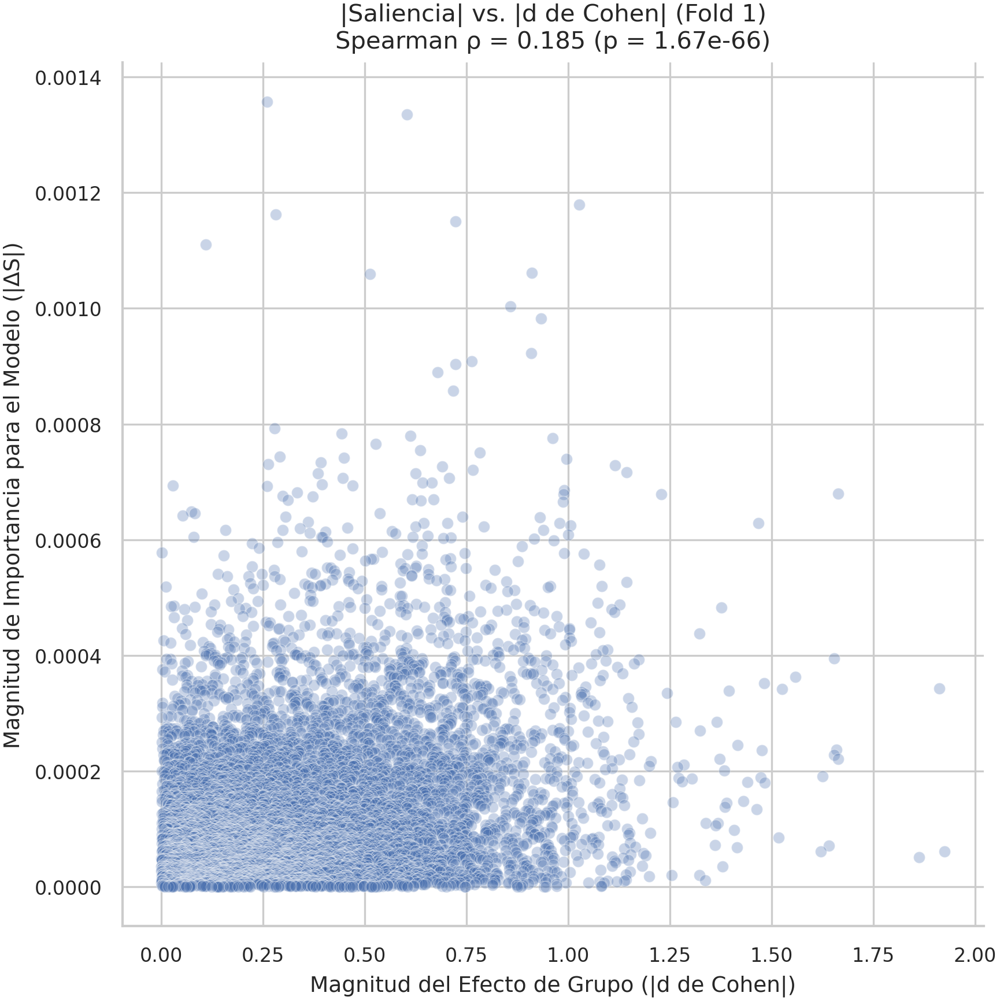

In [21]:
# ===================================================================
# CELDA CORREGIDA: Saliencia vs. Efecto de Grupo (d de Cohen)
# ===================================================================
from scipy.stats import spearmanr # <-- AÑADIDO: Importar la función de correlación

# --- Rutas (MODIFICAR SEGÚN SEA NECESARIO) ---
GLOBAL_TENSOR_PATH = '/home/diego/Escritorio/limpio/AAL3_dynamicROIs_fmri_tensor_NeuroEnhanced_v6.5.17_AAL3_131ROIs_OMST_GCE_Signed_GrangerLag1_ChNorm_ROIreorderedYeo17_ParallelTuned/GLOBAL_TENSOR_from_AAL3_dynamicROIs_fmri_tensor_NeuroEnhanced_v6.5.17_AAL3_131ROIs_OMST_GCE_Signed_GrangerLag1_ChNorm_ROIreorderedYeo17_ParallelTuned.npz'
METADATA_PATH = '/home/diego/Escritorio/limpio/SubjectsData_AAL3_procesado2.csv'
RUN_DIR = './resultados_13_paper'
FOLD = 1
CLF = 'mlp'
SUFFIX = '_integrated_gradients_top50'
CHANNELS_TO_USE = [1, 2, 5]

# --- Función para calcular d de Cohen ---
def cohen_d(x, y):
    nx, ny = len(x), len(y)
    if nx < 2 or ny < 2: return 0.0
    dof = nx + ny - 2
    pooled_std = np.sqrt(((nx - 1) * np.var(x, ddof=1) + (ny - 1) * np.var(y, ddof=1)) / dof)
    return (np.mean(x) - np.mean(y)) / pooled_std if pooled_std > 1e-6 else 0.0

# --- Cargar datos necesarios ---
try:
    # --- AÑADIDO: Cargar el DataFrame de ranking de conexiones ---
    edges_path = Path(RUN_DIR) / f'fold_{FOLD}/interpretability_{CLF}/ranking_conexiones_ANOTADO{SUFFIX}.csv'
    if not edges_path.exists():
        raise FileNotFoundError(f"No se encontró el archivo de ranking: {edges_path}")
    df_edges = pd.read_csv(edges_path)
    # -----------------------------------------------------------

    # 1. Cargar tensores y metadatos
    npz_data = np.load(GLOBAL_TENSOR_PATH)
    tensor_all = npz_data['global_tensor_data']
    subj_all_ids = npz_data['subject_ids'].astype(str)
    
    meta_df = pd.read_csv(METADATA_PATH)
    meta_df['SubjectID'] = meta_df['SubjectID'].astype(str).str.strip()

    # 2. Identificar sujetos de test para este fold
    fold_dir = f"{RUN_DIR}/fold_{FOLD}"
    test_indices_in_cnad_df = np.load(f"{fold_dir}/test_indices.npy")
    
    tensor_df = pd.DataFrame({'SubjectID': subj_all_ids, 'tensor_idx': np.arange(len(subj_all_ids))})
    merged = tensor_df.merge(meta_df, on='SubjectID', how='left')
    cnad_df = merged[merged['ResearchGroup_Mapped'].isin(['CN', 'AD'])].reset_index(drop=True)
    
    test_df = cnad_df.iloc[test_indices_in_cnad_df]
    
    # 3. Separar tensores de test para AD y CN
    gidx_test_ad = test_df[test_df['ResearchGroup_Mapped'] == 'AD']['tensor_idx'].values
    gidx_test_cn = test_df[test_df['ResearchGroup_Mapped'] == 'CN']['tensor_idx'].values

    # Promediar sobre los canales
    tensor_test_ad = tensor_all[gidx_test_ad][:, CHANNELS_TO_USE, :, :].mean(axis=1)
    tensor_test_cn = tensor_all[gidx_test_cn][:, CHANNELS_TO_USE, :, :].mean(axis=1)
    
    # 4. Calcular d de Cohen para cada conexión
    cohen_ds = []
    for _, row in df_edges.iterrows():
        i, j = int(row['idx_i']), int(row['idx_j'])
        conn_ad = tensor_test_ad[:, i, j]
        conn_cn = tensor_test_cn[:, i, j]
        d = cohen_d(conn_ad, conn_cn)
        cohen_ds.append(d)
        
    df_edges['cohen_d'] = cohen_ds
    df_edges['abs_cohen_d'] = np.abs(cohen_ds)
    df_edges['abs_saliency'] = df_edges['Saliency_Score'].abs()

    # 5. Correlación y visualización
    corr, p_value = spearmanr(df_edges['abs_saliency'], df_edges['abs_cohen_d'])

    # --- Creación del Gráfico ---
    fig, ax = plt.subplots(figsize=(6, 6))
    sns.scatterplot(data=df_edges, x='abs_cohen_d', y='abs_saliency', alpha=0.3, ax=ax)
    ax.set_title(f'|Saliencia| vs. |d de Cohen| (Fold {FOLD})\nSpearman ρ = {corr:.3f} (p = {p_value:.2e})')
    ax.set_xlabel('Magnitud del Efecto de Grupo (|d de Cohen|)')
    ax.set_ylabel('Magnitud de Importancia para el Modelo (|ΔS|)')
    fig.tight_layout()
    savefig_nature(fig, FIG_DIR / f'fig_SI_saliency_vs_cohen_fold{FOLD}')
    plt.show()

except FileNotFoundError as e:
    print(f"❌ Error al cargar archivos: {e}")
    print("Omitiendo cálculo de d de Cohen.")

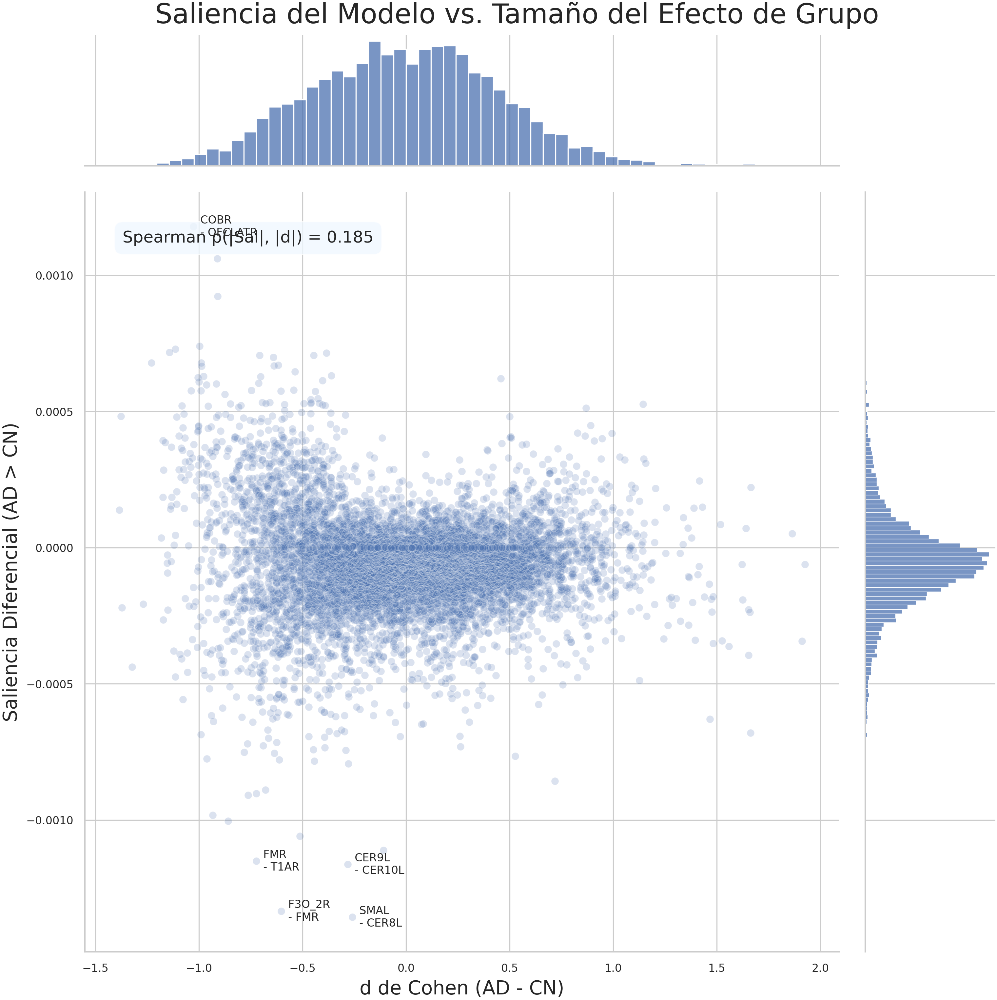

In [22]:
# --- ¡ATENCIÓN! ---
# Esta celda depende de la Celda 5 de la respuesta anterior para cargar los datos 
# del tensor y calcular el d de Cohen. Asegúrate de que esas variables estén disponibles.
# Aquí nos centramos en la visualización mejorada.

if 'df_edges' in locals() and 'cohen_d' in df_edges.columns:
    # Crear el jointplot
    g = sns.jointplot(
        data=df_edges, 
        x='cohen_d', 
        y='Saliency_Score', 
        kind="scatter",
        height=10,
        alpha=0.2,
        s=30, # Tamaño de los puntos
        edgecolor='w'
    )
    g.set_axis_labels("d de Cohen (AD - CN)", "Saliencia Diferencial (AD > CN)", fontsize=14)
    g.fig.suptitle('Saliencia del Modelo vs. Tamaño del Efecto de Grupo', y=1.02, fontsize=20)

    # Añadir la correlación de Spearman de las magnitudes
    corr, p_value = spearmanr(df_edges['Saliency_Score'].abs(), df_edges['cohen_d'].abs())
    g.ax_joint.text(
        0.05, 0.95, 
        f'Spearman ρ(|Sal|, |d|) = {corr:.3f}', 
        transform=g.ax_joint.transAxes, 
        ha='left', va='top', fontsize=12,
        bbox=dict(boxstyle='round,pad=0.5', fc='aliceblue', alpha=0.8)
    )

    # Anotar los puntos más extremos para dar contexto
    top_points = df_edges.sort_values('abs_saliency', ascending=False).head(5)
    for i, point in top_points.iterrows():
        g.ax_joint.text(
            point['cohen_d'], point['Saliency_Score'], 
            f"  {point['src_AAL3_Name']}\n  - {point['dst_AAL3_Name']}", 
            fontsize=8,
            verticalalignment='center'
        )
        
    plt.show()

else:
    print("La columna 'cohen_d' no fue calculada. Ejecuta el código de cálculo primero.")

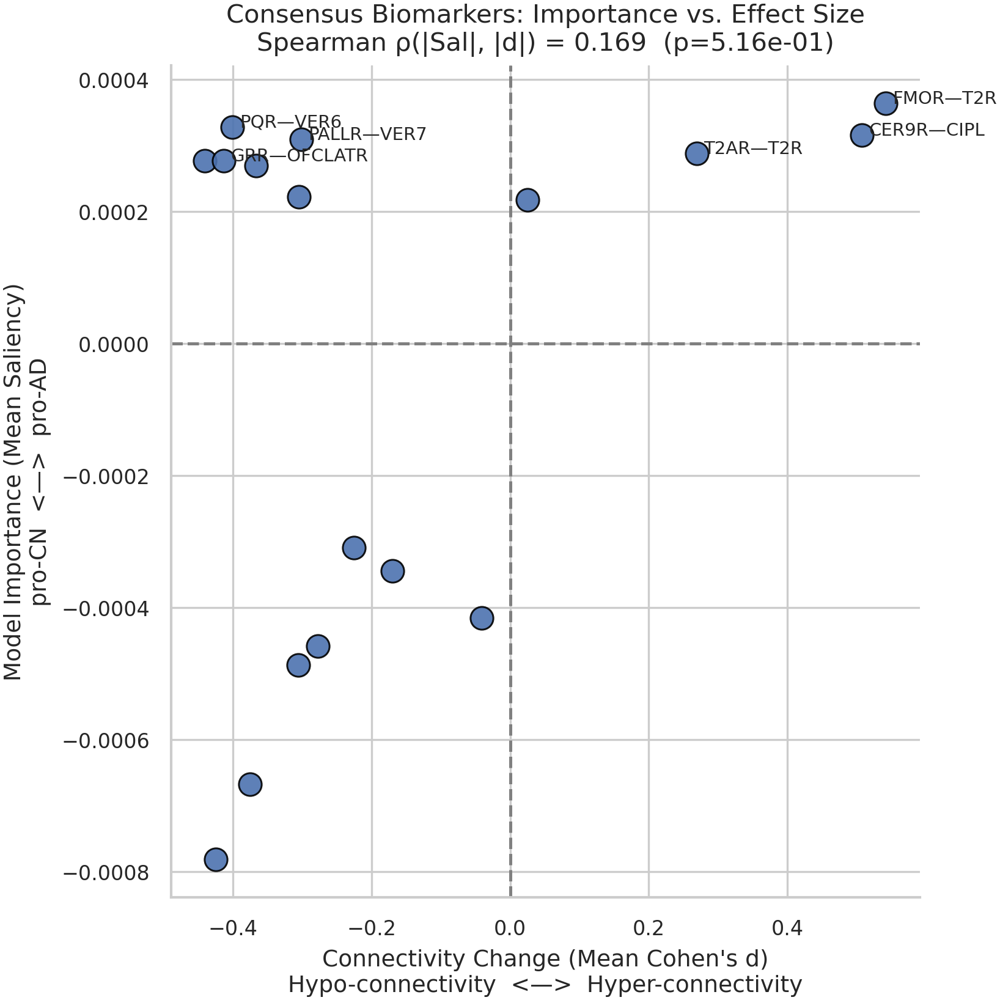

✅ mean_cohen_d calculado en test por fold y promediado entre folds.


In [23]:
# ===================================================================
# CELDA REEMPLAZO: Saliencia (media) vs. Cambio de Conectividad (Cohen's d real)
# ===================================================================
from pathlib import Path
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from scipy.stats import spearmanr

# --- Utilidad estable para d de Cohen (AD - CN) ---
def cohen_d(ad, cn, eps=1e-9):
    ad, cn = np.asarray(ad), np.asarray(cn)
    nx, ny = ad.size, cn.size
    if nx < 2 or ny < 2:
        return np.nan
    dof = nx + ny - 2
    s_ad = np.var(ad, ddof=1)
    s_cn = np.var(cn, ddof=1)
    pooled = np.sqrt(((nx - 1) * s_ad + (ny - 1) * s_cn) / max(dof, 1))
    if pooled < eps:
        return 0.0
    return (np.mean(ad) - np.mean(cn)) / pooled

# --- Carga de tensor y metadatos (usa tus rutas ya definidas) ---
npz = np.load(GLOBAL_TENSOR_PATH)
# Filtrar a canales seleccionados y mantener orden de sujetos del NPZ
tensor_all = npz["global_tensor_data"][:, CHANNELS_TO_USE, :, :]  # [n_subj, n_chan_sel, R, R]
subj_all_ids = pd.Series(npz["subject_ids"].astype(str), name="SubjectID")

meta = pd.read_csv(METADATA_PATH, usecols=["SubjectID", "ResearchGroup_Mapped"])
meta["SubjectID"] = meta["SubjectID"].astype(str).str.strip()

# DataFrame maestro alineado al NPZ
idx_df = pd.DataFrame({"SubjectID": subj_all_ids, "tensor_idx": np.arange(len(subj_all_ids))})
merged = idx_df.merge(meta, on="SubjectID", how="left")
cnad_df = merged[merged["ResearchGroup_Mapped"].isin(["CN", "AD"])].reset_index(drop=True)

# --- Conjunto de conexiones a evaluar y su (idx_i, idx_j) canónico ---
if not {"idx_i", "idx_j"}.issubset(df_full.columns):
    raise KeyError("df_full debe contener columnas 'idx_i' e 'idx_j' para mapear ROIs.")

conn_map = (
    df_full[["connection_id", "idx_i", "idx_j"]]
    .drop_duplicates("connection_id")
    .set_index("connection_id")
    .astype(int)
)

# --- d de Cohen por fold en TEST y promedio entre folds ---
N_FOLDS_FOUND = df_full["fold"].nunique()
cohen_per_fold = []

for f in range(1, N_FOLDS_FOUND + 1):
    test_idx_path = BASE_RUN_DIR / f"fold_{f}" / "test_indices.npy"
    if not test_idx_path.exists():
        print(f"⚠️ Falta test_indices en fold {f}: {test_idx_path}. Se omite este fold.")
        continue

    test_indices_in_cnad = np.load(test_idx_path)  # índices sobre cnad_df
    test_df = cnad_df.iloc[test_indices_in_cnad]

    ad_idx = test_df[test_df["ResearchGroup_Mapped"] == "AD"]["tensor_idx"].to_numpy()
    cn_idx = test_df[test_df["ResearchGroup_Mapped"] == "CN"]["tensor_idx"].to_numpy()

    if len(ad_idx) < 2 or len(cn_idx) < 2:
        print(f"⚠️ Muy pocos sujetos en test para fold {f}. Se omite.")
        continue

    rows = []
    for conn, (i, j) in conn_map.iterrows():
        # valor de conectividad por sujeto (promedio sobre canales seleccionados)
        # shape: [n_subj]
        vals_all = tensor_all[:, :, i, j].mean(axis=1)
        dval = cohen_d(vals_all[ad_idx], vals_all[cn_idx])
        rows.append((conn, dval))

    df_fold_d = pd.DataFrame(rows, columns=["connection_id", f"cohen_d_fold_{f}"]).set_index("connection_id")
    cohen_per_fold.append(df_fold_d)

if not cohen_per_fold:
    raise RuntimeError("No se pudo calcular Cohen's d en ningún fold (revisa test_indices.npy y metadatos).")

df_cohen_all = pd.concat(cohen_per_fold, axis=1)

# Promedio (ignorando NaNs si algún fold faltó) y dispersión por si quieres reportarla
df_cohen_all["mean_cohen_d"] = df_cohen_all.mean(axis=1, skipna=True)
df_cohen_all["std_cohen_d"]  = df_cohen_all.std(axis=1,  skipna=True)

# --- Saliencia media entre folds (para el eje Y del plot) ---
df_mean_saliency = df_full.groupby("connection_id")["Saliency_Score"].mean().rename("mean_saliency")

# --- Merge para análisis (y filtro al consensus set) ---
df_analysis = pd.concat([df_mean_saliency, df_cohen_all["mean_cohen_d"]], axis=1).dropna()
df_consensus_analysis = df_analysis.loc[df_analysis.index.intersection(consensus_set.index)].copy()
df_consensus_analysis["conn_str"] = df_consensus_analysis.index.map(lambda t: f"{t[0]}—{t[1]}")

# --- Correlación (opcional, magnitudes) ---
rho, pval = spearmanr(df_consensus_analysis["mean_saliency"].abs(),
                      df_consensus_analysis["mean_cohen_d"].abs())

# --- Quadrant plot ---
fig, ax = plt.subplots(figsize=(5.5, 5.5), constrained_layout=True)
sns.scatterplot(
    data=df_consensus_analysis,
    x="mean_cohen_d", y="mean_saliency",
    s=80, edgecolor="black", alpha=0.9, ax=ax
)
ax.axhline(0, color="grey", ls="--"); ax.axvline(0, color="grey", ls="--")
ax.set_title(
    f"Consensus Biomarkers: Importance vs. Effect Size\n"
    f"Spearman ρ(|Sal|, |d|) = {rho:.3f}  (p={pval:.2e})"
)
ax.set_xlabel("Connectivity Change (Mean Cohen's d)\nHypo-connectivity  <—>  Hyper-connectivity")
ax.set_ylabel("Model Importance (Mean Saliency)\npro-CN  <—>  pro-AD")

# Anotar algunas conexiones más salientes para contexto
for _, r in df_consensus_analysis.sort_values("mean_saliency", ascending=False).head(6).iterrows():
    ax.text(r["mean_cohen_d"] + 0.01, r["mean_saliency"], r["conn_str"], fontsize=7)

savefig_nature(fig, FIG_DIR / "fig_SI_quadrant_plot")
plt.show()

print("✅ mean_cohen_d calculado en test por fold y promediado entre folds.")


### 2.3. ¿De Dónde Viene la Información? Contribución por Canal y Lateralidad

Finalmente, investigamos dos fuentes de variación:
- **Contribución por Canal**: Analizamos qué métrica de conectividad (canal) aporta la mayor "energía" de saliencia, revelando qué tipo de dinámica funcional es más discriminativa.
- **Asimetría Hemisférica**: Usamos un **test binomial** para determinar si existe una lateralización estadísticamente significativa en las conexiones más salientes (p. ej., si las conexiones dentro del hemisferio derecho son más frecuentes de lo esperado).


✅ Se cargaron datos de contribución de canales de 5 folds.


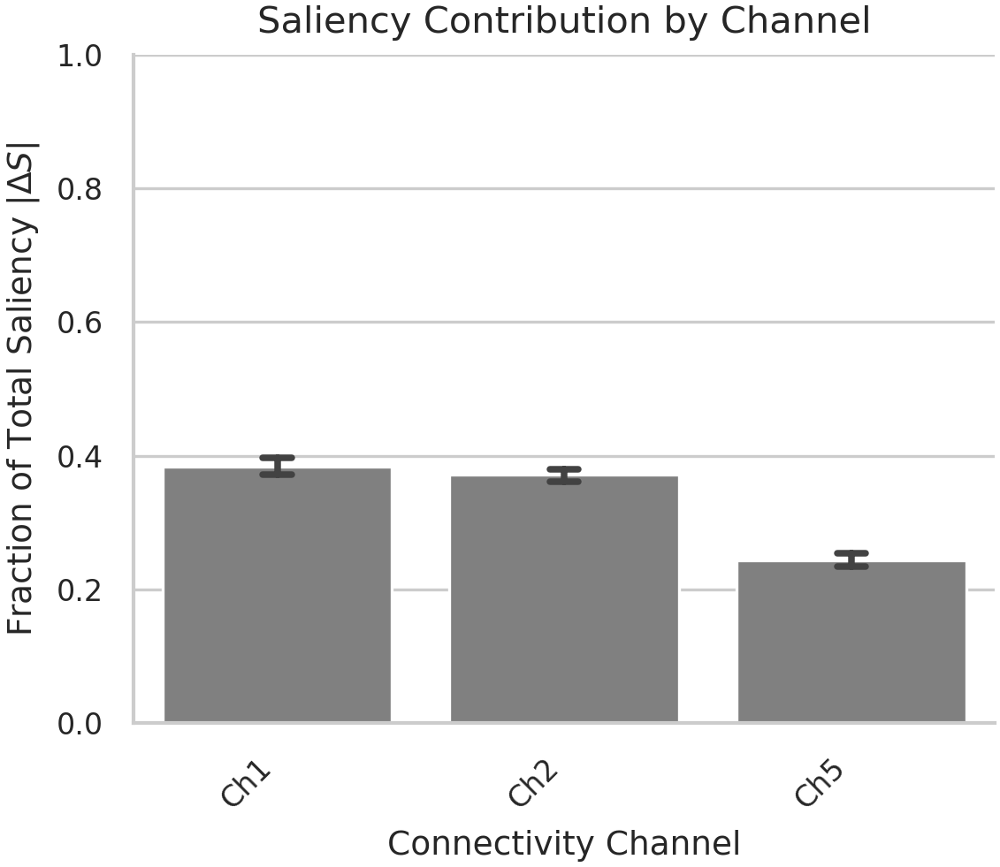

In [24]:
# ===================================================================
# CELDA CORREGIDA: CONTRIBUCIÓN POR CANAL (PROMEDIADO ENTRE FOLDS)
# ===================================================================
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

# --- Configuración de rutas ---
BASE_RUN_DIR = Path('./resultados_13_paper')
CLF = 'mlp'
SUFFIX = '_integrated_gradients_top50'
N_FOLDS = 5

# --- Recolectar datos de todos los folds ---
channel_contributions_rows = []
files_found = 0
for i in range(1, N_FOLDS + 1):
    file_path = BASE_RUN_DIR / f'fold_{i}/interpretability_{CLF}/channel_contributions{SUFFIX}.csv'
    if file_path.exists():
        df_contribution = pd.read_csv(file_path)
        df_contribution['fold'] = i
        channel_contributions_rows.append(df_contribution)
        files_found += 1
    else:
        print(f"⚠️ Advertencia: No se encontró el archivo para el fold {i} en: {file_path}")

# --- Proceder solo si se encontraron archivos ---
if channel_contributions_rows:
    df_contributions_all_folds = pd.concat(channel_contributions_rows, ignore_index=True)
    print(f"\n✅ Se cargaron datos de contribución de canales de {files_found} folds.")

    # --- Generar el gráfico con barras de error ---
    fig, ax = plt.subplots(figsize=(4, 3.5))
    
    sns.barplot(
        data=df_contributions_all_folds, 
        x='channel_name', 
        y='l1_norm_fraction', 
        color='gray',
        errorbar=('ci', 95),
        capsize=.1,
        ax=ax
    )
    
    ax.set_title('Saliency Contribution by Channel')
    ax.set_xlabel('Connectivity Channel')
    ax.set_ylabel(r'Fraction of Total Saliency $|\Delta S|$')
    ax.set_ylim(0, 1)
    
    # --- LÍNEA CORREGIDA ---
    # La rotación y alineación se controlan aquí, no en tick_params
    plt.xticks(rotation=45, ha='right')
    
    fig.tight_layout()
    
    savefig_nature(fig, FIG_DIR / 'fig_SI_channel_contributions')
    plt.show()

else:
    print("\n❌ No se encontraron archivos de contribución de canales. No se puede generar el gráfico.")

### Lateralidad y hubs robustos

**Lateralidad:** clasificamos aristas Top-K en R–R, L–L, R–L, L–R y usamos un **test binomial** para R–R vs L–L (H0: p=0.5).  
**Hubs robustos:** para Top-K calculamos, por nodo, el **node-strength** $s$ (suma de $|\Delta S|$) y el **grado** $d$. 
Ajustamos $s$ por $d$ con una regresión lineal $s\approx \beta_0+\beta_1 d$; los **residuales** identifican hubs
con fuerza “excesiva” no explicada por su grado.


In [25]:
# ===================================================================
# CELDA 4: CÁLCULO DE PROPIEDADES DE LA FIRMA (LATERALIDAD)
# ===================================================================
import re
from statsmodels.stats.proportion import proportion_confint

def lat_summary_global(df, K):
    top = df[df['Rank'] <= K]
    
    # Agrupamos por fold y calculamos las cuentas para cada uno
    counts_per_fold = top.groupby('fold', observed=True)[['hemi_src','hemi_dst']].apply(lambda g: pd.Series({
        'R-R': ((g['hemi_src'] == 'R') & (g['hemi_dst'] == 'R')).sum(),
        'L-L': ((g['hemi_src'] == 'L') & (g['hemi_dst'] == 'L')).sum(),
    }))
    
    # Calculamos la proporción R-R para cada fold
    counts_per_fold['n_sided'] = counts_per_fold['R-R'] + counts_per_fold['L-L']
    counts_per_fold['p_RR'] = counts_per_fold['R-R'] / counts_per_fold['n_sided'].replace(0, 1)
    
    return counts_per_fold['p_RR']


# Calculamos y agregamos las proporciones para los K de interés
lat_proportions = []
for K in (50, 100, 200):
    p_rr_folds = lat_summary_global(df_full, K)
    for fold, p_rr in p_rr_folds.items():
        lat_proportions.append({'TopK': str(K), 'p_RR': p_rr, 'fold': fold})

df_lat_plot = pd.DataFrame(lat_proportions)

print("✅ Datos de lateralización calculados y listos para graficar.")
display(df_lat_plot.head())

✅ Datos de lateralización calculados y listos para graficar.


,TopK,p_RR,fold
0,50,0.689655,1
1,50,0.857143,2
2,50,1.000000,3
3,50,0.843750,4
4,50,0.956522,5


/tmp/ipykernel_146659/745557603.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.96])


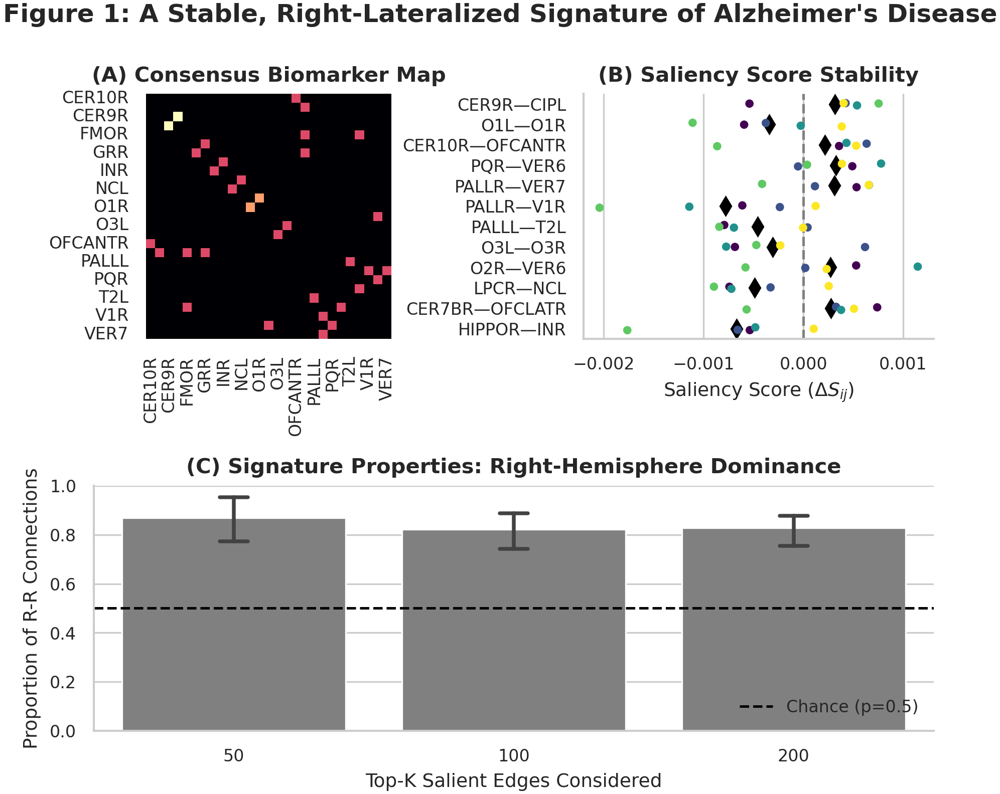

In [26]:
# ===================================================================
# CELDA 5: FIGURA PRINCIPAL DE RESULTADOS (VERSIÓN FINAL)
# ===================================================================

fig = plt.figure(figsize=(7.2, 5.5))
gs = mpl.gridspec.GridSpec(2, 2, height_ratios=[1, 1], hspace=0.6, wspace=0.4)

# --- Panel A: Mapa del Consensus Set ---
ax_a = fig.add_subplot(gs[0, 0])
consensus_rois = sorted(list(set(roi for conn in consensus_set.index for roi in conn)))
stab_matrix = pd.DataFrame(0, index=consensus_rois, columns=consensus_rois, dtype=float)
for (src, dst), row in consensus_set.iterrows():
    stab_matrix.loc[src, dst] = stab_matrix.loc[dst, src] = row['score']
sns.heatmap(stab_matrix, cmap='magma', cbar=False, ax=ax_a, square=True)
ax_a.set_title('(A) Consensus Biomarker Map', weight='bold')
ax_a.tick_params(axis='x', rotation=90)

# --- Panel B: Dotplot Per-Fold ---
ax_b = fig.add_subplot(gs[0, 1])
N_DOTPLOT = min(12, len(consensus_set))
dotplot_edges = consensus_set.head(N_DOTPLOT)
plot_data = df_full[df_full['connection_id'].isin(dotplot_edges.index)].copy()
plot_data['connection_str'] = plot_data['connection_id'].apply(lambda x: f"{x[0]}—{x[1]}")
y_order = [f"{idx[0]}—{idx[1]}" for idx in dotplot_edges.index]
sns.stripplot(data=plot_data, y='connection_str', x='Saliency_Score', hue='fold', 
              palette='viridis', jitter=0.1, size=4, order=y_order, ax=ax_b, legend=False)
sns.pointplot(data=plot_data, y='connection_str', x='Saliency_Score', order=y_order, 
              ax=ax_b, color='black', linestyle='none', markersize=5, marker='d', errorbar=None)
ax_b.axvline(0, ls='--', color='grey')
ax_b.set_title('(B) Saliency Score Stability', weight='bold')
ax_b.set_xlabel(r'Saliency Score ($\Delta S_{ij}$)')
ax_b.set_ylabel('')

# --- Panel C: Propiedades de la Firma (Lateralidad) ---
ax_c = fig.add_subplot(gs[1, :])
sns.barplot(data=df_lat_plot, x='TopK', y='p_RR', color='gray', ax=ax_c, capsize=0.1, errorbar=('ci', 95))
ax_c.axhline(0.5, ls='--', color='black', label='Chance (p=0.5)')
ax_c.set_title('(C) Signature Properties: Right-Hemisphere Dominance', weight='bold')
ax_c.set_xlabel('Top-K Salient Edges Considered')
ax_c.set_ylabel('Proportion of R-R Connections')
ax_c.set_ylim(0, 1)
ax_c.legend(frameon=False, loc='lower right')

plt.suptitle("Figure 1: A Stable, Right-Lateralized Signature of Alzheimer's Disease", fontsize=12, weight='bold', y=0.99)
fig.tight_layout(rect=[0, 0, 1, 0.96])
savefig_nature(fig, FIG_DIR / 'fig_main_summary_COMPLETE')
plt.show()

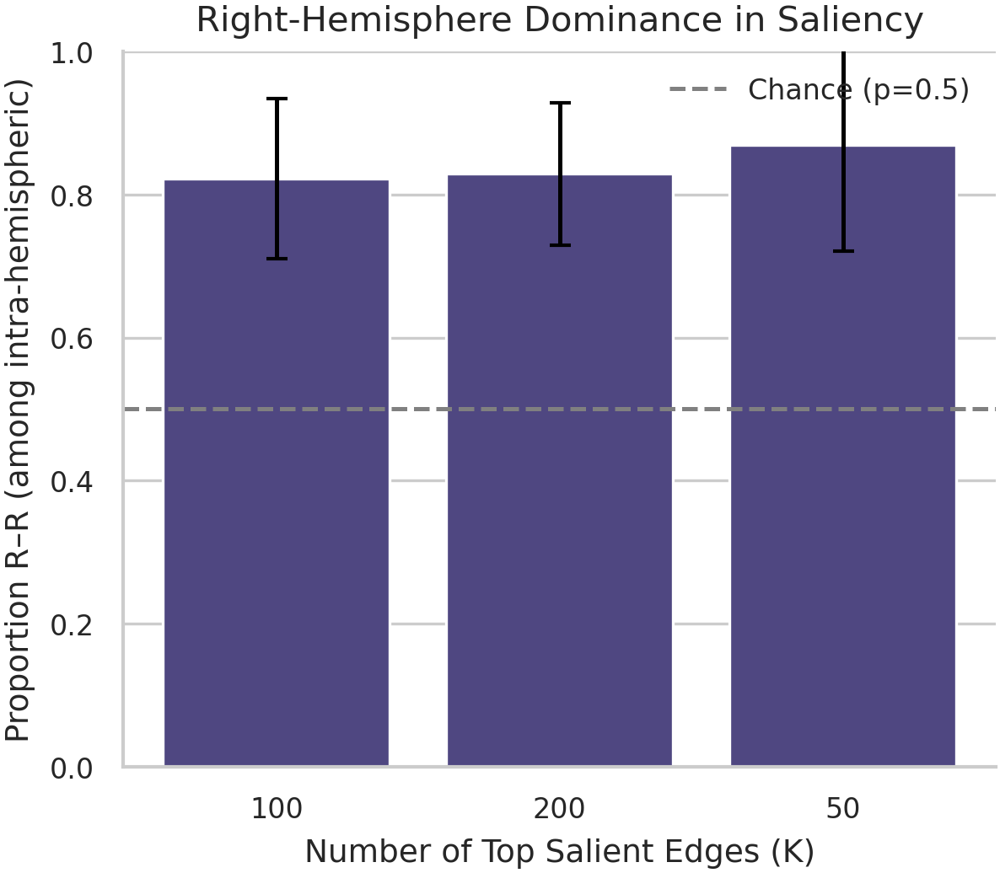

In [27]:
# ===================================================================
# CELDA CORREGIDA: VISUALIZACIÓN DE LATERALIZACIÓN (usa df_lat_plot)
# ===================================================================
from scipy.stats import t

# --- Agregamos los datos para graficar con barras de error ---
# LÍNEA CORREGIDA: Usamos 'Top-K' en lugar de 'TopK'
agg = df_lat_plot.groupby("TopK")["p_RR"].agg(["mean","count","std"]).reset_index()

agg["sem"] = agg["std"] / np.sqrt(agg["count"])
t975 = t.ppf(0.975, df=agg["count"]-1)
agg["ci"] = t975 * agg["sem"]
agg["TopK"] = agg["TopK"].astype(str)

# --- Creación del Gráfico ---
fig, ax = plt.subplots(figsize=(4, 3.5), constrained_layout=True)

sns.barplot(data=agg, x="TopK", y="mean", color="darkslateblue", ax=ax)
ax.errorbar(agg["TopK"], agg["mean"], yerr=agg["ci"], fmt="none", c="black", capsize=3)

ax.axhline(0.5, ls="--", color="grey", label="Chance (p=0.5)")
ax.set_title("Right-Hemisphere Dominance in Saliency")
ax.set_xlabel("Number of Top Salient Edges (K)")
ax.set_ylabel("Proportion R–R (among intra-hemispheric)")
ax.set_ylim(0, 1)
ax.legend(frameon=False)

# --- Guardado de la Figura ---
savefig_nature(fig, FIG_DIR / "fig_SI_lateralization_bias")
plt.show()

✅ Figura guardada en: 
Figures_Nature/network_block_yeo17_deltaS.pdf
Figures_Nature/network_block_yeo17_deltaS.png


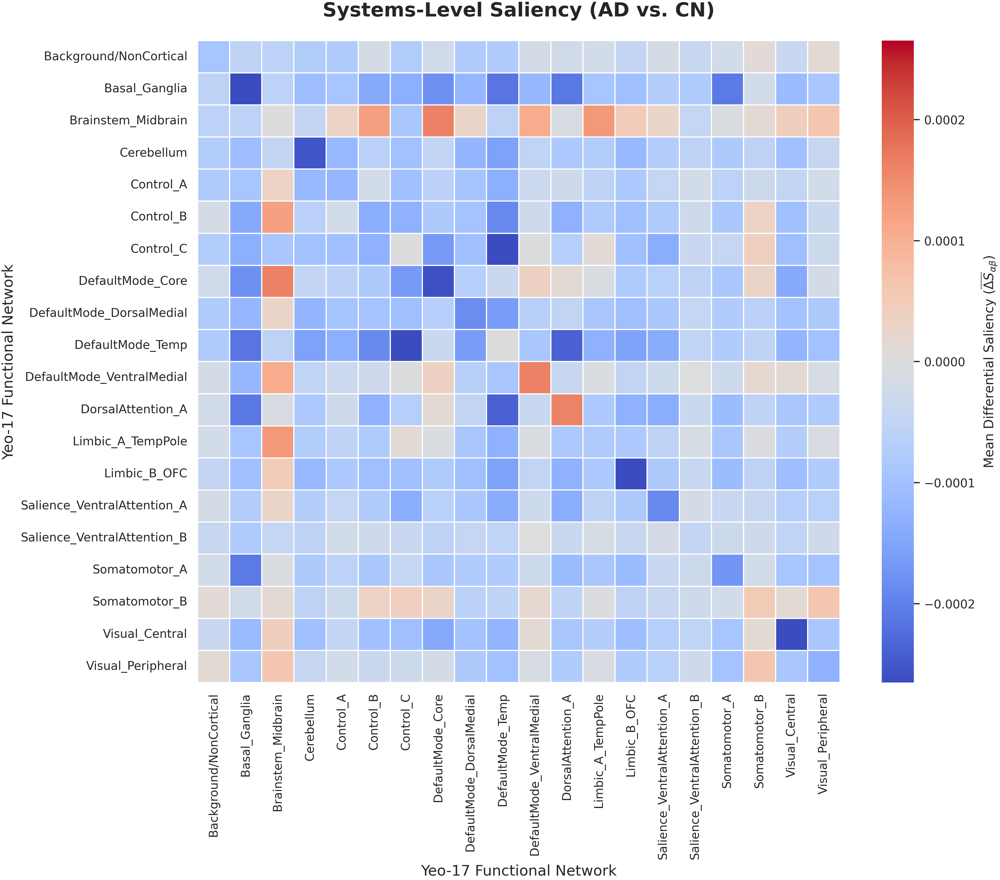

In [28]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

# --- Configuración (ajusta si es necesario) ---
# Asegúrate de que estas rutas coincidan con tu notebook
RUN_DIR = Path('./resultados_13_paper/fold_1/interpretability_mlp')
SUFFIX = '_integrated_gradients_top50'
FIG_OUTPUT_DIR = FIG_DIR

# --- Cargar los datos generados por tu script ---
# Usamos la matriz con signo para ver la dirección del efecto (AD vs CN)
saliency_sum_path = RUN_DIR / f'network_pairs_signed{SUFFIX}.csv'
df_saliency_sum = pd.read_csv(saliency_sum_path, index_col=0)

# Para normalizar de suma a promedio, necesitamos el número de conexiones por par de redes
edges_path = RUN_DIR / f'ranking_conexiones_ANOTADO{SUFFIX}.csv'
df_edges = pd.read_csv(edges_path)

# --- 1. Calcular el número de conexiones por cada par de redes ---
net_src_col = 'src_Refined_Network' if 'src_Refined_Network' in df_edges.columns else 'src_Yeo17_Network'
net_dst_col = 'dst_Refined_Network' if 'dst_Refined_Network' in df_edges.columns else 'dst_Yeo17_Network'

# Crear una columna 'pair' canónica (ordenada alfabéticamente)
df_edges['pair'] = df_edges.apply(
    lambda row: tuple(sorted((str(row[net_src_col]), str(row[net_dst_col])))),
    axis=1
)
pair_counts = df_edges['pair'].value_counts().to_dict()

# Crear una matriz de conteos con el mismo orden que la matriz de saliencia
network_names = df_saliency_sum.index.tolist()
count_matrix = pd.DataFrame(0, index=network_names, columns=network_names)
for i, net1 in enumerate(network_names):
    for j, net2 in enumerate(network_names[i:], start=i):
        count = pair_counts.get(tuple(sorted((net1, net2))), 0)
        count_matrix.loc[net1, net2] = count
        count_matrix.loc[net2, net1] = count

# --- 2. Calcular la Saliencia Promedio (Suma / Conteo) ---
# Evitamos la división por cero para pares sin conexiones
with np.errstate(divide='ignore', invalid='ignore'):
    df_saliency_mean = (df_saliency_sum / count_matrix).fillna(0)

# --- 3. Generar el Heatmap de calidad para el paper ---
plt.figure(figsize=(12, 10))
sns.set_theme(style="white", context="paper", font_scale=1.1)

# Usamos un colormap divergente centrado en cero
vmax = np.percentile(np.abs(df_saliency_mean.values), 99) # Saturar colores para mejor contraste

ax = sns.heatmap(
    df_saliency_mean,
    cmap='coolwarm',
    center=0,
    linewidths=.5,
    annot=False,
    square=True,
    vmax=vmax,
    vmin=-vmax,
    # AÑADIMOS LA 'r' PARA CREAR UNA RAW STRING Y SOLUCIONAR EL ERROR
    cbar_kws={'label': r'Mean Differential Saliency ($\overline{\Delta S}_{\alpha\beta}$)'} 
)

ax.set_title('Systems-Level Saliency (AD vs. CN)', fontsize=16, weight='bold', pad=20)
ax.set_xlabel('Yeo-17 Functional Network', fontsize=12)
ax.set_ylabel('Yeo-17 Functional Network', fontsize=12)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()

# --- 4. Guardar la figura en el formato deseado ---
output_filename = FIG_OUTPUT_DIR / 'network_block_yeo17_deltaS'
plt.savefig(f'{output_filename}.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{output_filename}.png', dpi=300, bbox_inches='tight')

print(f"✅ Figura guardada en: \n{output_filename}.pdf\n{output_filename}.png")

plt.show()

✅ Figura del fold representativo guardada en: 
Figures_Nature/fig_top10_edges_representative_fold.pdf
Figures_Nature/fig_top10_edges_representative_fold.png


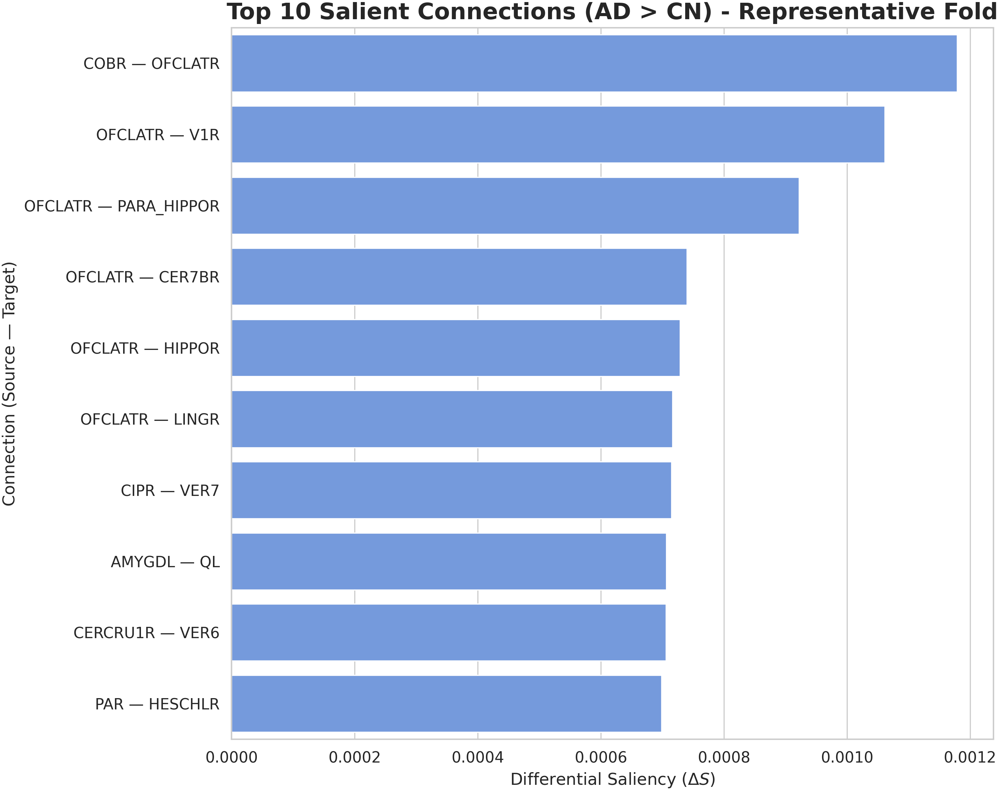


--- Copiar y pegar en la Tabla LaTeX del paper (Fold 1) ---
1 & \texttt{COBR — OFCLATR} & 1.18 \\
2 & \texttt{OFCLATR — V1R} & 1.06 \\
3 & \texttt{OFCLATR — PARA\_HIPPOR} & 0.92 \\
4 & \texttt{OFCLATR — CER7BR} & 0.74 \\
5 & \texttt{OFCLATR — HIPPOR} & 0.73 \\
6 & \texttt{OFCLATR — LINGR} & 0.72 \\
7 & \texttt{CIPR — VER7} & 0.71 \\
8 & \texttt{AMYGDL — QL} & 0.71 \\
9 & \texttt{CERCRU1R — VER6} & 0.71 \\
10 & \texttt{PAR — HESCHLR} & 0.70 \\


In [29]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

# --- Configuración ---
# MOSTRAMOS SOLO EL FOLD 1 COMO CASO REPRESENTATIVO
BASE_RUN_DIR = Path('./resultados_13_paper')
CLF = 'mlp'
SUFFIX = '_integrated_gradients_top50'
#FIG_OUTPUT_DIR = Path('./Figures')
#FIG_OUTPUT_DIR.mkdir(exist_ok=True)
FOLD_TO_SHOW = 1

# --- Cargar datos del Fold 1 ---
edges_path = BASE_RUN_DIR / f'fold_{FOLD_TO_SHOW}/interpretability_{CLF}/ranking_conexiones_ANOTADO{SUFFIX}.csv'
if not edges_path.exists():
    raise FileNotFoundError(f"No se encontró el archivo para el fold {FOLD_TO_SHOW}: {edges_path}")

df_fold1 = pd.read_csv(edges_path)
df_fold1['connection_id'] = df_fold1['src_AAL3_Name'] + ' — ' + df_fold1['dst_AAL3_Name']

# --- Obtener el Top 10 de este fold ---
# Filtramos por Saliency > 0 para mostrar solo las conexiones "pro-AD"
df_top10_fold1 = df_fold1[df_fold1['Saliency_Score'] > 0].nsmallest(10, 'Rank')

# --- Generar la nueva figura (sin barras de error) ---
plt.figure(figsize=(10, 8))
sns.set_theme(style="whitegrid", context="paper", font_scale=1.2)

ax = sns.barplot(
    x=df_top10_fold1['Saliency_Score'],
    y=df_top10_fold1['connection_id'],
    color='cornflowerblue'
)

ax.set_title(f'Top 10 Salient Connections (AD > CN) - Representative Fold', fontsize=16, weight='bold')
ax.set_xlabel(r'Differential Saliency ($\Delta S$)')
ax.set_ylabel('Connection (Source — Target)')
plt.tight_layout()

# --- Guardar la figura actualizada ---
output_filename = FIG_OUTPUT_DIR / 'fig_top10_edges_representative_fold'
plt.savefig(f'{output_filename}.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{output_filename}.png', dpi=300, bbox_inches='tight')
print(f"✅ Figura del fold representativo guardada en: \n{output_filename}.pdf\n{output_filename}.png")
plt.show()

# --- Imprimir la tabla del Fold 1 para LaTeX ---
print("\n--- Copiar y pegar en la Tabla LaTeX del paper (Fold 1) ---")
for index, row in df_top10_fold1.reset_index().iterrows():
    conn_name = row['connection_id'].replace('_', r'\_')
    mean_val = f"{row['Saliency_Score'] * 1000:.2f}"
    print(f"{index+1} & \\texttt{{{conn_name}}} & {mean_val} \\\\")


✅ Se cargaron datos de ranking de 5 folds.


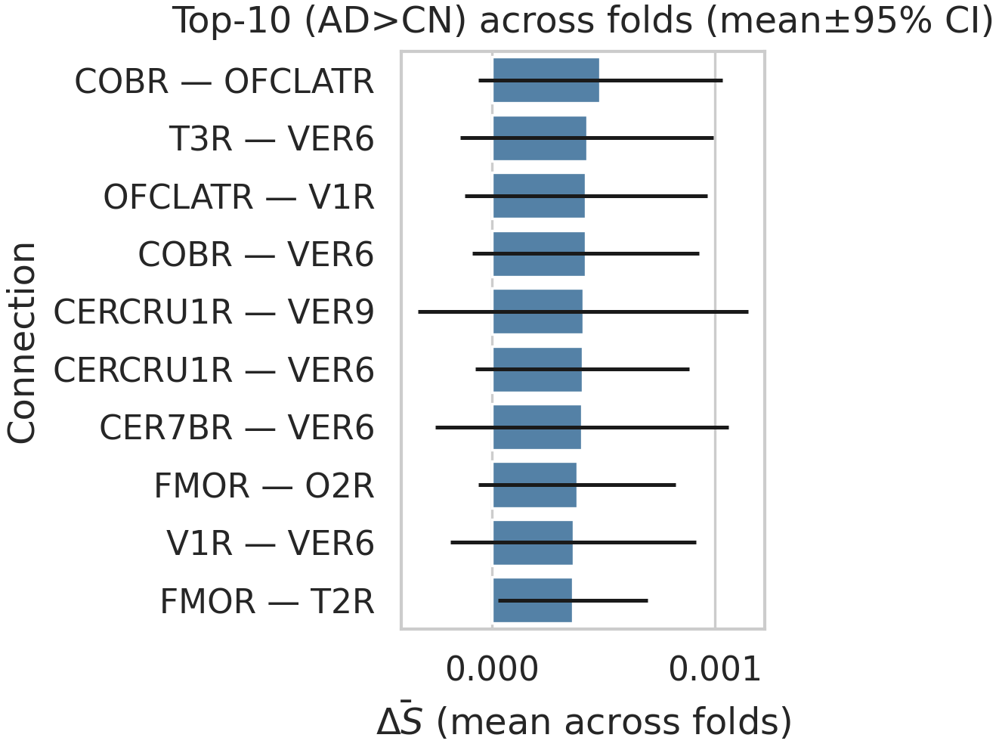

✅ Tabla LaTeX exportada a: Tables/top10_edges_acrossfolds.tex


In [30]:
# ===================================================================
# CELDA CORREGIDA: CÁLCULO Y EXPORTACIÓN DE ESTABILIDAD
# ===================================================================
from functools import reduce
from scipy import stats
import numpy as np
import pandas as pd
from pathlib import Path

# --- Configuración de rutas (la clave es usar una ruta base) ---
BASE_RUN_DIR = Path('./resultados_13_paper')
CLF = 'mlp'
SUFFIX = '_integrated_gradients_top50'
N_FOLDS = 5

# --- Cargar y consolidar los datos de todos los folds ---
all_folds = []
files_found = 0
for i in range(1, N_FOLDS + 1):
    # Construimos la ruta completa desde la base para cada fold
    path = BASE_RUN_DIR / f'fold_{i}/interpretability_{CLF}/ranking_conexiones_ANOTADO{SUFFIX}.csv'
    
    if path.exists():
        dfi = pd.read_csv(path)
        dfi['connection_id'] = dfi['src_AAL3_Name'] + ' — ' + dfi['dst_AAL3_Name']
        all_folds.append(dfi[['connection_id','Saliency_Score']].rename(columns={'Saliency_Score': f'saliency_fold_{i}'}))
        files_found += 1
    else:
        print(f"⚠️ Advertencia: No se encontró el archivo para el fold {i} en: {path}")

# --- Proceder solo si se encontraron archivos ---
if not all_folds:
    raise FileNotFoundError("No se encontraron datos de ranking para ningún fold. No se puede continuar.")

print(f"\n✅ Se cargaron datos de ranking de {files_found} folds.")
dfm = reduce(lambda a, b: a.merge(b, on='connection_id', how='outer'), all_folds).set_index('connection_id')

# --- Calcular estadísticas de estabilidad ---
cols = [c for c in dfm.columns if c.startswith('saliency_fold_')]
dfm['mean_sal'] = dfm[cols].mean(axis=1)
dfm['std_sal']  = dfm[cols].std(axis=1)
dfm['sem']      = dfm['std_sal'] / np.sqrt(N_FOLDS)
t975 = stats.t.ppf(0.975, df=N_FOLDS - 1)
dfm['ci95'] = t975 * dfm['sem']

top10 = dfm.sort_values('mean_sal', ascending=False).head(10)

# --- Visualización ---

plt.figure(figsize=(3.7, 3.6))
sns.barplot(x=top10['mean_sal'], y=top10.index, color='steelblue', xerr=top10['ci95'].values)
plt.xlabel(r'$\bar{\Delta S}$ (mean across folds)')
plt.ylabel('Connection')
plt.title('Top-10 (AD>CN) across folds (mean±95% CI)')
plt.tight_layout()
savefig_nature(plt.gcf(), FIG_DIR / 'fig_top10_edges_acrossfolds')
plt.show()

# --- Exportar a LaTeX (CORREGIDO) ---
TBL_DIR = Path('./Tables'); TBL_DIR.mkdir(exist_ok=True)
tex_path = TBL_DIR / 'top10_edges_acrossfolds.tex'
with open(tex_path, 'w') as f:
    f.write("\\begin{tabular}{ll}\n\\toprule\n")
    f.write("Connection & $\\bar{\\Delta S}$ [95\\% CI] \\\\\n\\midrule\n")
    for name, r in top10.iterrows():
        # 1. Pre-formatear el nombre para LaTeX
        latex_name = name.replace('_', '\\_')
        # 2. Construir la línea usando la variable pre-formateada
        line = f"{latex_name} & {1000 * r['mean_sal']:.2f} [{1000 * (r['mean_sal'] - r['ci95']):.2f}, {1000 * (r['mean_sal'] + r['ci95']):.2f}] \\\\\n"
        f.write(line)
    f.write("\\bottomrule\n\\end{tabular}\n")

print(f"✅ Tabla LaTeX exportada a: {tex_path}")

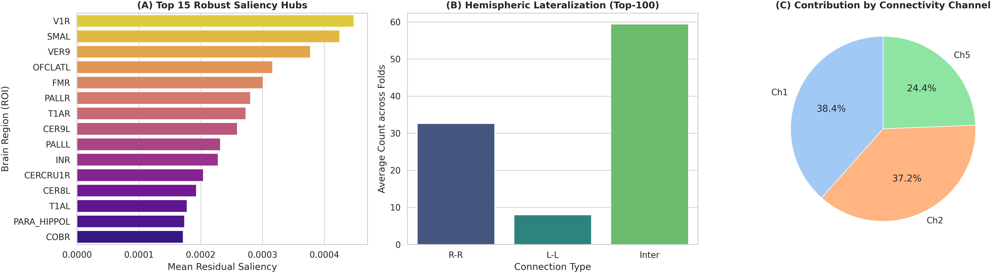

✅ Figura de propiedades guardada en: Figures_Nature/fig_signature_properties.pdf


In [31]:
# ===================================================================
# PASO ADICIONAL: Generar figura de propiedades de la firma de AD
# ===================================================================

# --- Recolectar datos de todos los folds para promediar ---
all_hubs_df = []
all_lateralization_counts = []
all_channel_contrib_df = []

for i in range(1, N_FOLDS + 1):
    interp_dir = BASE_RUN_DIR / f'fold_{i}/interpretability_{CLF}'
    
    # Cargar hubs robustos
    hubs_path = interp_dir / f'node_robust_hubs_top200{SUFFIX}.csv'
    if hubs_path.exists():
        all_hubs_df.append(pd.read_csv(hubs_path))

    # Cargar contribución de canales
    channels_path = interp_dir / f'channel_contributions{SUFFIX}.csv'
    if channels_path.exists():
        all_channel_contrib_df.append(pd.read_csv(channels_path))

    # Calcular lateralidad (reusando el código que ya tienes)
    edges_path = interp_dir / f'ranking_conexiones_ANOTADO{SUFFIX}.csv'
    if edges_path.exists():
        edges_df = pd.read_csv(edges_path).head(100) # Top-100 para lateralidad
        edges_df['hemi_src'] = edges_df['src_AAL3_Name'].str[-1]
        edges_df['hemi_dst'] = edges_df['dst_AAL3_Name'].str[-1]
        
        counts = {
            'R-R': ((edges_df['hemi_src'] == 'R') & (edges_df['hemi_dst'] == 'R')).sum(),
            'L-L': ((edges_df['hemi_src'] == 'L') & (edges_df['hemi_dst'] == 'L')).sum(),
            'Inter': ((edges_df['hemi_src'] != edges_df['hemi_dst'])).sum()
        }
        all_lateralization_counts.append(counts)

# --- Procesar y promediar los datos ---
# 1. Hubs: promediar el 'residual_strength' y tomar el top 15
df_hubs_agg = pd.concat(all_hubs_df).groupby('node')['residual_strength'].mean().nlargest(15).reset_index()

# 2. Lateralidad: promediar las cuentas
df_lat_agg = pd.DataFrame(all_lateralization_counts).mean().reset_index()
df_lat_agg.columns = ['Hemisphere Pair', 'Average Count']

# 3. Canales: promediar la fracción de contribución
df_chan_agg = pd.concat(all_channel_contrib_df).groupby('channel_name')['l1_norm_fraction'].mean().reset_index()


# --- Crear la figura de 3 paneles ---
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
sns.set_theme(style="whitegrid", context="paper", font_scale=1.2)

# Panel A: Hubs Robustos
sns.barplot(data=df_hubs_agg, x='residual_strength', y='node', ax=axes[0], palette='plasma_r', orient='h')
axes[0].set_title('(A) Top 15 Robust Saliency Hubs', weight='bold')
axes[0].set_xlabel('Mean Residual Saliency')
axes[0].set_ylabel('Brain Region (ROI)')

# Panel B: Lateralidad
sns.barplot(data=df_lat_agg, x='Hemisphere Pair', y='Average Count', ax=axes[1], palette='viridis')
axes[1].set_title('(B) Hemispheric Lateralization (Top-100)', weight='bold')
axes[1].set_xlabel('Connection Type')
axes[1].set_ylabel('Average Count across Folds')

# Panel C: Contribución de Canales
axes[2].pie(df_chan_agg['l1_norm_fraction'], labels=df_chan_agg['channel_name'], 
          autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
axes[2].set_title('(C) Contribution by Connectivity Channel', weight='bold')

plt.tight_layout()
output_filename_props = FIG_OUTPUT_DIR / 'fig_signature_properties.pdf'
plt.savefig(output_filename_props, dpi=300, bbox_inches='tight')
plt.show()
print(f"✅ Figura de propiedades guardada en: {output_filename_props}")

In [32]:
# ===================================================================
# PASO 1: Cargar datos y calcular métricas de estabilidad
# ===================================================================
import pandas as pd
import numpy as np
from pathlib import Path
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

# --- Configuración ---
BASE_RUN_DIR = Path('./resultados_13_paper')
CLF = 'mlp'
SUFFIX = '_integrated_gradients_top50'
N_FOLDS = 5
TOP_K = 200 # Umbral para definir si una arista es "importante" en un fold
#FIG_OUTPUT_DIR = Path('./Figures')
#FIG_OUTPUT_DIR.mkdir(exist_ok=True)
sns.set_theme(style="whitegrid", context="paper", font_scale=1.2)


# --- Cargar los datos de los 5 folds ---
all_fold_edges = {}
for i in range(1, N_FOLDS + 1):
    edges_path = BASE_RUN_DIR / f'fold_{i}/interpretability_{CLF}/ranking_conexiones_ANOTADO{SUFFIX}.csv'
    if edges_path.exists():
        df_fold = pd.read_csv(edges_path)
        df_fold['connection_id'] = df_fold.apply(
            lambda row: tuple(sorted((row['src_AAL3_Name'], row['dst_AAL3_Name']))),
            axis=1
        )
        all_fold_edges[i] = df_fold.set_index('connection_id')
print(f"Cargados los datos de {len(all_fold_edges)} folds.")


# --- Calcular Frecuencia de Réplica (pi) ---
top_k_sets = {
    fold: set(df.head(TOP_K).index) 
    for fold, df in all_fold_edges.items()
}
edge_counts = Counter(edge for fold_set in top_k_sets.values() for edge in fold_set)
pi_values = {edge: count / N_FOLDS for edge, count in edge_counts.items()}


# --- Calcular Consistencia de Signo (tau) ---
df_all_scores = pd.DataFrame({f'saliency_fold_{f}': df['Saliency_Score'] for f, df in all_fold_edges.items()})
tau_values = np.sign(df_all_scores).mean(axis=1).abs()


# --- Crear DataFrame de Estabilidad y el Consensus Set ---
df_stability = pd.DataFrame({'pi': pd.Series(pi_values), 'tau': tau_values}).fillna({'pi': 0})
consensus_mask = (df_stability['pi'] >= 0.6) & (df_stability['tau'] >= 0.6)
consensus_set = df_stability[consensus_mask].copy()
consensus_set['stability_score'] = consensus_set['pi'] * consensus_set['tau']
consensus_set = consensus_set.sort_values('stability_score', ascending=False)

print(f"\nEncontradas {len(consensus_set)} aristas en el 'Consensus Set' (pi >= 0.6, tau >= 0.6)")
print("Top 15 aristas más estables:")
display(consensus_set.head(15))

Cargados los datos de 5 folds.

Encontradas 17 aristas en el 'Consensus Set' (pi >= 0.6, tau >= 0.6)
Top 15 aristas más estables:


pi  tau  stability_score
CER9R  CIPL     1.0  0.6             0.60
O1L    O1R      0.8  0.6             0.48
CER10R OFCANTR  0.6  0.6             0.36
PQR    VER6     0.6  0.6             0.36
PALLR  VER7     0.6  0.6             0.36
       V1R      0.6  0.6             0.36
PALLL  T2L      0.6  0.6             0.36
O3L    O3R      0.6  0.6             0.36
O2R    VER6     0.6  0.6             0.36
LPCR   NCL      0.6  0.6             0.36
CER7BR OFCLATR  0.6  0.6             0.36
HIPPOR INR      0.6  0.6             0.36
GRR    OFCLATR  0.6  0.6             0.36
GRL    GRR      0.6  0.6             0.36
FMOR   T2R      0.6  0.6             0.36

/tmp/ipykernel_146659/160618782.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


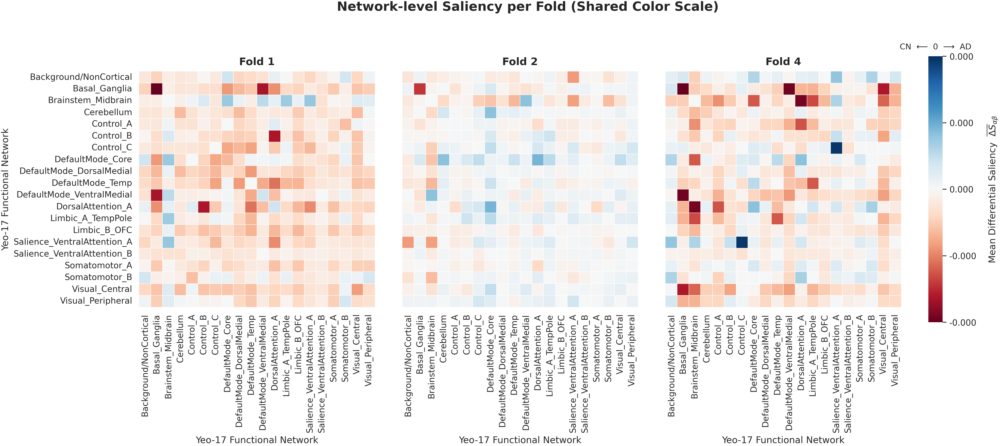

In [33]:
# === Small-multiples: Network-level Saliency per Fold (Shared Color Scale) ===
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
from pathlib import Path
import matplotlib.gridspec as gridspec

BASE_RUN_DIR = Path('./resultados_13_paper')
CLF = 'mlp'
SUFFIX = '_integrated_gradients_top50'
folds_to_plot = [1, 2, 4]   # elige los que quieras mostrar lado a lado

# 1) Construimos matrices por fold con el mismo orden de redes
all_mats, network_order = {}, None
for fold in folds_to_plot:
    edges = pd.read_csv(BASE_RUN_DIR / f'fold_{fold}' / f'interpretability_{CLF}' / f'ranking_conexiones_ANOTADO{SUFFIX}.csv')
    net_src, net_dst = 'src_Refined_Network', 'dst_Refined_Network'
    mat = edges.groupby([net_src, net_dst])['Saliency_Score'].mean().unstack(fill_value=0)
    mat = (mat + mat.T) / 2  # simetrizar
    if network_order is None:
        network_order = sorted(mat.columns)
    mat = mat.reindex(index=network_order, columns=network_order).fillna(0.0)
    all_mats[fold] = mat

# 2) Escala de color compartida (simétrica)
global_v = max(np.abs(m.values).max() for m in all_mats.values())
vmax = 0.9 * global_v          # satura un poco para contraste
vmin = -vmax

# 3) Layout: 3 heatmaps + 1 eje para colorbar
fig = plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(nrows=1, ncols=4, width_ratios=[1, 1, 1, 0.06], wspace=0.15)
axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
cax  = fig.add_subplot(gs[0, 3])

# 4) Plot
sns.set_theme(style="white", context="paper", font_scale=1.0)
for k, fold in enumerate(folds_to_plot):
    ax = axes[k]
    mat = all_mats[fold]
    hm = sns.heatmap(mat, ax=ax, cmap='RdBu', center=0, vmin=vmin, vmax=vmax,
                     square=True, cbar=(k==len(axes)-1), cbar_ax=cax,
                     linewidths=.4, linecolor='white', xticklabels=True, yticklabels=True)
    ax.set_title(f'Fold {fold}', fontsize=13, weight='bold', pad=8)
    
    # Ocultar etiquetas Y en las matrices del centro y derecha
    if k > 0:
        ax.set_yticklabels([])
        ax.set_ylabel('')
    # Formato de ticks X/Y
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    if k == 0:
        ax.set_ylabel('Yeo-17 Functional Network')
    ax.set_xlabel('Yeo-17 Functional Network')

# 5) Colorbar con valores y leyenda semántica
cb = hm.collections[0].colorbar
tick_vals = np.linspace(vmin, vmax, 5)
cb.set_ticks(tick_vals)
cb.set_ticklabels([f'{t:.3f}' for t in tick_vals])
cb.set_label(r'Mean Differential Saliency  $\overline{\Delta S}_{\alpha\beta}$', rotation=90, labelpad=12)
# Etiqueta semántica compacta
cax.text(0.5, 1.02, 'CN  ⟵  0  ⟶  AD', ha='center', va='bottom', fontsize=10, transform=cax.transAxes)

plt.suptitle('Network-level Saliency per Fold (Shared Color Scale)', fontsize=16, weight='bold', y=1.04)
plt.tight_layout()
plt.savefig('./Figures/fig_network_small_multiples_sharedscale.pdf', dpi=300, bbox_inches='tight')
plt.savefig('./Figures/fig_network_small_multiples_sharedscale.png', dpi=300, bbox_inches='tight')
plt.show()


Calculando d de Cohen para 8515 conexiones...


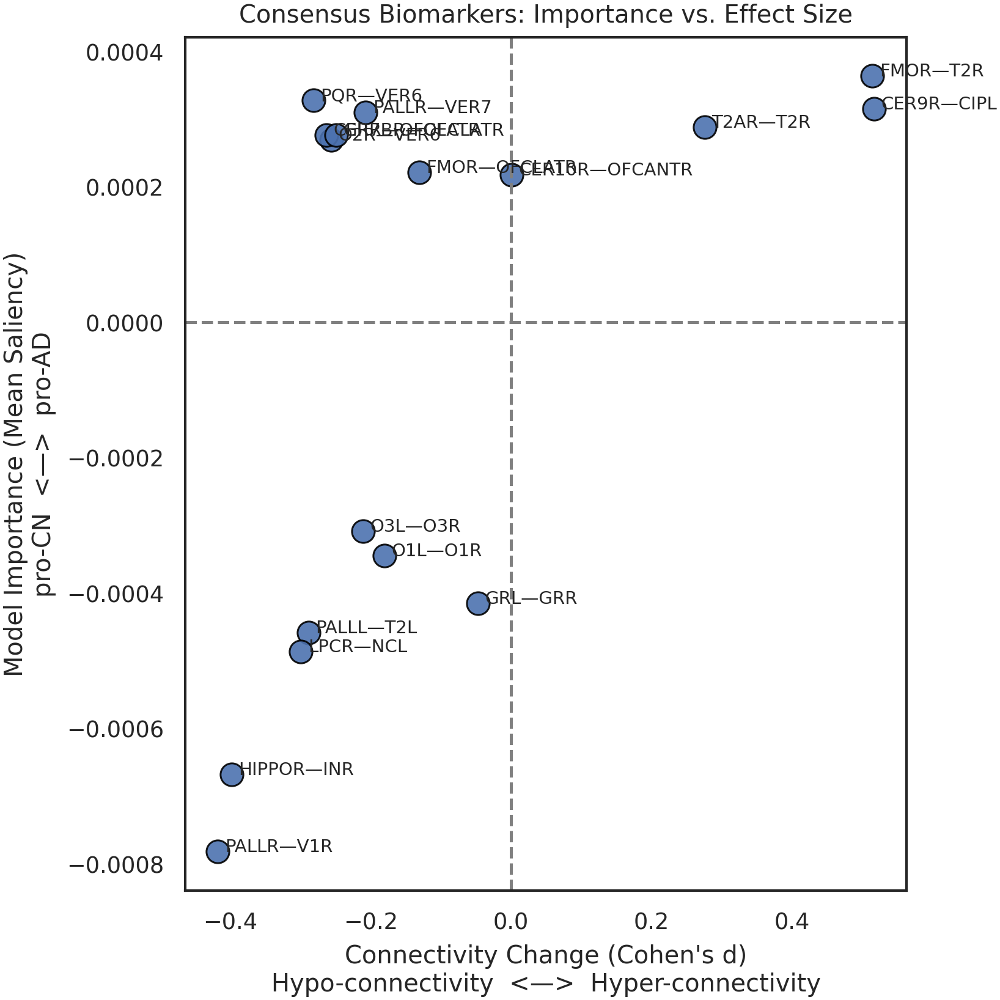

In [34]:
# ===================================================================
# CELDA FINAL (CORREGIDA): SALIENCIA VS. HIPO/HIPER-CONECTIVIDAD
# ===================================================================
from scipy.stats import spearmanr

# --- Rutas a los datos crudos (¡VERIFICA QUE SEAN CORRECTAS!) ---
GLOBAL_TENSOR_PATH = '/home/diego/Escritorio/limpio/AAL3_dynamicROIs_fmri_tensor_NeuroEnhanced_v6.5.17_AAL3_131ROIs_OMST_GCE_Signed_GrangerLag1_ChNorm_ROIreorderedYeo17_ParallelTuned/GLOBAL_TENSOR_from_AAL3_dynamicROIs_fmri_tensor_NeuroEnhanced_v6.5.17_AAL3_131ROIs_OMST_GCE_Signed_GrangerLag1_ChNorm_ROIreorderedYeo17_ParallelTuned.npz'
METADATA_PATH = '/home/diego/Escritorio/limpio/SubjectsData_AAL3_procesado2.csv'
CHANNELS_TO_USE = [1, 2, 5] 

def cohen_d(x, y):
    nx, ny = len(x), len(y)
    if nx < 2 or ny < 2: return 0.0
    dof = nx + ny - 2
    pooled_std = np.sqrt(((nx - 1) * np.var(x, ddof=1) + (ny - 1) * np.var(y, ddof=1)) / dof)
    return (np.mean(x) - np.mean(y)) / pooled_std if pooled_std > 1e-9 else 0.0

try:
    # --- Carga de datos crudos (pesado, hacer solo una vez si ya está en memoria) ---
    if 'tensor_all' not in locals():
        print("Cargando tensores y metadatos...")
        npz_data = np.load(GLOBAL_TENSOR_PATH)
        tensor_all = npz_data['global_tensor_data'][:, CHANNELS_TO_USE, :, :]
        subj_all_ids = pd.Series(npz_data['subject_ids'].astype(str), name='SubjectID')
        meta_df = pd.read_csv(METADATA_PATH, usecols=['SubjectID', 'ResearchGroup_Mapped'])
        meta_df['SubjectID'] = meta_df['SubjectID'].astype(str).str.strip()
        
        merged_df = pd.DataFrame({'SubjectID': subj_all_ids, 'tensor_idx': np.arange(len(subj_all_ids))})
        merged_df = merged_df.merge(meta_df, on='SubjectID', how='left')
        print("✅ Datos cargados.")

    # --- Calcular d de Cohen para cada conexión ---
    cohen_d_scores = []
    # Usamos la saliencia promediada entre folds
    df_mean_saliency = df_full.groupby('connection_id')['Saliency_Score'].mean()

    print(f"Calculando d de Cohen para {len(df_mean_saliency)} conexiones...")
    for conn_id in df_mean_saliency.index:
        # Tomar la primera fila que coincida para obtener los índices de los ROIs
        row = df_full[df_full['connection_id'] == conn_id].iloc[0]
        i, j = int(row['idx_i']), int(row['idx_j'])
        
        conn_vals = pd.Series(tensor_all[:, :, i, j].mean(axis=1), index=subj_all_ids)
        conn_df = conn_vals.to_frame('connectivity').merge(merged_df, on='SubjectID')
        
        ad_vals = conn_df[conn_df['ResearchGroup_Mapped'] == 'AD']['connectivity'].values
        cn_vals = conn_df[conn_df['ResearchGroup_Mapped'] == 'CN']['connectivity'].values
        
        d = cohen_d(ad_vals, cn_vals)
        cohen_d_scores.append({'connection_id': conn_id, 'cohen_d': d})
    
    df_cohen = pd.DataFrame(cohen_d_scores).set_index('connection_id')
    df_analysis = pd.concat([df_mean_saliency.rename('Saliency_Score'), df_cohen], axis=1)
    
    # --- Creación del Quadrant Plot (SOLO para el Consensus Set) ---
    fig, ax = plt.subplots(figsize=(5.5, 5.5), constrained_layout=True)
    df_plot_consensus = df_analysis.loc[consensus_set.index].copy()
    
    # Añadimos nombres para anotar en el gráfico
    df_plot_consensus['conn_str'] = ['—'.join(map(str, t)) for t in df_plot_consensus.index]
    
    sns.scatterplot(data=df_plot_consensus, x='cohen_d', y='Saliency_Score', 
                    s=80, edgecolor='black', alpha=0.9, ax=ax, legend=False)
    
    ax.axhline(0, color='grey', ls='--'); ax.axvline(0, color='grey', ls='--')
    ax.set_title('Consensus Biomarkers: Importance vs. Effect Size')
    ax.set_xlabel("Connectivity Change (Cohen's d)\nHypo-connectivity  <—>  Hyper-connectivity")
    ax.set_ylabel("Model Importance (Mean Saliency)\npro-CN  <—>  pro-AD")
    
    # Anotar puntos
    for _, row in df_plot_consensus.iterrows():
        ax.text(row['cohen_d'] + 0.01, row['Saliency_Score'], row['conn_str'], fontsize=7)

    savefig_nature(fig, FIG_DIR / 'fig_SI_quadrant_plot')
    plt.show()

except Exception as e:
    print(f"Omitiendo Quadrant Plot debido a un error: {e}")

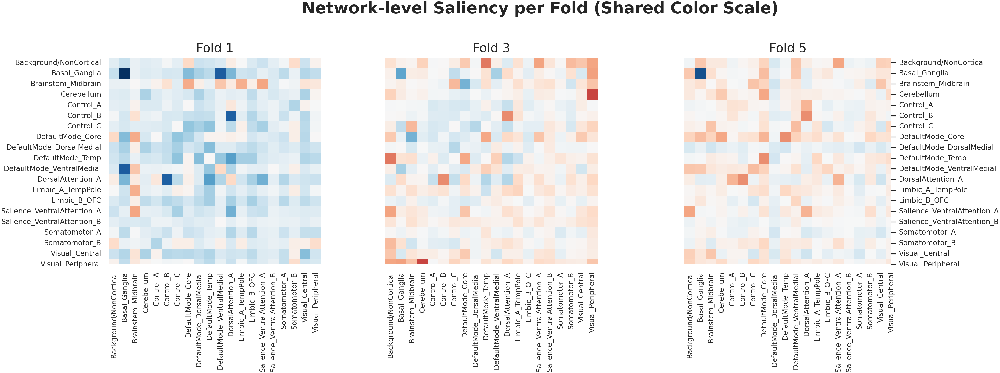

✅ Figura A (3 folds, más grande) guardada en: Figures_Nature/fig_A_network_small_multiples.pdf


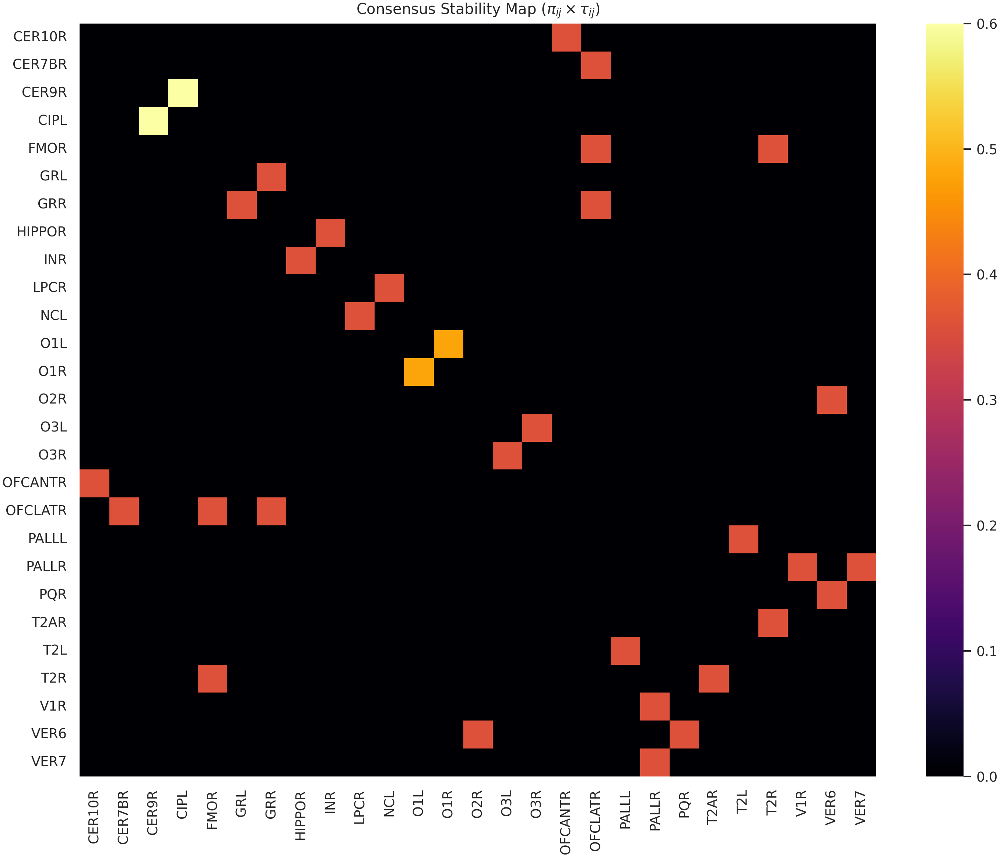

✅ Figura B guardada en: Figures_Nature/fig_B_stability_map.pdf


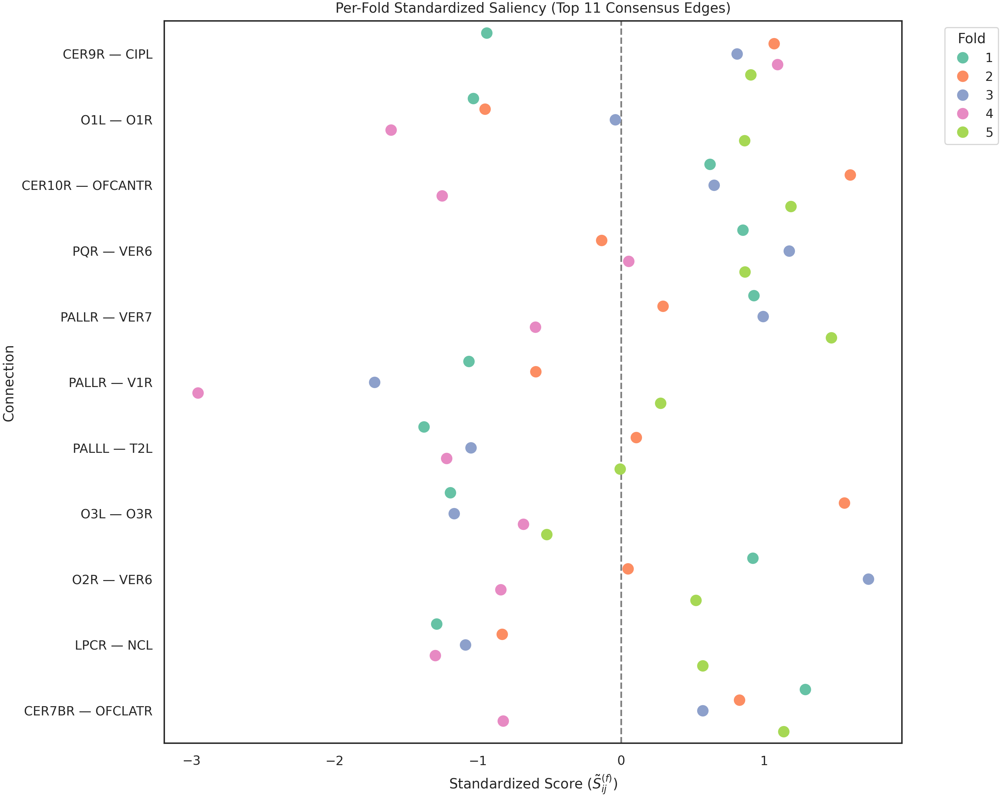

✅ Figura C guardada en: Figures_Nature/fig_C_dotplot_per_fold.pdf


In [35]:
# ===================================================================
# PASO 2 (CORREGIDO): Generar las 3 figuras principales para el paper
# ===================================================================

# --- Paleta de colores sugerida para el paper ---
# Puedes cambiarla por 'icefire', 'vlag', 'RdBu_r' si prefieres otras opciones
palette_choice = 'RdBu_r' 

# --- FIGURA A: Small-Multiples de Redes (Matrices más grandes y con mejor color) ---
folds_to_plot = [1, 3, 5]
all_net_matrices = {}
for fold in folds_to_plot:
    df_edges = all_fold_edges[fold]
    net_src_col = 'src_Refined_Network'
    net_dst_col = 'dst_Refined_Network'
    df_net_mean = df_edges.groupby([net_src_col, net_dst_col])['Saliency_Score'].mean().unstack(fill_value=0)
    symmetric_matrix = (df_net_mean + df_net_mean.T) / 2
    network_order = sorted(symmetric_matrix.columns)
    all_net_matrices[fold] = symmetric_matrix.loc[network_order, network_order]

global_vmax = max(mat.abs().values.max() for mat in all_net_matrices.values()) * 0.9

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True, 
                         gridspec_kw={'width_ratios': [1, 1, 1.15]})
fig.suptitle('Network-level Saliency per Fold (Shared Color Scale)', fontsize=18, weight='bold')

for i, fold in enumerate(folds_to_plot):
    matrix = all_net_matrices[fold]
    ax = axes[i]
    # Usamos la nueva paleta de colores
    sns.heatmap(matrix, ax=ax, cmap=palette_choice, center=0, 
                vmin=-global_vmax, vmax=global_vmax, 
                cbar=(i == len(folds_to_plot) - 1),
                cbar_ax=axes[-1] if i == len(folds_to_plot) - 1 else None,
                square=True)
    
    ax.set_title(f'Fold {fold}', fontsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(axis='x', labelsize=8)
    ax.tick_params(axis='y', labelsize=8)

plt.tight_layout(rect=[0, 0, 0.95, 0.95])
output_filename_A = FIG_OUTPUT_DIR / 'fig_A_network_small_multiples.pdf'
plt.savefig(output_filename_A, dpi=300, bbox_inches='tight')
plt.show()
print(f"✅ Figura A (3 folds, más grande) guardada en: {output_filename_A}")

# --- FIGURA B: Mapa de Estabilidad del Consenso (CORREGIDO y con mejor color) ---
consensus_rois = sorted(list(set(roi for conn_tuple in consensus_set.index for roi in conn_tuple)))
roi_to_idx = {name: i for i, name in enumerate(consensus_rois)}
stab_matrix = np.zeros((len(consensus_rois), len(consensus_rois)))

for conn_tuple, row in consensus_set.iterrows():
    if conn_tuple[0] in roi_to_idx and conn_tuple[1] in roi_to_idx:
        idx1 = roi_to_idx[conn_tuple[0]]
        idx2 = roi_to_idx[conn_tuple[1]]
        stab_matrix[idx1, idx2] = stab_matrix[idx2, idx1] = row['stability_score']

plt.figure(figsize=(10, 8))
# 'inferno' o 'magma' resaltan muy bien los valores altos sobre un fondo oscuro.
sns.heatmap(stab_matrix, cmap='inferno', xticklabels=consensus_rois, yticklabels=consensus_rois)
plt.title(r'Consensus Stability Map ($\pi_{ij} \times \tau_{ij}$)')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
output_filename_B = FIG_OUTPUT_DIR / 'fig_B_stability_map.pdf'
plt.savefig(output_filename_B, dpi=300, bbox_inches='tight')
plt.show()
print(f"✅ Figura B guardada en: {output_filename_B}")

# ===================================================================
# --- FIGURA C: Dotplot Per-Fold (VERSIÓN FINAL DEFINITIVA y con mejor color) ---
# ===================================================================

# ===================================================================
# --- FIGURA C: Dotplot Per-Fold (VERSIÓN FINAL A PRUEBA DE ERRORES) ---
# ===================================================================

N_DOTPLOT = 11 # Usando las 11 aristas que encontraste
dotplot_edges = consensus_set.head(N_DOTPLOT)
dotplot_data = []

# --- LA SOLUCIÓN ---
# Convertimos el índice a una columna para una búsqueda segura.
df_lookup = df_all_scores.reset_index()

for edge_tuple in dotplot_edges.index:
    edge_name = f"{edge_tuple[0]} — {edge_tuple[1]}"
    for fold in range(1, N_FOLDS + 1):
        fold_col = f'saliency_fold_{fold}'
        top_k_median = (
            all_fold_edges[fold]
            .nsmallest(TOP_K, 'Rank')['Saliency_Score'].abs().median()
        )

        #top_k_median = all_fold_edges[fold].head(TOP_K)['Saliency_Score'].abs().median()

        # Usamos filtrado booleano, que es el método más seguro
        matching_rows = df_lookup[df_lookup['connection_id'] == edge_tuple]
        
        if matching_rows.empty:
            saliency = 0
        else:
            # Tomamos el valor de la fila encontrada
            saliency = matching_rows[fold_col].iloc[0]
            
        standardized_saliency = saliency / top_k_median if top_k_median > 0 else 0
        dotplot_data.append({'connection': edge_name, 'fold': fold, 'score': standardized_saliency})

df_dotplot = pd.DataFrame(dotplot_data)

# --- Plotting ---
plt.figure(figsize=(10, 8))
y_order = dotplot_edges.index.map(lambda x: f"{x[0]} — {x[1]}")
sns.stripplot(data=df_dotplot, y='connection', x='score', hue='fold', palette='Set2', 
              jitter=False, dodge=True, size=8, order=y_order)

plt.axvline(0, ls='--', color='grey')
plt.title(f'Per-Fold Standardized Saliency (Top {N_DOTPLOT} Consensus Edges)')
plt.xlabel(r'Standardized Score ($\tilde S^{(f)}_{ij}$)')
plt.ylabel('Connection')
plt.legend(title='Fold', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

output_filename_C = FIG_OUTPUT_DIR / 'fig_C_dotplot_per_fold.pdf'
plt.savefig(output_filename_C, dpi=300, bbox_inches='tight')
plt.show()

print(f"✅ Figura C guardada en: {output_filename_C}")

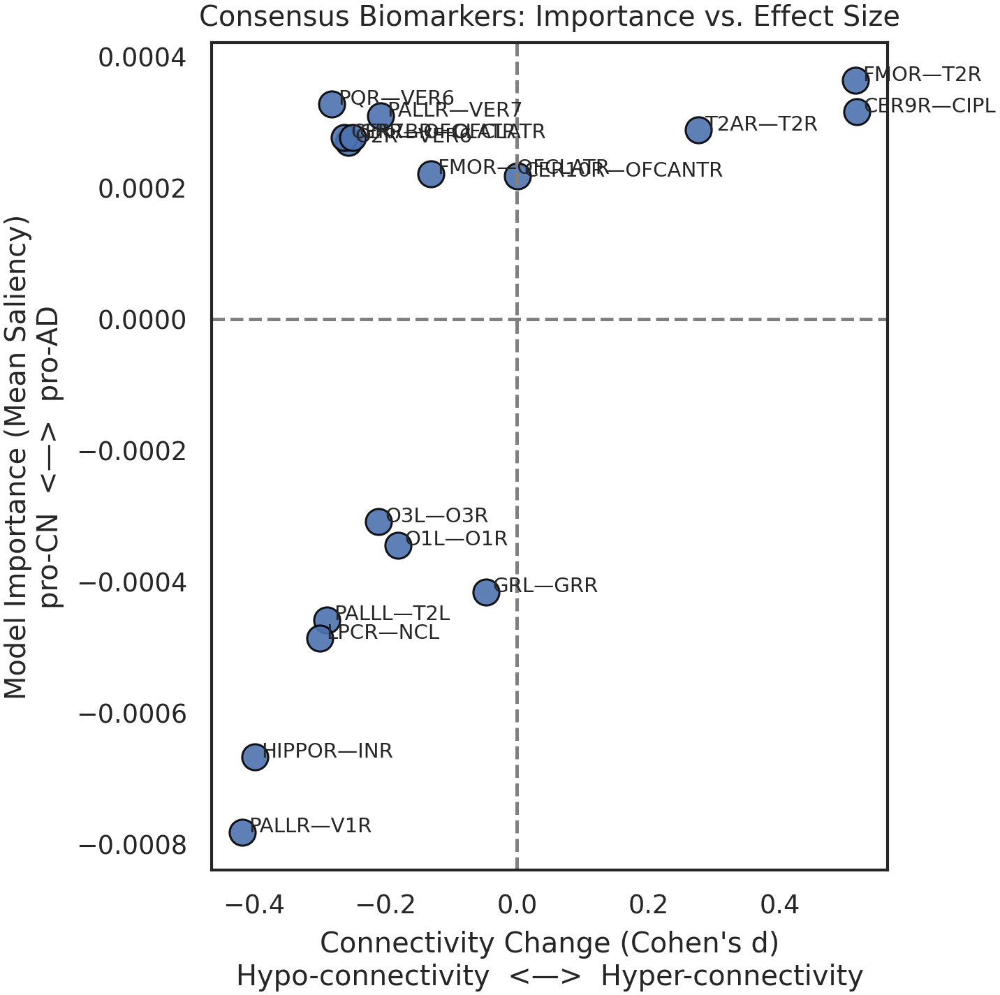

In [36]:
# ===================================================================
# CELDA FINAL (PARA SI): SALIENCIA VS. HIPO/HIPER-CONECTIVIDAD
# ===================================================================
from scipy.stats import spearmanr

# --- Rutas a los datos crudos (¡VERIFICA QUE SEAN CORRECTAS!) ---
GLOBAL_TENSOR_PATH = '/home/diego/Escritorio/limpio/AAL3_dynamicROIs_fmri_tensor_NeuroEnhanced_v6.5.17_AAL3_131ROIs_OMST_GCE_Signed_GrangerLag1_ChNorm_ROIreorderedYeo17_ParallelTuned/GLOBAL_TENSOR_from_AAL3_dynamicROIs_fmri_tensor_NeuroEnhanced_v6.5.17_AAL3_131ROIs_OMST_GCE_Signed_GrangerLag1_ChNorm_ROIreorderedYeo17_ParallelTuned.npz'
METADATA_PATH = '/home/diego/Escritorio/limpio/SubjectsData_AAL3_procesado2.csv'
CHANNELS_TO_USE = [1, 2, 5] 

def cohen_d(x, y):
    nx, ny = len(x), len(y)
    if nx < 2 or ny < 2: return 0.0
    dof = nx + ny - 2
    pooled_std = np.sqrt(((nx - 1) * np.var(x, ddof=1) + (ny - 1) * np.var(y, ddof=1)) / dof)
    return (np.mean(x) - np.mean(y)) / pooled_std if pooled_std > 1e-6 else 0.0

try:
    # --- Carga de datos crudos (pesado, hacer solo una vez) ---
    npz_data = np.load(GLOBAL_TENSOR_PATH)
    tensor_all = npz_data['global_tensor_data'][:, CHANNELS_TO_USE, :, :] # Filtramos canales aquí
    subj_all_ids = pd.Series(npz_data['subject_ids'].astype(str), name='SubjectID')
    meta_df = pd.read_csv(METADATA_PATH, usecols=['SubjectID', 'ResearchGroup_Mapped'])
    meta_df['SubjectID'] = meta_df['SubjectID'].astype(str).str.strip()
    
    merged_df = pd.DataFrame({'SubjectID': subj_all_ids, 'tensor_idx': np.arange(len(subj_all_ids))})
    merged_df = merged_df.merge(meta_df, on='SubjectID', how='left')

    # --- Calcular d de Cohen promediado sobre los folds ---
    cohen_d_scores = []
    df_mean_saliency = df_full.groupby('connection_id')['Saliency_Score'].mean()

    for conn_id in df_mean_saliency.index:
        row = df_full[df_full['connection_id'] == conn_id].iloc[0]
        i, j = int(row['idx_i']), int(row['idx_j'])
        
        # Obtenemos los valores de conectividad cruda promediados sobre canales
        conn_vals = pd.Series(tensor_all[:, :, i, j].mean(axis=1), index=subj_all_ids)
        conn_df = conn_vals.to_frame('connectivity').merge(merged_df, on='SubjectID')
        
        ad_vals = conn_df[conn_df['ResearchGroup_Mapped'] == 'AD']['connectivity'].values
        cn_vals = conn_df[conn_df['ResearchGroup_Mapped'] == 'CN']['connectivity'].values
        
        d = cohen_d(ad_vals, cn_vals)
        cohen_d_scores.append({'connection_id': conn_id, 'cohen_d': d})
    
    df_cohen = pd.DataFrame(cohen_d_scores).set_index('connection_id')
    df_analysis = pd.concat([df_mean_saliency, df_cohen], axis=1)

    # --- Creación del Quadrant Plot ---
    fig, ax = plt.subplots(figsize=(5, 5))
    df_plot_consensus = df_analysis.loc[consensus_set.index]
    
    sns.scatterplot(data=df_plot_consensus, x='cohen_d', y='Saliency_Score', 
                    s=80, edgecolor='black', alpha=0.9, ax=ax, legend=False)
    
    ax.axhline(0, color='grey', ls='--'); ax.axvline(0, color='grey', ls='--')
    ax.set_title('Consensus Biomarkers: Importance vs. Effect Size')
    ax.set_xlabel("Connectivity Change (Cohen's d)\nHypo-connectivity  <—>  Hyper-connectivity")
    ax.set_ylabel("Model Importance (Mean Saliency)\npro-CN  <—>  pro-AD")
    
    # Anotar puntos
    for idx, row in df_plot_consensus.iterrows():
        ax.text(row['cohen_d'] + 0.01, row['Saliency_Score'], f"{idx[0]}—{idx[1]}", fontsize=7)

    fig.tight_layout()
    savefig_nature(fig, FIG_DIR / 'fig_SI_quadrant_plot')
    plt.show()

except Exception as e:
    print(f"Omitiendo Quadrant Plot debido a un error: {e}")

In [37]:
from sklearn.utils import check_random_state
from statsmodels.stats.multitest import multipletests

def perm_pvals_edgewise(df_subj_ig, group, strata, B=2000, seed=7):
    # df_subj_ig: DataFrame [n_subj x n_edges] con |IG_ij| por sujeto
    # group: Series (AD/CN); strata: DataFrame con Manufacturer, Sex
    rng = check_random_state(seed)
    real = df_subj_ig[group=='AD'].mean() - df_subj_ig[group=='CN'].mean()
    real = real.abs()
    counts = np.zeros_like(real, dtype=int)
    # preconstruir índices por estrato
    keys = list(zip(strata['Manufacturer'], strata['Sex']))
    uniq = sorted(set(keys))
    idx_by = {u: np.where([k==u for k in keys])[0] for u in uniq}
    y = group.values.copy()
    for b in range(B):
        y_perm = y.copy()
        for u, idx in idx_by.items():
            rng.shuffle(y_perm[idx])
        perm = df_subj_ig[y_perm=='AD'].mean() - df_subj_ig[y_perm=='CN'].mean()
        counts += (np.abs(perm) >= real).astype(int)
    p = (counts + 1) / (B + 1)
    q = multipletests(p, method='fdr_bh')[1]
    out = pd.DataFrame({'abs_deltaS': real.values, 'p': p, 'q': q}, index=df_subj_ig.columns)
    return out.sort_values('q')


In [38]:
def edge_inclusion_probability(df_rank_by_fold, K=200, B=1000, seed=13):
    rng = np.random.default_rng(seed)
    edges = sorted(set.union(*[set(df.head(K).index) for df in df_rank_by_fold.values()]))
    e2i = {e:i for i,e in enumerate(edges)}
    cnt = np.zeros(len(edges), dtype=int)
    for _ in range(B):
        for f, df in df_rank_by_fold.items():
            # re-muestra sujetos (suponiendo que guardaste IG por sujeto) y recomputa ranking...
            pass
        # incrementa cnt[e2i[edge]] si edge entra en top-K del bootstrap-meta
    return pd.Series(cnt/B, index=edges, name='EIP')


In [39]:
midline_tokens = {'VER','VPL','PAG','NCR','tVPL','VER7','VER8','VER9'}  # adapta a tus etiquetas
def hemi_of(roi):
    if roi.endswith('R'): return 'R'
    if roi.endswith('L'): return 'L'
    base = ''.join([c for c in roi if not c.isdigit()])
    return 'M' if any(t in base for t in midline_tokens) else 'U'

df_full['hemi_src'] = df_full['src_AAL3_Name'].map(hemi_of)
df_full['hemi_dst'] = df_full['dst_AAL3_Name'].map(hemi_of)
df_lat_clean = df_full.query("hemi_src != 'M' and hemi_dst != 'M'")


In [40]:
# ===================================================================
# CELDA 3 (UNIFICADA): ANÁLISIS DE ESTABILIDAD Y LATERALIDAD
# ===================================================================
from collections import Counter
from scipy.stats import t

# --- 1. ESTABILIDAD: Cálculo de π (frecuencia) y τ (consistencia de signo) ---
TOP_K_STABILITY = 200
n_folds = df_full['fold'].nunique()

top_sets = df_full[df_full["Rank"] <= TOP_K_STABILITY].groupby("fold")["connection_id"].apply(set)
pi = pd.Series(Counter(e for s in top_sets for e in s)).div(n_folds)
pi.name = "pi"

sign = np.sign(df_full.set_index(["connection_id", "fold"])["Saliency_Score"]).unstack()
tau = sign.mean(axis=1).abs()
tau.name = "tau"

df_stability = pd.concat([pi, tau], axis=1).fillna({"pi": 0.0})
df_stability["score"] = df_stability["pi"] * df_stability["tau"]

# --- 2. CONSENSUS SET: Filtrado por umbrales estrictos ---
CONS_PI, CONS_TAU = 0.6, 0.6
consensus_set = df_stability.query("pi >= @CONS_PI and tau >= @CONS_TAU").sort_values("score", ascending=False)
print(f"🔎 Consensus Set: {len(consensus_set)} aristas (π ≥ {CONS_PI}, τ ≥ {CONS_TAU})")
display(consensus_set.head(10))


# --- 3. LATERALIDAD: Preparación de datos para la figura ---
midline_tokens = {'VER','VPL','PAG','NCR','tVPL','VER7','VER8','VER9'}

def hemi_of(roi: str) -> str:
    if not isinstance(roi, str): return 'U'
    if roi.endswith('R'): return 'R'
    if roi.endswith('L'): return 'L'
    base = ''.join([c for c in roi if not c.isdigit()])
    return 'M' if any(t in base for t in midline_tokens) else 'U'

df_full['hemi_src'] = df_full['src_AAL3_Name'].map(hemi_of)
df_full['hemi_dst'] = df_full['dst_AAL3_Name'].map(hemi_of)
df_lat_clean = df_full.query("hemi_src in ['L','R'] and hemi_dst in ['L','R']").copy()
print(f"\n✅ Conexiones de línea media filtradas para análisis de lateralidad: {len(df_lat_clean)} restantes.")

def p_rr_by_fold(df: pd.DataFrame, K: int) -> pd.DataFrame:
    df_intra = df[df['hemi_src'] == df['hemi_dst']]
    top = df_intra[df_intra["Rank"] <= K]
    out = []
    for f, g in top.groupby("fold", observed=True):
        rr = (g["hemi_src"] == "R").sum()
        ll = (g["hemi_src"] == "L").sum()
        n  = rr + ll
        out.append({"fold": int(f), "TopK": K, "p_RR": (rr / n) if n > 0 else np.nan})
    return pd.DataFrame(out)

df_lat_plot = pd.concat(
    [p_rr_by_fold(df_lat_clean, K) for K in (50, 100, 200)], 
    ignore_index=True
)
print("✅ DataFrame 'df_lat_plot' para figura de lateralidad creado exitosamente.")

🔎 Consensus Set: 17 aristas (π ≥ 0.6, τ ≥ 0.6)


,,pi,tau,score
CER9R,CIPL,1.0,0.6,0.60
O1L,O1R,0.8,0.6,0.48
PALLR,V1R,0.6,0.6,0.36
FMOR,T2R,0.6,0.6,0.36
CER10R,OFCANTR,0.6,0.6,0.36
T2AR,T2R,0.6,0.6,0.36
PQR,VER6,0.6,0.6,0.36
O2R,VER6,0.6,0.6,0.36
CER7BR,OFCLATR,0.6,0.6,0.36
HIPPOR,INR,0.6,0.6,0.36



✅ Conexiones de línea media filtradas para análisis de lateralidad: 38130 restantes.
✅ DataFrame 'df_lat_plot' para figura de lateralidad creado exitosamente.


In [41]:
# ===================================================================
# CELDA 0 — ESTILO "JOURNAL-READY" + HELPERS
# ===================================================================
from pathlib import Path
import os, sys, random, warnings
import pandas as pd, numpy as np
import matplotlib as mpl, matplotlib.pyplot as plt
import seaborn as sns
warnings.filterwarnings("ignore", category=FutureWarning)

try:
    import torch
except Exception:
    torch = None

# Reproducibilidad
SEED = 42
random.seed(SEED); np.random.seed(SEED)
if torch is not None:
    try:
        torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
    except Exception:
        pass

# Estilo "Nature/Neuron-friendly"
sns.set_theme(style="white", context="paper")
mpl.rcParams.update({
    "pdf.fonttype": 42, "ps.fonttype": 42,       # TrueType embebido
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "DejaVu Sans"],
    "font.size": 9, "axes.titlesize": 10, "axes.labelsize": 9,
    "xtick.labelsize": 8, "ytick.labelsize": 8, "legend.fontsize": 8,
    "axes.spines.top": False, "axes.spines.right": False,
    "axes.linewidth": 0.8, "xtick.major.width": 0.8, "ytick.major.width": 0.8,
    "xtick.direction": "out", "ytick.direction": "out",
    "figure.dpi": 300, "savefig.pad_inches": 0.02,
})

# Rutas base
BASE_RUN_DIR   = Path("./resultados_13_paper")
CLF            = "mlp"
SUFFIX         = "_integrated_gradients_top50"
N_FOLDS        = 5
FIG_DIR   = Path("./Figures_Nature"); FIG_DIR.mkdir(exist_ok=True, parents=True)
TBL_DIR   = Path("./Tables_Nature");  TBL_DIR.mkdir(exist_ok=True, parents=True)

def savefig_nature(fig, path_no_ext: Path):
    path_no_ext = Path(path_no_ext)
    fig.savefig(f"{path_no_ext}.pdf", bbox_inches="tight",
                metadata={"Creator": "Matplotlib", "Title": path_no_ext.name})
    fig.savefig(f"{path_no_ext}.png", bbox_inches="tight", dpi=600,
                metadata={"Creator": "Matplotlib"})

def annotate_bars(ax, fmt="{:.2f}", dy=0.01):
    for p in ax.patches:
        if p.get_height() == 0: continue
        ax.text(p.get_x()+p.get_width()/2, p.get_height()+dy,
                fmt.format(p.get_height()), ha="center", va="bottom")

def maybe_annot_heatmap_values(ax, mat, max_side=10, fmt="{:.2f}"):
    # Solo anota si la matriz es pequeña para no saturar
    if mat.shape[0] <= max_side and mat.shape[1] <= max_side:
        for i in range(mat.shape[0]):
            for j in range(mat.shape[1]):
                val = mat.iloc[i, j]
                ax.text(j+0.5, i+0.5, fmt.format(val),
                        ha="center", va="center", fontsize=7, color="black")
                # Nota: depende del colormap si conviene texto blanco/negro
    return ax

print("✅ Estilo aplicado y helpers listos.")


✅ Estilo aplicado y helpers listos.


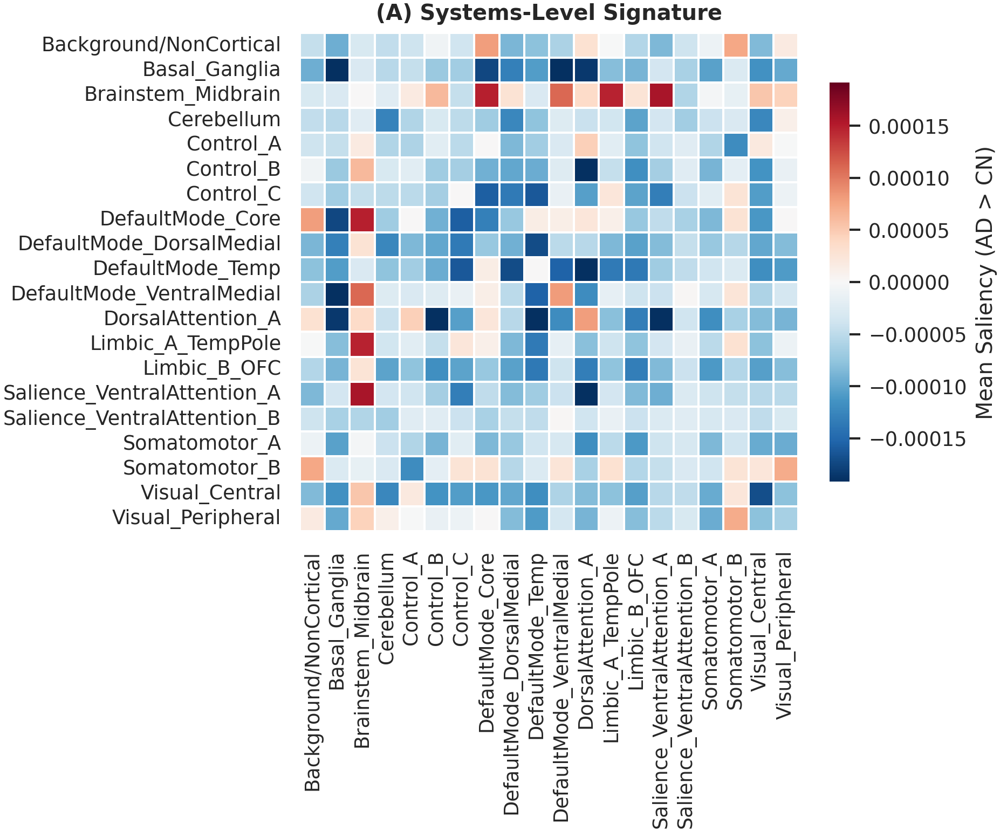

✅ Figura del Panel A guardada en: Figures/figure_A_systems_signature.svg


In [50]:
# ===================================================================
# CELDA PARA FIGURA A: Systems-Level Signature (Fold 1)
# ===================================================================

# --- Configuración ---
FOLD_TO_SHOW = 1 # Fold representativo
FIG_A_NAME = "figure_A_systems_signature"

# --- Preparación de Datos ---
df_fold_a = df_full[df_full["fold"] == FOLD_TO_SHOW].copy()
net_src_col = "src_Refined_Network" if "src_Refined_Network" in df_fold_a.columns else "src_Yeo17_Network"
net_dst_col = "dst_Refined_Network" if "dst_Refined_Network" in df_fold_a.columns else "dst_Yeo17_Network"

mat_A = df_fold_a.groupby([net_src_col, net_dst_col])["Saliency_Score"].mean().unstack(fill_value=0)
mat_A = (mat_A + mat_A.T) / 2 # Simetrizar
network_order = sorted(mat_A.columns)
mat_A = mat_A.reindex(index=network_order, columns=network_order).fillna(0.0)

# --- Generación del Gráfico ---
fig_A, ax_A = plt.subplots(figsize=(5, 4))

# Usamos un valor máximo robusto para la escala de color
vmax_A = np.percentile(np.abs(mat_A.values), 98)

sns.heatmap(mat_A, cmap="RdBu_r", center=0, vmin=-vmax_A, vmax=vmax_A, square=True,
            cbar_kws={'label': 'Mean Saliency (AD > CN)', 'shrink': 0.8},
            ax=ax_A, linewidths=.5, linecolor='white')

ax_A.set_title("(A) Systems-Level Signature", weight="bold")
ax_A.set_xlabel("")
ax_A.set_ylabel("")
ax_A.tick_params(axis='x', rotation=90)
ax_A.tick_params(axis='y', rotation=0)

# --- Guardado en SVG ---
output_path_A = FIG_DIR / f"{FIG_A_NAME}.svg"
fig_A.savefig(output_path_A, format='svg', bbox_inches="tight")
plt.show()

print(f"✅ Figura del Panel A guardada en: {output_path_A}")

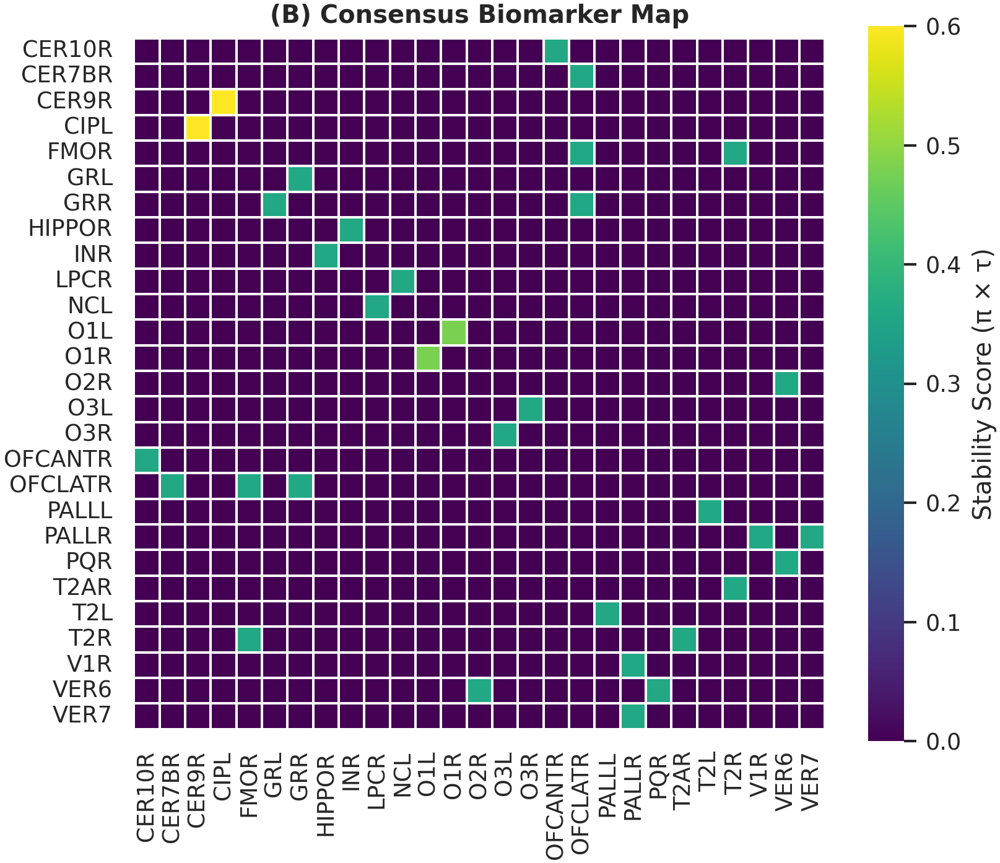

✅ Figura del Panel B guardada en: Figures/figure_B_consensus_map.svg


In [51]:
# ===================================================================
# CELDA PARA FIGURA B: Consensus Biomarker Map
# ===================================================================

# --- Configuración ---
FIG_B_NAME = "figure_B_consensus_map"

# --- Preparación de Datos ---
# Asegúrate de que 'consensus_set' ya ha sido calculado
rois_B = sorted(list(set(roi for conn_tuple in consensus_set.index for roi in conn_tuple)))
mat_B = pd.DataFrame(0.0, index=rois_B, columns=rois_B)
for (src, dst), row in consensus_set.iterrows():
    mat_B.loc[src, dst] = mat_B.loc[dst, src] = row['score']

# --- Generación del Gráfico ---
fig_B, ax_B = plt.subplots(figsize=(6, 5))

sns.heatmap(mat_B, cmap="viridis", square=True,
            cbar_kws={'label': 'Stability Score (π × τ)'},
            ax=ax_B, linewidths=.5, linecolor='white')

ax_B.set_title("(B) Consensus Biomarker Map", weight="bold")
ax_B.set_xlabel("")
ax_B.set_ylabel("")
ax_B.tick_params(axis='x', rotation=90)
ax_B.tick_params(axis='y', rotation=0)

# --- Guardado en SVG ---
output_path_B = FIG_DIR / f"{FIG_B_NAME}.svg"
fig_B.savefig(output_path_B, format='svg', bbox_inches="tight")
plt.show()

print(f"✅ Figura del Panel B guardada en: {output_path_B}")

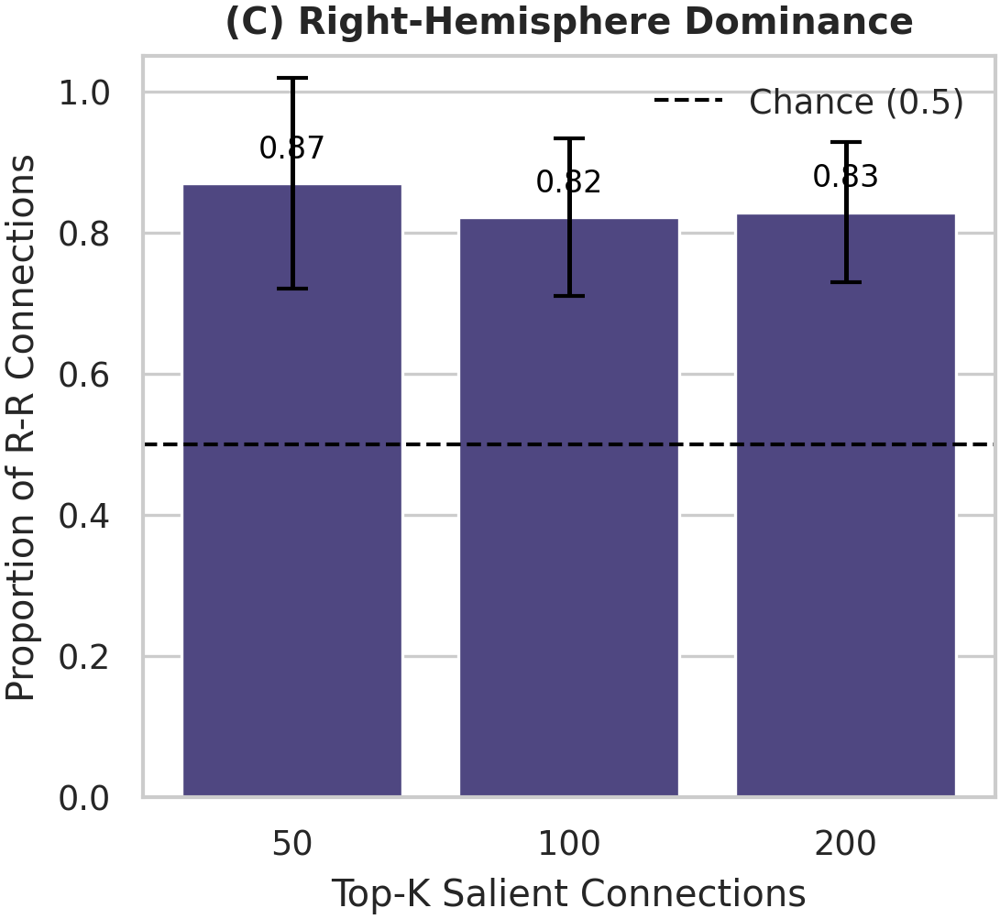

✅ Figura del Panel C guardada en: Figures/figure_C_hemisphere_dominance.svg


In [52]:
# ===================================================================
# CELDA PARA FIGURA C: Right-Hemisphere Dominance
# ===================================================================
from scipy.stats import t

# --- Configuración ---
FIG_C_NAME = "figure_C_hemisphere_dominance"

# --- Preparación de Datos ---
# Asegúrate de que 'df_lat_plot' ya ha sido calculado
agg_C = df_lat_plot.groupby("TopK")["p_RR"].agg(["mean", "count", "std"]).reset_index()
agg_C["sem"] = agg_C["std"] / np.sqrt(agg_C["count"])
agg_C["ci"]  = t.ppf(0.975, df=agg_C["count"] - 1) * agg_C["sem"]

# --- Generación del Gráfico ---
fig_C, ax_C = plt.subplots(figsize=(4, 3.5))

sns.barplot(data=agg_C, x="TopK", y="mean", color="darkslateblue", ax=ax_C)
ax_C.errorbar(agg_C["TopK"].astype(str), agg_C["mean"], yerr=agg_C["ci"], fmt="none", capsize=4, ecolor="black")

ax_C.axhline(0.5, ls="--", c="black", lw=1, label="Chance (0.5)")
ax_C.set_ylim(0, 1.05)
ax_C.set_xlabel("Top-K Salient Connections")
ax_C.set_ylabel("Proportion of R-R Connections")
ax_C.set_title("(C) Right-Hemisphere Dominance", weight="bold")
ax_C.legend(frameon=False)

# Anotar los valores medios en las barras para mayor claridad
for p in ax_C.patches:
    ax_C.annotate(f"{p.get_height():.2f}",
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center',
                   xytext=(0, 9),
                   textcoords='offset points',
                   fontsize=8, color='black')

# --- Guardado en SVG ---
output_path_C = FIG_DIR / f"{FIG_C_NAME}.svg"
fig_C.savefig(output_path_C, format='svg', bbox_inches="tight")
plt.show()

print(f"✅ Figura del Panel C guardada en: {output_path_C}")

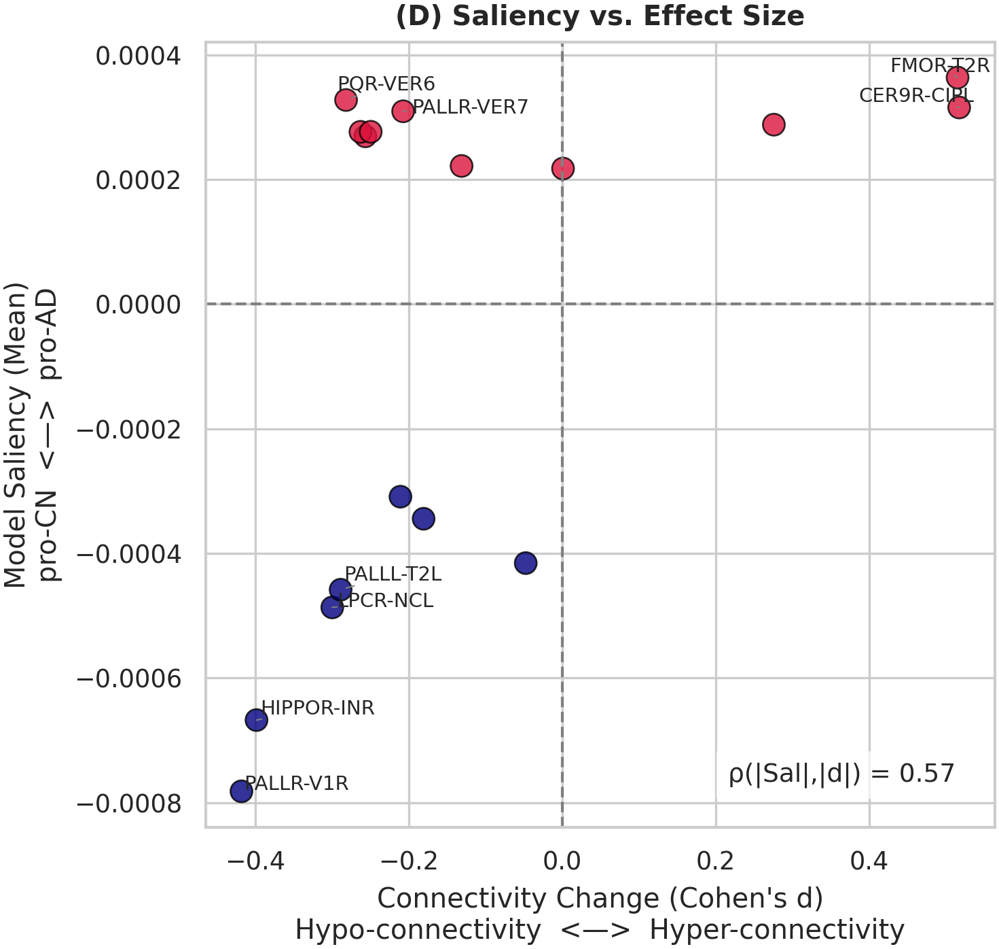

✅ Figura del Panel D guardada en: Figures/figure_D_saliency_vs_effect.svg


In [53]:
# ===================================================================
# CELDA PARA FIGURA D: Saliency vs. Effect Size
# ===================================================================
from scipy.stats import spearmanr
try:
    from adjustText import adjust_text
    ADJUST_TEXT_AVAILABLE = True
except ImportError:
    ADJUST_TEXT_AVAILABLE = False
    def adjust_text(texts, **kwargs): pass # Dummy function

# --- Configuración ---
FIG_D_NAME = "figure_D_saliency_vs_effect"

# --- Preparación de Datos ---
# Asegúrate de que 'df_full' y 'df_cohen' ya han sido calculados
df_mean_sal = df_full.groupby("connection_id")["Saliency_Score"].mean()
if 'df_cohen' in locals():
    df_qc = pd.concat([df_mean_sal.rename("sal"), df_cohen], axis=1).dropna().loc[consensus_set.index]
    rho, pval = spearmanr(df_qc["sal"].abs(), df_qc["cohen_d"].abs())
else:
    df_qc = pd.DataFrame() # Prevenir error si no se calculó df_cohen

# --- Generación del Gráfico ---
fig_D, ax_D = plt.subplots(figsize=(5, 5))

if not df_qc.empty:
    sns.scatterplot(data=df_qc, x="cohen_d", y="sal", s=60, edgecolor="black", alpha=0.8, ax=ax_D,
                    hue=(df_qc['sal'] > 0), palette={True:'crimson', False:'navy'}, legend=False)

    ax_D.axhline(0, c="grey", ls="--", lw=1)
    ax_D.axvline(0, c="grey", ls="--", lw=1)
    ax_D.set_title("(D) Saliency vs. Effect Size", weight="bold")
    ax_D.set_xlabel("Connectivity Change (Cohen's d)\nHypo-connectivity  <—>  Hyper-connectivity")
    ax_D.set_ylabel("Model Saliency (Mean)\npro-CN  <—>  pro-AD")
    
    # Anotación de la correlación
    ax_D.text(0.95, 0.05, f'ρ(|Sal|,|d|) = {rho:.2f}', transform=ax_D.transAxes,
              ha='right', va='bottom', fontsize=9,
              bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

    # Anotación de las conexiones más extremas
    points_to_label = pd.concat([df_qc.nlargest(4, 'sal'), df_qc.nsmallest(4, 'sal')])
    texts = []
    for idx, r in points_to_label.iterrows():
        texts.append(ax_D.text(r["cohen_d"], r["sal"], f"{idx[0]}-{idx[1]}", fontsize=7))
    
    if ADJUST_TEXT_AVAILABLE:
        adjust_text(texts, ax=ax_D, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))
else:
    ax_D.text(0.5, 0.5, "Cohen's d data not available", ha='center', va='center', style='italic', color='grey')
    ax_D.set_xticks([]); ax_D.set_yticks([])

# --- Guardado en SVG ---
output_path_D = FIG_DIR / f"{FIG_D_NAME}.svg"
fig_D.savefig(output_path_D, format='svg', bbox_inches="tight")
plt.show()

print(f"✅ Figura del Panel D guardada en: {output_path_D}")

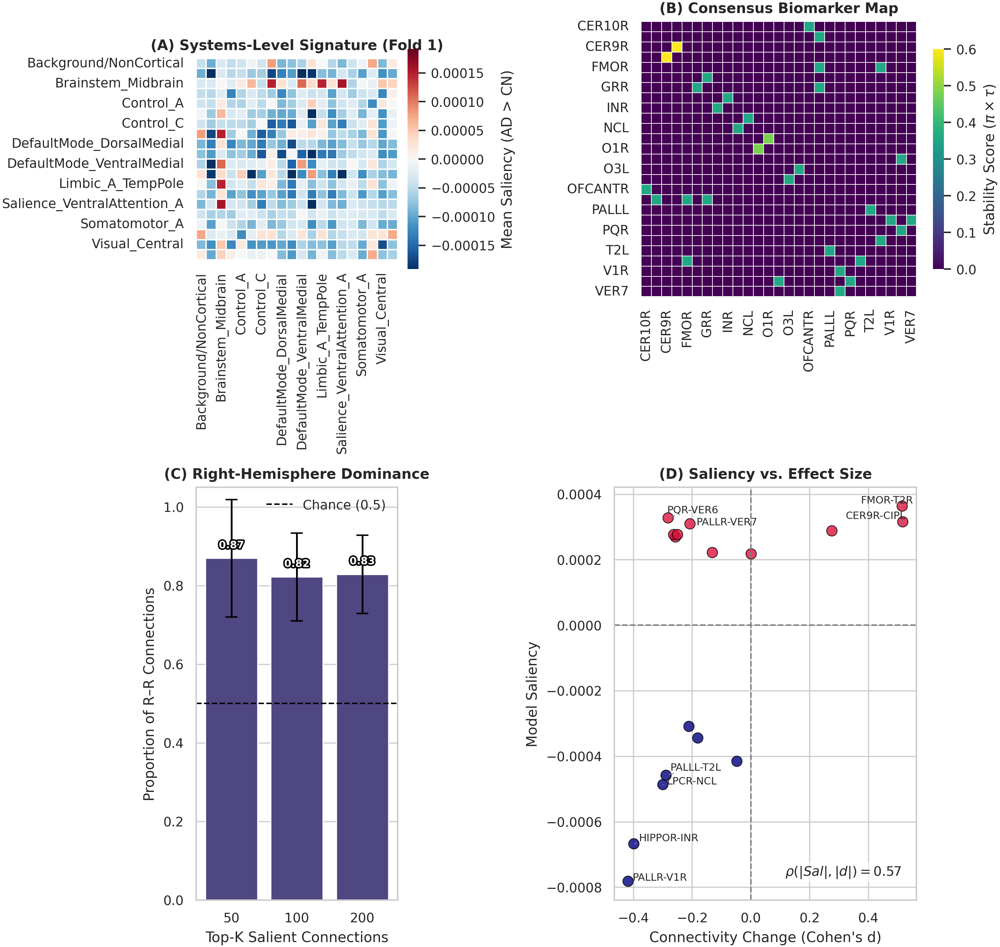

✅ Figura Q1 guardada en: Figures_Nature/figure_main_AD_signature.pdf y .png


In [47]:
# ===================================================================
# --- CELDA MAESTRA: FIGURA FINAL PARA PUBLICACIÓN (4 PANELES) ---
# ===================================================================
from pathlib import Path
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns, matplotlib.gridspec as gridspec
# LÍNEA AÑADIDA: Importar el módulo patheffects
import matplotlib.patheffects as PathEffects
from collections import Counter
from scipy.stats import t, spearmanr
# Opcional pero recomendado para etiquetas que no se solapen en el Quadrant Plot
try:
    from adjustText import adjust_text
    ADJUST_TEXT_AVAILABLE = True
except ImportError:
    print("⚠️ adjustText no instalado. Las etiquetas del plot pueden solaparse. Instalar con: pip install adjusttext")
    ADJUST_TEXT_AVAILABLE = False
    def adjust_text(texts, **kwargs): pass

# --- Función de ayuda para anotaciones de alta calidad (CORREGIDA) ---
def annotate_bars(ax, fmt="{:.2f}", dy=0.0, fontsize=7, color="white", weight="bold", **text_kwargs):
    """
    Etiqueta cada barra en 'ax'. 'dy' es el desplazamiento vertical en unidades de datos.
    - fmt: formato del número mostrado.
    - dy: offset vertical (si la barra es negativa, el offset se invierte).
    Podés pasar kwargs extra de texto (excepto 'dy').
    """
    # Path effects por defecto para contraste (borde negro)
    pe = text_kwargs.pop("path_effects", [PathEffects.withStroke(linewidth=2, foreground="black")])

    for bar in ax.patches:
        # Ignora artistas que no sean rectángulos de barra
        try:
            h = bar.get_height()
            x = bar.get_x() + bar.get_width() / 2.0
        except Exception:
            continue

        # Posición del texto (arriba si h>=0, abajo si h<0)
        y = h + (dy if h >= 0 else -dy)
        va = "bottom" if h >= 0 else "top"

        ax.text(
            x, y, fmt.format(h),
            ha="center", va=va,
            fontsize=fontsize, weight=weight, color=color,
            path_effects=pe,
            clip_on=True,
            **text_kwargs
        )


# --- Configuración ---
BASE_RUN_DIR = Path("./resultados_13_paper")
CLF = "mlp"
SUFFIX = "_integrated_gradients_top50"
N_FOLDS = 5
FOLD_TO_SHOW = 1
OUT_DIR = Path("./Figures_Nature")
OUT_BASENAME = OUT_DIR / "figure_main_AD_signature"

# --- Carga y Preparación de Datos (consolidado de celdas anteriores) ---
# (A) Network-level saliency (fold representativo)
df_f1 = df_full[df_full["fold"] == FOLD_TO_SHOW].copy()
ns = "src_Refined_Network" if "src_Refined_Network" in df_f1.columns else "src_Yeo17_Network"
nd = "dst_Refined_Network" if "dst_Refined_Network" in df_f1.columns else "dst_Yeo17_Network"
matA = df_f1.groupby([ns, nd])["Saliency_Score"].mean().unstack(fill_value=0)
matA = (matA + matA.T)/2
order = sorted(matA.columns)
matA = matA.reindex(index=order, columns=order).fillna(0.0)

# (B) Consensus map (π×τ)
rois = sorted(set(r for e in consensus_set.index for r in e))
matB = pd.DataFrame(0.0, index=rois, columns=rois)
for (s,d), r in consensus_set.iterrows(): matB.loc[s,d] = matB.loc[d,s] = r["score"]

# (C) Lateralización
agg = df_lat_plot.groupby("TopK")["p_RR"].agg(["mean", "count", "std"]).reset_index()
agg["sem"] = agg["std"] / np.sqrt(agg["count"])
agg["ci"]  = t.ppf(0.975, df=agg["count"] - 1) * agg["sem"]

# (D) Quadrant Plot Data
df_mean_sal = df_full.groupby("connection_id")["Saliency_Score"].mean()
if 'df_cohen' in locals():
    df_qc = pd.concat([df_mean_sal.rename("sal"), df_cohen], axis=1).dropna().loc[consensus_set.index]
    rho, pval = spearmanr(df_qc["sal"].abs(), df_qc["cohen_d"].abs())
else:
    print("⚠️ df_cohen no encontrado. Ejecuta la celda de Cohen's d primero. Omitiendo Panel (D).")
    df_qc = pd.DataFrame() # Dataframe vacío para que el código no falle

# ===================================================================
# --- FIGURA COMPUESTA (2x2) DE ALTA CALIDAD ---
# ===================================================================
sns.set_theme(context="paper", style="whitegrid")
# Cambiamos el figsize para dar más espacio general
fig = plt.figure(figsize=(9.5, 9), constrained_layout=True)

# Usamos width_ratios y height_ratios para hacer la 2da columna y 2da fila más grandes
gs  = gridspec.GridSpec(2, 2, figure=fig, width_ratios=[1, 1.5], height_ratios=[1, 1.5])

# --- Panel A: Network-level Saliency ---
axA = fig.add_subplot(gs[0, 0])
v_net = np.percentile(np.abs(matA.values), 98) # Robusto a outliers
sns.heatmap(matA, cmap="RdBu_r", center=0, vmin=-v_net, vmax=v_net, square=True,
            cbar_kws={'label': 'Mean Saliency (AD > CN)', 'shrink': 0.8},
            ax=axA, linewidths=.5, linecolor='white')
axA.set_title("(A) Systems-Level Signature (Fold 1)", weight="bold")
axA.set_xlabel(""); axA.set_ylabel("")

# --- Panel B: Consensus Stability Map ---
axB = fig.add_subplot(gs[0, 1])
sns.heatmap(matB, cmap="viridis", square=True,
            cbar_kws={'label': 'Stability Score ($\pi \\times \\tau$)', 'shrink': 0.8},
            ax=axB, linewidths=.4, linecolor='white')
axB.set_title("(B) Consensus Biomarker Map", weight="bold")
axB.set_xlabel(""); axB.set_ylabel("")

# --- Panel C: Right-Hemisphere Dominance ---
axC = fig.add_subplot(gs[1, 0])
sns.barplot(data=agg, x="TopK", y="mean", color="darkslateblue", ax=axC)
axC.errorbar(agg["TopK"].astype(str), agg["mean"], yerr=agg["ci"], fmt="none", capsize=4, ecolor="black")
axC.axhline(0.5, ls="--", c="black", lw=1, label="Chance (0.5)")
axC.set_ylim(0, 1.05)
axC.set_xlabel("Top-K Salient Connections")
axC.set_ylabel("Proportion of R–R Connections")
axC.set_title("(C) Right-Hemisphere Dominance", weight="bold")
annotate_bars(axC, dy=0.02)
axC.legend(frameon=False)

# --- Panel D: Saliency vs. Effect Size ---
axD = fig.add_subplot(gs[1, 1])
if not df_qc.empty:
    sns.scatterplot(data=df_qc, x="cohen_d", y="sal", s=50, edgecolor="black", alpha=0.8, ax=axD,
                    hue=(df_qc['sal'] > 0), palette={True:'crimson', False:'navy'}, legend=False)
    axD.axhline(0, c="grey", ls="--", lw=1); axD.axvline(0, c="grey", ls="--", lw=1)
    axD.set_title("(D) Saliency vs. Effect Size", weight="bold")
    axD.set_xlabel("Connectivity Change (Cohen's d)")
    axD.set_ylabel("Model Saliency")
# Esta es la línea corregida para ponerlo abajo a la derecha
    axD.text(0.95, 0.05, f'$\\rho(|Sal|,|d|) = {rho:.2f}$', transform=axD.transAxes, ha='right', va='bottom', fontsize=9, 
            bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', boxstyle='round,pad=0.2'))
    # =============================================================
    # --- SECCIÓN CORREGIDA PARA ANOTAR PUNTOS POSITIVOS Y NEGATIVOS ---
    # =============================================================
    # 1. Seleccionar los 4 puntos con mayor saliency (positivos) y los 4 con menor (negativos)
    n_labels = 4 # Número de etiquetas por grupo (positivos y negativos)
    top_pos = df_qc.nlargest(n_labels, 'sal')
    top_neg = df_qc.nsmallest(n_labels, 'sal')
    points_to_label = pd.concat([top_pos, top_neg])

    # 2. Crear las etiquetas de texto para esos puntos
    texts = []
    for idx, r in points_to_label.iterrows():
        texts.append(axD.text(r["cohen_d"], r["sal"], f"{idx[0]}-{idx[1]}", fontsize=7))
    # =============================================================

    if ADJUST_TEXT_AVAILABLE:
        adjust_text(texts, ax=axD, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))
else:
    axD.text(0.5, 0.5, "Cohen's d data not available", ha='center', va='center', style='italic', color='grey')
    axD.set_xticks([]); axD.set_yticks([])

# --- Guardado ---
savefig_nature(fig, OUT_BASENAME) # Descomentar para guardar
plt.show()

print(f"✅ Figura Q1 guardada en: {OUT_BASENAME}.pdf y .png") # Descomentar para guardar

/tmp/ipykernel_146659/4174046791.py:76: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap(CMAP)


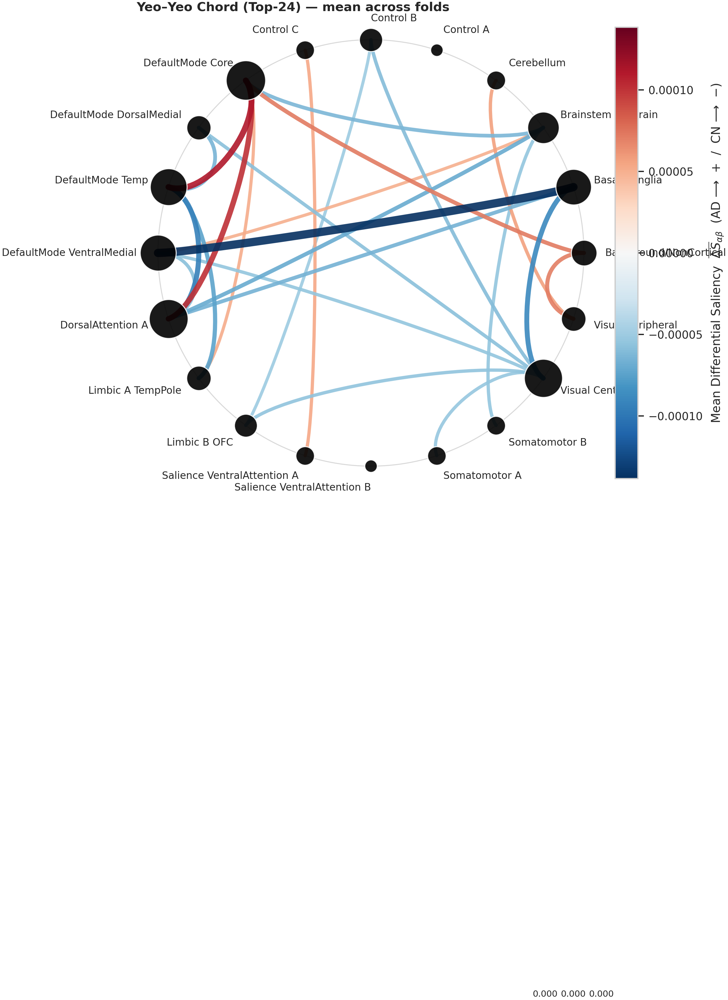

✅ Chord guardado en: Figures_Nature/fig_yeo_chord_top24_meanAcrossFolds.pdf  y  Figures_Nature/fig_yeo_chord_top24_meanAcrossFolds.png


In [48]:
# CÓDIGO CORREGIDO Y ROBUSTO PARA CELDA [41]
import pathlib # Importamos el módulo completo para ser explícitos

def savefig_nature(fig, path_no_ext):
    """Guarda .pdf y .png con metadatos y bbox correcto."""
    # Usamos pathlib.Path explícitamente para evitar cualquier ambigüedad.
    # Esto asegura que siempre usemos la función para rutas de archivos.
    path_obj = pathlib.Path(path_no_ext)
    
    fig.savefig(f"{path_obj}.pdf", bbox_inches="tight",
                metadata={"Creator": "Matplotlib", "Title": path_obj.name})
    fig.savefig(f"{path_obj}.png", bbox_inches="tight", dpi=600,
                metadata={"Creator": "Matplotlib"})
# ===================================================================
# CELDA: Chord (circos) Yeo↔Yeo — Top-K pares más relevantes
# ===================================================================
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap, ScalarMappable
from matplotlib.path import Path as MplPath
from matplotlib.patches import PathPatch, Circle

# --- Parámetros editables ---
TOP_K_PAIRS = 24          # nº de pares Yeo↔Yeo a mostrar (por |ΔS| medio)
AGGREGATE_ACROSS_FOLDS = True  # True: promedia todos los folds; False: usa un fold
FOLD_TO_SHOW = 1
CMAP = 'RdBu_r'           # divergente, centrado en 0
FIGSIZE = (7.2, 7.2)
R_BASE, R_LABEL = 1.00, 1.10  # radios para nodos y etiquetas
CURVE_INSET = 0.80       # 0..1, más chico = cuerdas más curvas

# --- Entradas esperadas: df_full y savefig_nature ya existen en tu notebook ---
ns = 'src_Refined_Network' if 'src_Refined_Network' in df_full.columns else 'src_Yeo17_Network'
nd = 'dst_Refined_Network' if 'dst_Refined_Network' in df_full.columns else 'dst_Yeo17_Network'

_df = df_full.copy()
if not AGGREGATE_ACROSS_FOLDS:
    _df = _df[_df['fold'] == FOLD_TO_SHOW].copy()

# Matriz Yeo↔Yeo de saliencia firmada (promedio)
mat = _df.groupby([ns, nd])['Saliency_Score'].mean().unstack(fill_value=0.0)
mat = (mat + mat.T) / 2  # simetrizar
# Asegurar orden estable (alfabético)
networks = sorted(mat.index.union(mat.columns))
mat = mat.reindex(index=networks, columns=networks).fillna(0.0)

# Convertir a lista de aristas Yeo↔Yeo con peso firmado y |peso|
edges = []
for i, a in enumerate(networks):
    for j, b in enumerate(networks):
        if j <= i: 
            continue  # sólo triángulo superior (evita duplicados y autolazos)
        w = float(mat.loc[a, b])
        edges.append((a, b, w, abs(w)))
# Top-K por magnitud
edges_top = sorted(edges, key=lambda t: t[3], reverse=True)[:TOP_K_PAIRS]

# Fuerza por nodo (para tamaño del punto del nodo)
node_strength = pd.Series(0.0, index=networks)
for a, b, w, aw in edges_top:
    node_strength[a] += aw
    node_strength[b] += aw
# Escala de tamaño de marcador
if node_strength.max() > 0:
    node_sizes = 100 + 900 * (node_strength / node_strength.max())  # puntos^2
else:
    node_sizes = pd.Series(200.0, index=networks)

# Layout circular
theta = np.linspace(0, 2*np.pi, len(networks), endpoint=False)
pos = {net: np.array([R_BASE*np.cos(t), R_BASE*np.sin(t)]) for net, t in zip(networks, theta)}

# Normalización y colormap
vmax = np.percentile([abs(w) for _,_,w,_ in edges_top], 98) or 1.0
norm = Normalize(vmin=-vmax, vmax=vmax)
cmap = get_cmap(CMAP)

def chord(ax, p1, p2, lw, color, alpha=0.85, inset=CURVE_INSET):
    """Bezier de 3 puntos: start -> ctrl1 -> ctrl2 -> end."""
    ctrl1 = p1 * inset
    ctrl2 = p2 * inset
    path_data = [
        (MplPath.MOVETO, p1),
        (MplPath.CURVE4, ctrl1),
        (MplPath.CURVE4, ctrl2),
        (MplPath.CURVE4, p2),
    ]
    path = MplPath([v for _, v in path_data], [c for c, _ in path_data])
    patch = PathPatch(path, facecolor='none', edgecolor=color, lw=lw, alpha=alpha, capstyle='round')
    ax.add_patch(patch)

# Figura
fig, ax = plt.subplots(figsize=FIGSIZE)
ax.set_aspect('equal'); ax.axis('off')

# Anillo tenue (opcional, look de circos)
ring = Circle((0,0), R_BASE, facecolor='none', edgecolor='0.85', lw=0.8, zorder=0)
ax.add_patch(ring)

# Dibujar cuerdas (primero las finas, luego las gruesas para buena oclusión)
# Escalado de grosor (línea) en pt
max_abs = max((aw for *_, aw in edges_top), default=1.0)
def width_from_abs(aw): return 0.6 + 6.0 * (aw / (max_abs + 1e-12))

for a, b, w, aw in sorted(edges_top, key=lambda t: t[3]):  # de fino a grueso
    color = cmap(norm(w))
    lw = width_from_abs(aw)
    chord(ax, pos[a], pos[b], lw=lw, color=color, alpha=0.9)

# Nodos y etiquetas
for k, (net, xy) in enumerate(pos.items()):
    ax.scatter([xy[0]], [xy[1]], s=node_sizes[net], zorder=5, edgecolor='white', linewidth=0.8, color='black', alpha=0.9)
    # etiqueta radial
    ang = np.arctan2(xy[1], xy[0])
    lx, ly = R_LABEL*np.cos(ang), R_LABEL*np.sin(ang)
    ha = 'left' if lx >= 0 else 'right'
    ax.text(lx, ly, net.replace('_',' '), fontsize=8, ha=ha, va='center')

# Colorbar (signo AD↔CN)
sm = ScalarMappable(norm=norm, cmap=cmap)
cbar = fig.colorbar(sm, ax=ax, fraction=0.045, pad=0.02)
cbar.set_label(r'Mean Differential Saliency  $\overline{\Delta S}_{\alpha\beta}$  (AD ⟶  +  /  CN ⟶  −)')

# Leyenda de grosor (tres referencias)
for frac, x in zip([0.33, 0.66, 1.0], [0.78, 0.84, 0.90]):
    wref = frac * max_abs
    ax.plot([x, x+0.06], [-1.08, -1.08], lw=width_from_abs(wref), color='0.2', transform=ax.transAxes)
    ax.text(x+0.065, -1.08, f'{wref:.3f}', fontsize=7, va='center', transform=ax.transAxes)

# ===================================================================
# ... (all your previous code is correct)
# ===================================================================

ax.set_title(f'Yeo–Yeo Chord (Top-{TOP_K_PAIRS}) — ' + ('mean across folds' if AGGREGATE_ACROSS_FOLDS else f'fold {FOLD_TO_SHOW}'),
             loc='left', fontsize=10, weight='bold')

# --- CORRECTED CODE ---
# Guardado
# 1. Build the filename suffix as a string
suffix = '_meanAcrossFolds' if AGGREGATE_ACROSS_FOLDS else f'_fold{FOLD_TO_SHOW}'

# 2. Construct the full filename stem
filename_stem = f'fig_yeo_chord_top{TOP_K_PAIRS}{suffix}'

# 3. Join the directory Path object with the filename string
# (Assuming FIG_DIR is a pathlib.Path object as implied by your original code)
outname = FIG_DIR / filename_stem

savefig_nature(fig, outname)
plt.show()

print(f"✅ Chord guardado en: {outname}.pdf  y  {outname}.png")


In [49]:
# ======================= CELDA NIVEL PRO: CHORD YEO↔YEO =======================
# - Defensiva ante columnas faltantes / NaNs / top_k > nº de pares
# - Título y archivos auto-coherentes con fold/aggregación
# - Guardado PDF (vectorial) + PNG (600 dpi) con metadatos y bbox tight
# ==============================================================================

import pathlib, warnings, datetime as _dt
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap, ScalarMappable
from matplotlib.path import Path as MplPath
from matplotlib.patches import PathPatch, Circle

# ---- Recomendaciones de exportación "estilo revista" ----
rcParams['pdf.fonttype'] = 42     # texto editable en Illustrator
rcParams['ps.fonttype']  = 42
rcParams['savefig.bbox'] = 'tight'
rcParams['savefig.pad_inches'] = 0.02

# -------- Helper para guardar figuras (PDF + PNG) con metadatos ----------
def savefig_nature(fig, path_no_ext, dpi_png=600, transparent_png=False, extra_meta=None):
    """
    Guarda .pdf y .png (alta resolución) con bbox tight y metadatos.
    Parameters
    ----------
    fig : matplotlib.figure.Figure
    path_no_ext : (str | Path)  ruta sin extensión (se crean .pdf y .png)
    dpi_png : int               DPI del PNG
    transparent_png : bool      Fondo transparente para PNG
    extra_meta : dict           Metadatos adicionales
    Returns
    -------
    (Path, Path)  rutas a PDF y PNG
    """
    p = pathlib.Path(path_no_ext)
    p.parent.mkdir(parents=True, exist_ok=True)

    base_meta = {
        "Creator": "Matplotlib",
        "Title": p.name,
        "Author": "Your Lab",
        "Subject": "Chord Yeo↔Yeo",
        "Keywords": "rs-fMRI, saliency, Yeo, chord",
        "CreationDate": _dt.datetime.now().strftime("%Y-%m-%d %H:%M")
    }
    if extra_meta:
        base_meta.update(extra_meta)

    pdf_path = p.with_suffix(".pdf")
    png_path = p.with_suffix(".png")

    fig.savefig(pdf_path, metadata=base_meta)
    fig.savefig(png_path, dpi=dpi_png, transparent=transparent_png,
                metadata={k: v for k, v in base_meta.items() if k != "Title"})
    return pdf_path, png_path

# -------------------- Funciones de dibujo --------------------
def _bezier_chord(ax, p1, p2, lw, color, alpha=0.9, inset=0.80):
    """Bezier cúbica con dos puntos de control radiales (look circos)."""
    ctrl1, ctrl2 = p1 * inset, p2 * inset
    path = MplPath([p1, ctrl1, ctrl2, p2], [MplPath.MOVETO, MplPath.CURVE4,
                                            MplPath.CURVE4, MplPath.CURVE4])
    ax.add_patch(PathPatch(path, facecolor='none', edgecolor=color,
                           lw=lw, alpha=alpha, capstyle='round'))

def plot_yeo_chord(
    df,
    ns_col=None, nd_col=None,
    value_col="Saliency_Score",
    aggregate_across_folds=True,
    fold_to_show=1,
    top_k=24,
    cmap_name="RdBu_r",
    figsize=(7.2, 7.2),
    r_base=1.00, r_label=1.10,
    curve_inset=0.80,
):
    """
    Dibuja el chord Yeo↔Yeo de Top-K pares por |ΔS| medio.
    Devuelve (fig, ax, edges_top, networks, title_suffix_str)
    """
    # --- Detecta columnas de redes si no se pasan explícitas ---
    cand_ns = ["src_Refined_Network", "src_Yeo17_Network"]
    cand_nd = ["dst_Refined_Network", "dst_Yeo17_Network"]
    ns = ns_col or next((c for c in cand_ns if c in df.columns), None)
    nd = nd_col or next((c for c in cand_nd if c in df.columns), None)
    if ns is None or nd is None:
        raise ValueError(f"No encuentro columnas de redes. Busqué {cand_ns} y {cand_nd}")

    if value_col not in df.columns:
        raise ValueError(f"No existe la columna de valor '{value_col}' en df.")

    _df = df[[ns, nd, value_col] + (["fold"] if "fold" in df.columns else [])].dropna(subset=[ns, nd, value_col])

    # --- Agregación por fold ---
    if not aggregate_across_folds and "fold" in _df.columns:
        _df = _df[_df["fold"] == fold_to_show].copy()
        title_suffix = f"fold {fold_to_show}"
    else:
        title_suffix = "mean across folds"
        if not aggregate_across_folds and "fold" not in _df.columns:
            warnings.warn("No hay columna 'fold'; se promedia todo.", RuntimeWarning)

    # --- Matriz Yeo↔Yeo promedio (simetrizada) ---
    mat = _df.groupby([ns, nd])[value_col].mean().unstack(fill_value=0.0)
    mat = (mat + mat.T) / 2  # simetrizar
    networks = sorted(mat.index.union(mat.columns))
    mat = mat.reindex(index=networks, columns=networks).fillna(0.0)

    # --- Lista de aristas y Top-K por magnitud ---
    edges = []
    for i, a in enumerate(networks):
        for j, b in enumerate(networks):
            if j <= i:
                continue
            w = float(mat.loc[a, b])
            edges.append((a, b, w, abs(w)))

    if len(edges) == 0:
        raise ValueError("No hay pares Yeo↔Yeo para graficar (0 aristas).")

    k = int(min(top_k, len(edges)))
    edges_top = sorted(edges, key=lambda t: t[3], reverse=True)[:k]

    # --- Fuerza de nodo para tamaño ---
    node_strength = pd.Series(0.0, index=networks)
    for a, b, w, aw in edges_top:
        node_strength[a] += aw; node_strength[b] += aw
    node_sizes = (100 + 900 * (node_strength / node_strength.max())) if node_strength.max() > 0 else pd.Series(200.0, index=networks)

    # --- Layout circular determinista ---
    theta = np.linspace(0, 2*np.pi, len(networks), endpoint=False)
    pos = {net: np.array([r_base*np.cos(t), r_base*np.sin(t)]) for net, t in zip(networks, theta)}

    # --- Color y normalización (robusto si pesos ~0) ---
    vmax = np.percentile([aw for *_, aw in edges_top], 98)
    if not np.isfinite(vmax) or vmax <= 0:
        vmax = 1.0
    norm = Normalize(vmin=-vmax, vmax=vmax)
    cmap = get_cmap(cmap_name)

    # --- Figura ---
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_aspect('equal'); ax.axis('off')
    ax.add_patch(Circle((0, 0), r_base, facecolor='none', edgecolor='0.85', lw=0.8, zorder=0))

    # --- Grosor (de fino a grueso para oclusión bonita) ---
    max_abs = max((aw for *_, aw in edges_top), default=1.0)
    def width_from_abs(aw):
        # evita grosor 0 y satura en 6 pt aprox.
        return float(np.clip(0.6 + 6.0 * (aw / (max_abs + 1e-12)), 0.6, 6.5))

    for a, b, w, aw in sorted(edges_top, key=lambda t: t[3]):  # de fino a grueso
        _bezier_chord(ax, pos[a], pos[b], lw=width_from_abs(aw), color=cmap(norm(w)), alpha=0.9, inset=curve_inset)

    # --- Nodos + etiquetas radiales ---
    for net, xy in pos.items():
        ax.scatter([xy[0]], [xy[1]], s=node_sizes[net], zorder=5,
                   edgecolor='white', linewidth=0.8, color='black', alpha=0.9)
        ang = np.arctan2(xy[1], xy[0])
        lx, ly = r_label*np.cos(ang), r_label*np.sin(ang)
        ha = 'left' if lx >= 0 else 'right'
        ax.text(lx, ly, net.replace('_', ' '), fontsize=8, ha=ha, va='center')

    # --- Colorbar (signo AD↔CN) ---
    sm = ScalarMappable(norm=norm, cmap=cmap)
    cbar = fig.colorbar(sm, ax=ax, fraction=0.045, pad=0.02)
    cbar.set_label(r'Mean Differential Saliency  $\overline{\Delta S}_{\alpha\beta}$  (AD $\to$ +  /  CN $\to$ −)')

    # --- Leyenda de grosor (3 referencias en coords de ejes) ---
    for frac, x in zip([0.33, 0.66, 1.0], [0.78, 0.84, 0.90]):
        wref = frac * max_abs
        ax.plot([x, x+0.06], [-1.08, -1.08], lw=width_from_abs(wref),
                color='0.2', transform=ax.transAxes, clip_on=False)
        ax.text(x+0.065, -1.08, f'{wref:.3f}', fontsize=7, va='center',
                transform=ax.transAxes)

    ax.set_title(f'Yeo–Yeo Chord (Top-{k}) — {title_suffix}',
                 loc='left', fontsize=10, weight='bold')

    return fig, ax, edges_top, networks, title_suffix

# ======================== PARÁMETROS EDITABLES ========================
TOP_K_PAIRS = 24
AGGREGATE_ACROSS_FOLDS = True   # True: promedia; False: usa un fold
FOLD_TO_SHOW = 1
CMAP = 'RdBu_r'
FIGSIZE = (7.2, 7.2)
R_BASE, R_LABEL = 1.00, 1.10
CURVE_INSET = 0.80
FIG_DIR = pathlib.Path("Figures")  # <-- que coincida con \graphicspath en LaTeX

# Detecta automáticamente ns/nd como en tu versión
ns = 'src_Refined_Network' if 'src_Refined_Network' in df_full.columns else 'src_Yeo17_Network'
nd = 'dst_Refined_Network' if 'dst_Refined_Network' in df_full.columns else 'dst_Yeo17_Network'

# ======================== EJECUCIÓN Y GUARDADO ========================
fig, ax, edges_top, networks, title_suffix = plot_yeo_chord(
    df_full, ns_col=ns, nd_col=nd, value_col="Saliency_Score",
    aggregate_across_folds=AGGREGATE_ACROSS_FOLDS, fold_to_show=FOLD_TO_SHOW,
    top_k=TOP_K_PAIRS, cmap_name=CMAP, figsize=FIGSIZE,
    r_base=R_BASE, r_label=R_LABEL, curve_inset=CURVE_INSET,
)

# Nombre coherente con los parámetros (para usar directo en LaTeX)
suffix = '_meanAcrossFolds' if AGGREGATE_ACROSS_FOLDS else f'_fold{FOLD_TO_SHOW}'
filename_stem = f'fig_yeo_chord_top{TOP_K_PAIRS}{suffix}'
outname = FIG_DIR / filename_stem

pdf_path, png_path = savefig_nature(fig, outname, dpi_png=600, transparent_png=False)
plt.close(fig)

print("✅ Chord guardado en:")
print(f"   • {pdf_path}")
print(f"   • {png_path}")
# =============================================================================


/tmp/ipykernel_146659/2369746044.py:141: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap(cmap_name)
/tmp/ipykernel_146659/2369746044.py:53: UserWarning: Bad value for infodict keyword CreationDate. Got '2025-10-08 22:40' which is not an instance of datetime.datetime.
  fig.savefig(pdf_path, metadata=base_meta)


✅ Chord guardado en:
   • Figures/fig_yeo_chord_top24_meanAcrossFolds.pdf
   • Figures/fig_yeo_chord_top24_meanAcrossFolds.png
